In [1]:
# import packages
import warnings
import os
import tensorflow as tf
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import math
import sys
import time
import random
from sklearn import metrics
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX

from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from xgboost import XGBRegressor
from xgboost import plot_importance
from datetime import timedelta

from tensorflow import keras
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import LSTM, Dense, Reshape

import xgboost as xgb
from sklearn.metrics import mean_squared_error
color_pal = sns.color_palette()
plt.style.use('fivethirtyeight')

warnings.filterwarnings('ignore')


In [2]:
df_month = pd.read_csv(
    './data/Road Crash Statistics in Quezon City (2018-2022) - Classification by Month per case basis .csv', index_col=False)
df_hour = pd.read_csv(
    './data/Road Crash Statistics in Quezon City (2018-2022) - Classification by Time of Day.csv', index_col=False)


In [3]:
df_month.head()


,Year,Month,Damage to Property,Fatal,Non Fatal Injury,Grand Total
0,2018,January,2743,7,403,3153
1,2018,February,2621,7,423,3051
2,2018,March,2711,12,475,3198
3,2018,April,2573,7,417,2997
4,2018,May,2721,10,432,3163


In [4]:
df_hour.head()

,Year,Time Hour,Damage to Property,Fatal,Non Fatal Injury,Grand Total
0,2018,00:00-00:59,599,3.0,162,764
1,2018,01:00-01:59,551,8.0,132,691
2,2018,02:00-02:59,469,7.0,130,606
3,2018,03:00-03:59,449,12.0,128,589
4,2018,04:00-04:59,565,12.0,140,717


In [5]:
DEPENDENT_VARIABLE = "Grand Total"

In [6]:
df_month[DEPENDENT_VARIABLE] = df_month[DEPENDENT_VARIABLE].fillna(0)
df_month[DEPENDENT_VARIABLE] = df_month[DEPENDENT_VARIABLE].apply(
    lambda x: 0 if x == 0 or x == '' or x == ' '
    else float(
        str(x).replace(',', '').replace('', ''))
)


In [7]:
df_hour[DEPENDENT_VARIABLE] = df_hour[DEPENDENT_VARIABLE].fillna(0)
df_hour[DEPENDENT_VARIABLE] = df_hour[DEPENDENT_VARIABLE].apply(
    lambda x: 0 if x == 0 or x == '' or x == ' '
    else float(
        str(x).replace(',', '').replace('', ''))
)


In [8]:
df_month.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 60 entries, 0 to 59
Data columns (total 6 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Year                60 non-null     int64  
 1   Month               60 non-null     object 
 2   Damage to Property  60 non-null     int64  
 3   Fatal               60 non-null     int64  
 4   Non Fatal Injury    60 non-null     int64  
 5   Grand Total         60 non-null     float64
dtypes: float64(1), int64(4), object(1)
memory usage: 2.9+ KB


In [9]:
df_hour.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 125 entries, 0 to 124
Data columns (total 6 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Year                125 non-null    int64  
 1   Time Hour           125 non-null    object 
 2   Damage to Property  125 non-null    int64  
 3   Fatal               121 non-null    float64
 4   Non Fatal Injury    125 non-null    int64  
 5   Grand Total         125 non-null    float64
dtypes: float64(2), int64(3), object(1)
memory usage: 6.0+ KB


In [10]:
df_month.describe()


,Year,Damage to Property,Fatal,Non Fatal Injury,Grand Total
count,60.000000,60.000000,60.000000,60.000000,60.000000
mean,2020.000000,2012.816667,9.400000,460.300000,2482.516667
std,1.426148,735.276738,3.092912,83.087314,777.578063
min,2018.000000,249.000000,1.000000,164.000000,414.000000
25%,2019.000000,1444.250000,7.000000,416.500000,1842.500000
50%,2020.000000,1834.500000,10.000000,456.500000,2348.000000
75%,2021.000000,2725.750000,11.000000,518.000000,3186.750000
max,2022.000000,3162.000000,18.000000,648.000000,3711.000000


In [11]:
df_hour.describe()


,Year,Damage to Property,Fatal,Non Fatal Injury,Grand Total
count,125.000000,125.000000,121.000000,125.000000,125.000000
mean,2020.000000,966.152000,4.661157,220.944000,1191.608000
std,1.419905,561.889354,2.706639,82.841697,621.695223
min,2018.000000,13.000000,1.000000,10.000000,25.000000
25%,2019.000000,481.000000,3.000000,166.000000,674.000000
50%,2020.000000,1004.000000,4.000000,239.000000,1262.000000
75%,2021.000000,1283.000000,6.000000,275.000000,1508.000000
max,2022.000000,2095.000000,14.000000,420.000000,2384.000000


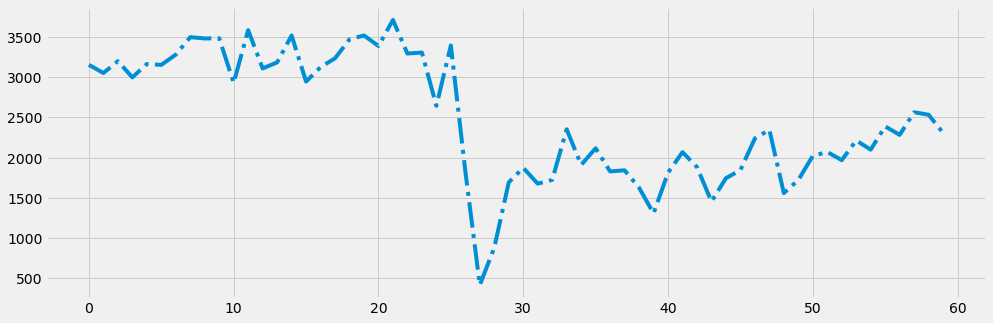

In [12]:
df_month[DEPENDENT_VARIABLE].plot(style='-.',figsize=(15, 5))
plt.show()


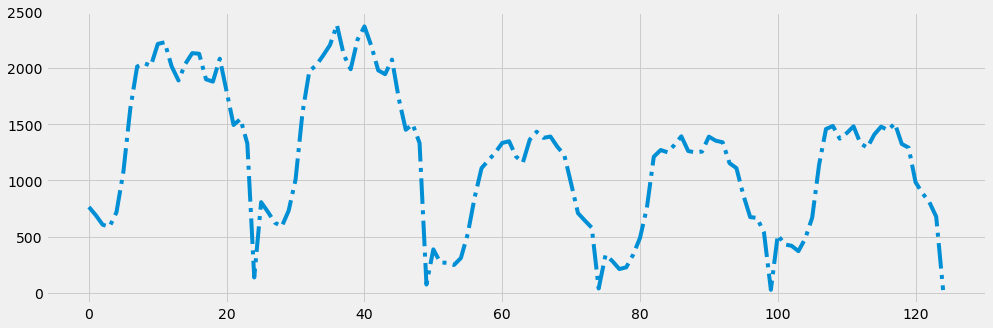

In [13]:
df_hour[DEPENDENT_VARIABLE].plot(style='-.', figsize=(15, 5),)
plt.show()

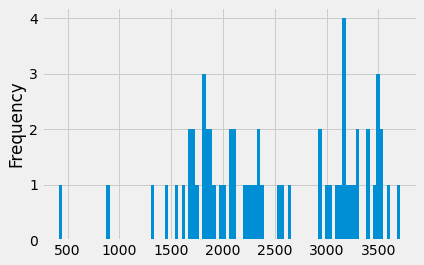

In [14]:
df_month[DEPENDENT_VARIABLE].plot(kind='hist', bins=100);

<AxesSubplot:ylabel='Frequency'>

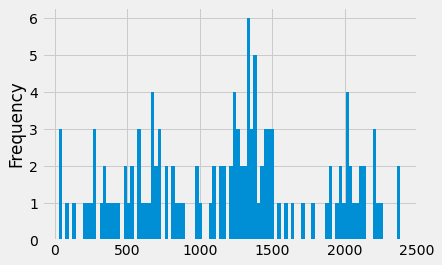

In [15]:
df_hour[DEPENDENT_VARIABLE].plot(kind='hist', bins=100)


In [16]:
from dateutil.relativedelta import relativedelta, MO
dtime_day = {
    "00:00-00:59": "Night",
    "01:00-01:59": "Night",
    "02:00-02:59": "Night",
    "03:00-03:59": "Night",
    "04:00-04:59": "Night",
    "05:00-05:59": "Morning",
    "06:00-06:59": "Morning",
    "07:00-07:59": "Morning",
    "08:00-08:59": "Morning",
    "09:00-09:59": "Morning",
    "10:00-10:59": "Morning",
    "11:00-11:59": "Morning",
    "12:00-12:59": "Afternoon",
    "13:00-13:59": "Afternoon",
    "14:00-14:59": "Afternoon",
    "15:00-15:59": "Afternoon",
    "16:00-16:59": "Afternoon",
    "17:00-17:59": "Afternoon",
    "18:00-18:59": "Evening",
    "19:00-19:59": "Evening",
    "20:00-20:59": "Night",
    "21:00-21:59": "Night",
    "22:00-22:59": "Night",
    "23:00-23:59": "Night",
    "Time Not Stated": "unkown",
}

# 0 - Not rush hour
# 1 - Rush hour
'''
Worst traffic is at 7AM to 9AM and on 5PM to 9PM
Medium traffic is at 9AM to 10AM and on 9PM to 11PM
Low Traffic rest of the Hour
'''
rush_hour = {
    "00:00-00:59":  "Low",
    "01:00-01:59":  "Low",
    "02:00-02:59": "Low",
    "03:00-03:59": "Low",
    "04:00-04:59": "Low",
    "05:00-05:59": "Low",
    "06:00-06:59": "Low",
    "07:00-07:59": "High",
    "08:00-08:59": "High",
    "09:00-09:59": "Medium",
    "10:00-10:59": "Low",
    "11:00-11:59": "Low",
    "12:00-12:59": "Low",
    "13:00-13:59": "Low",
    "14:00-14:59": "Low",
    "15:00-15:59": "Low",
    "16:00-16:59": "Low",
    "17:00-17:59": "High",
    "18:00-18:59": "High",
    "19:00-19:59": "High",
    "20:00-20:59": "High",
    "21:00-21:59": "Medium",
    "22:00-22:59": "Medium",
    "23:00-23:59": "Medium",
    "Time Not Stated": "Neutral",
}


def create_features_monthly(df, target_variable):
    df['Year'] = df['Year'].apply(lambda x: int(x))
    X = df[[
        'Year', 'Month', DEPENDENT_VARIABLE
    ]]
    X = pd.get_dummies(X, columns=['Month'])
    if target_variable:
        y = df[target_variable]
        return X, y
    return X


def create_features_hourly(df, target_variable):
    def hourmin_decimal(time, index):
        if time == 'Time Not Stated':
            return -1
        time = time.split('-')[index].split(':')
        hour = int(time[0])
        minutes = int(time[-1])
        return int(hour) * 3600 + int(minutes) * 60

    df['Year'] = df['Year'].apply(lambda x: int(x))
    df['Day Time'] = df['Time Hour'].apply(lambda x:  dtime_day[x])
    df['Hour Start'] = df['Time Hour'].apply(lambda x: hourmin_decimal(x, 0))
    df['Hour End'] = df['Time Hour'].apply(lambda x: hourmin_decimal(x, -1))
    df['Traffic'] = df['Time Hour'].apply(lambda x: rush_hour[x])
    X = df[[
        'Year', 'Day Time', 'Hour Start', 'Hour End', 'Traffic', DEPENDENT_VARIABLE
    ]]
    X = pd.get_dummies(X, columns=['Day Time', 'Traffic'])
    if target_variable:
        y = df[target_variable]
        return X, y
    return X


def mean_absolute_percentage_error_func(y_true, y_pred):
    '''
    Calculate the mean absolute percentage error as a metric for evaluation
    
    Args:
        y_true (float64): Y values for the dependent variable (test part), numpy array of floats 
        y_pred (float64): Predicted values for the dependen variable (test parrt), numpy array of floats
    
    Returns:
        Mean absolute percentage error 
    '''
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    mape = np.mean(np.abs((y_true - y_pred) / y_true))
    return mape


def timeseries_evaluation_metrics_func(y_true, y_pred):
    '''
    Calculate the following evaluation metrics:
        - MSE
        - MAE
        - RMSE
        - MAPE
        - R²
    
    Args:
        y_true (float64): Y values for the dependent variable (test part), numpy array of floats 
        y_pred (float64): Predicted values for the dependen variable (test parrt), numpy array of floats
    
    Returns:
        MSE, MAE, RMSE, MAPE and R² 
    '''
    # print('Evaluation metric results: ')
    mse = metrics.mean_squared_error(y_true, y_pred)
    mae = metrics.mean_absolute_error(y_true, y_pred)
    rmse = np.sqrt(metrics.mean_squared_error(y_true, y_pred))
    mape = mean_absolute_percentage_error_func(y_true, y_pred)
    r2 = metrics.r2_score(y_true, y_pred)
    return {"mse": mse, "mae": mae, "rmse": rmse, "mape": mape, "r2": r2}, [mse, mae, rmse, mape, r2 ]


def dataframe_splitter(arr, indexes_range):
    result = [[] for i in range(indexes_range)]
    for i in range(indexes_range):
        result[i] = [j[i] for j in arr]
    return result


def time_series_split(data_frame, target_column_name, n_splits=7):
    X = data_frame.drop(target_column_name, axis=1)
    y = data_frame[target_column_name]

    tscv = TimeSeriesSplit(n_splits=n_splits)
    train_test_sets = []

    for train_index, test_index in tscv.split(X):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]
        train_test_sets.append((X_train, y_train, X_test, y_test))

    return train_test_sets


def time_based_split(data, train_pct):
    train_size = int(len(data) * train_pct)
    train, test = data[:train_size], data[train_size:]
    return train, test

def print_values_metrics(model_name, metric_dict):
  printed_metrics = ''.join(
      [f' ({i}: {round(metric_dict[i], 4):,})\t' for i in metric_dict])
  print(f"{printed_metrics}: {model_name}")


In [17]:
from sklearn.model_selection import cross_val_score, GridSearchCV
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import KFold
import itertools
from sklearn.preprocessing import LabelEncoder
from sklearn.gaussian_process.kernels import RBF, Matern
from sklearn.linear_model import (LinearRegression, Ridge, Lasso, ElasticNet, BayesianRidge,
                                  OrthogonalMatchingPursuit, ARDRegression, LogisticRegression,
                                  PoissonRegressor, GammaRegressor, TweedieRegressor, PassiveAggressiveRegressor,
                                  RANSACRegressor, TheilSenRegressor, HuberRegressor)



from sklearn.svm import (SVR, NuSVR, LinearSVR)
from sklearn.tree import (DecisionTreeRegressor)
from sklearn.ensemble import (ExtraTreesRegressor, AdaBoostRegressor,
                              GradientBoostingRegressor, HistGradientBoostingRegressor, RandomForestRegressor)
from sklearn.neighbors import (RadiusNeighborsRegressor)
from sklearn.neural_network import (MLPRegressor)
from sklearn.gaussian_process import (GaussianProcessRegressor)
from xgboost import XGBRegressor, XGBRFRegressor
from statsmodels.tsa.statespace.sarimax import SARIMAX

# LSTM custom
# LSTM + Transfer Learning


include_params = False

def linear_regression(trainX, trainY, testX):
    param_grid = {
        'fit_intercept': [True, False],
    }
    model = LinearRegression()
    model = GridSearchCV(model, param_grid if include_params else {}, cv=5)
    model.fit(trainX, trainY)

    # Get the best model from the GridSearchCV object
    best_model_hour = model.best_estimator_
    predicted_results_hour = best_model_hour.predict(testX)
    return predicted_results_hour

def ridge(trainX, trainY, testX):
    param_grid = {
        'alpha': [1, 0.1, 0.01, 0.001, 0.0001, 0], 
        "fit_intercept": [True, False], 
        "solver": ['svd', 'cholesky', 'lsqr', 'sparse_cg', 'sag', 'saga']
    }
    model = Ridge()
    model = GridSearchCV(model, param_grid if include_params else {}, cv=5)
    model.fit(trainX, trainY)

    # Get the best model from the GridSearchCV object
    best_model_hour = model.best_estimator_
    predicted_results_hour = best_model_hour.predict(testX)
    return predicted_results_hour

def lasso(trainX, trainY, testX):
    param_grid = {
        'alpha': [0.001, 0.01, 0.1, 1, 10, 100],
        'fit_intercept': [True, False],
        'max_iter': [500, 1000, 2000, 5000],
        'tol': [1e-5, 1e-4, 1e-3],
        'warm_start': [True, False],
        'positive': [True, False],
    }
    model = Lasso()
    model = GridSearchCV(model, param_grid if include_params else {}, cv=5)
    model.fit(trainX, trainY)

    # Get the best model from the GridSearchCV object
    best_model_hour = model.best_estimator_
    predicted_results_hour = best_model_hour.predict(testX)
    return predicted_results_hour

def elastic_net(trainX, trainY, testX):
    param_grid = {
        'alpha': [0.001, 0.01, 0.1, 1, 10, 100],
        'l1_ratio': [0.1, 0.3, 0.5, 0.7, 0.9],
        'fit_intercept': [True, False],
        'max_iter': [500, 1000, 2000, 5000],
        'tol': [1e-5, 1e-4, 1e-3],
        'warm_start': [True, False],
        'positive': [True, False],
    }
    model = ElasticNet()
    model = GridSearchCV(model, param_grid if include_params else {}, cv=5)
    model.fit(trainX, trainY)

    # Get the best model from the GridSearchCV object
    best_model_hour = model.best_estimator_
    predicted_results_hour = best_model_hour.predict(testX)
    return predicted_results_hour

def bayesian_ridge(trainX, trainY, testX):
    param_grid = {
        'alpha_1': [1e-6, 1e-5, 1e-4, 1e-3],
        'alpha_2': [1e-6, 1e-5, 1e-4, 1e-3],
        'lambda_1': [1e-6, 1e-5, 1e-4, 1e-3],
        'lambda_2': [1e-6, 1e-5, 1e-4, 1e-3],
        'fit_intercept': [True, False],
        'tol': [1e-5, 1e-4, 1e-3]
    }
    model = BayesianRidge()
    model = GridSearchCV(model,  param_grid if include_params else {}, cv=5)
    model.fit(trainX, trainY)

    # Get the best model from the GridSearchCV object
    best_model_hour = model.best_estimator_
    predicted_results_hour = best_model_hour.predict(testX)
    return predicted_results_hour

def orthogonal_matching_pursuit(trainX, trainY, testX):
    param_grid = {
        'n_nonzero_coefs': list(range(1, trainX.shape[1] + 1)),
        'fit_intercept': [True, False]
    }
    model = OrthogonalMatchingPursuit()
    model = GridSearchCV(model,  param_grid if include_params else {}, cv=5)
    model.fit(trainX, trainY)

    # Get the best model from the GridSearchCV object
    best_model_hour = model.best_estimator_
    predicted_results_hour = best_model_hour.predict(testX)
    return predicted_results_hour

def ard_regression(trainX, trainY, testX):
    param_grid = {
        'alpha_1': [1e-6, 1e-5, 1e-4, 1e-3],
        'alpha_2': [1e-6, 1e-5, 1e-4, 1e-3],
        'lambda_1': [1e-6, 1e-5, 1e-4, 1e-3],
        'lambda_2': [1e-6, 1e-5, 1e-4, 1e-3],
        'fit_intercept': [True, False],
        'tol': [1e-5, 1e-4, 1e-3]
    }
    model = ARDRegression()
    model = GridSearchCV(model,  param_grid if include_params else {}, cv=5)
    model.fit(trainX, trainY)

    # Get the best model from the GridSearchCV object
    best_model_hour = model.best_estimator_
    predicted_results_hour = best_model_hour.predict(testX)
    return predicted_results_hour

def logistic_regression(trainX, trainY, testX):
    param_grid = {
        'penalty': ['l1', 'l2', 'elasticnet', 'none'],
        'C': [0.001, 0.01, 0.1, 1, 10, 100],
        'fit_intercept': [True, False],
        'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'],
        'max_iter': [50, 100, 200, 500],
        'tol': [1e-5, 1e-4, 1e-3]
    }
    model = LogisticRegression()

    model = GridSearchCV(
        model,  param_grid if include_params else {}, cv=KFold(n_splits=5))
    model.fit(trainX, trainY)

    # Get the best model from the GridSearchCV object
    best_model_hour = model.best_estimator_
    predicted_results_hour = best_model_hour.predict(testX)
    return predicted_results_hour

def poisson_regressor(trainX, trainY, testX):
    param_grid = {
        'alpha': [0.0, 0.001, 0.01, 0.1, 1, 10],
        'fit_intercept': [True, False],
        'max_iter': [50, 100, 200, 500],
        'tol': [1e-5, 1e-4, 1e-3],
        'warm_start': [True, False]
    }
    model = PoissonRegressor()

    model = GridSearchCV(
        model,  param_grid if include_params else {}, cv=5)
    model.fit(trainX, trainY)

    # Get the best model from the GridSearchCV object
    best_model_hour = model.best_estimator_
    predicted_results_hour = best_model_hour.predict(testX)
    return predicted_results_hour

def gamma_regressor(trainX, trainY, testX):
    param_grid = {
        'alpha': [0.0, 0.001, 0.01, 0.1, 1, 10],
        'fit_intercept': [True, False],
        'max_iter': [50, 100, 200, 500],
        'tol': [1e-5, 1e-4, 1e-3],
        'warm_start': [True, False]
    }
    model = GammaRegressor()

    model = GridSearchCV(
        model,  param_grid if include_params else {}, cv=5)
    model.fit(trainX, trainY)

    # Get the best model from the GridSearchCV object
    best_model_hour = model.best_estimator_
    predicted_results_hour = best_model_hour.predict(testX)
    return predicted_results_hour

def tweedie_regressor(trainX, trainY, testX):
    param_grid = {
        'alpha': [0.0, 0.001, 0.01, 0.1, 1, 10],
        'power': [0, 1, 1.5, 2, 3],
        'fit_intercept': [True, False],
        'max_iter': [50, 100, 200, 500],
        'tol': [1e-5, 1e-4, 1e-3],
        'warm_start': [True, False]
    }
    model = TweedieRegressor()

    model = GridSearchCV(
        model,  param_grid if include_params else {}, cv=5)
    model.fit(trainX, trainY)

    # Get the best model from the GridSearchCV object
    best_model_hour = model.best_estimator_
    predicted_results_hour = best_model_hour.predict(testX)
    return predicted_results_hour

def passive_aggressive_regressor(trainX, trainY, testX):
    param_grid = {
        'C': [0.001, 0.01, 0.1, 1, 10, 100],
        'fit_intercept': [True, False],
        'max_iter': [50, 100, 200, 500],
        'tol': [1e-5, 1e-4, 1e-3],
        'early_stopping': [True, False],
        'validation_fraction': [0.1, 0.2, 0.3],
        'n_iter_no_change': [5, 10, 15],
        'shuffle': [True, False],
        'warm_start': [True, False]
    }
    model = PassiveAggressiveRegressor()

    model = GridSearchCV(
        model,  param_grid if include_params else {}, cv=5)
    model.fit(trainX, trainY)

    # Get the best model from the GridSearchCV object
    best_model_hour = model.best_estimator_
    predicted_results_hour = best_model_hour.predict(testX)
    return predicted_results_hour

def ransac_regressor(trainX, trainY, testX):
    param_grid = {
        #'min_samples': [0.1, 0.2, 0.3, 0.4, 0.5],
        'residual_threshold': [1, 5, 10, 20],
        'max_trials': [100, 500, 1000],
        'stop_n_inliers': [50, 100, 200],
        'stop_score': [0.9, 0.95, 0.99],
        'stop_probability': [0.9, 0.95, 0.99],
        'loss': ['squared_error', 'absolute_error']
    }
    model = RANSACRegressor()
    model = GridSearchCV(
        model,  param_grid if include_params else {}, cv=5)
    model.fit(trainX, trainY)

    # Get the best model from the GridSearchCV object
    best_model_hour = model.best_estimator_
    predicted_results_hour = best_model_hour.predict(testX)
    return predicted_results_hour

def theil_sen_regressor(trainX, trainY, testX):
    param_grid = {
        'fit_intercept': [True, False],
        'copy_X': [True, False],
        'max_subpopulation': [1e4, 1e5, 1e6],
        'n_subsamples': [None, 50, 100, 200],
        'max_iter': [50, 100, 200, 500],
        'tol': [1e-5, 1e-4, 1e-3],
    }
    model = TheilSenRegressor()
    model = GridSearchCV(
        model,  param_grid if include_params else {}, cv=5)
    model.fit(trainX, trainY)

    # Get the best model from the GridSearchCV object
    best_model_hour = model.best_estimator_
    predicted_results_hour = best_model_hour.predict(testX)
    return predicted_results_hour

def huber_regressor(trainX, trainY, testX):
    param_grid = {
        'epsilon': [1.0, 1.5, 2.0],
        'fit_intercept': [True, False],
        'alpha': [0.0001, 0.001, 0.01, 0.1],
        'max_iter': [50, 100, 200, 500],
        'tol': [1e-5, 1e-4, 1e-3],
        'warm_start': [True, False]
    }
    model = HuberRegressor()
    model = GridSearchCV(
        model,  param_grid if include_params else {}, cv=5)
    model.fit(trainX, trainY)

    # Get the best model from the GridSearchCV object
    best_model_hour = model.best_estimator_
    predicted_results_hour = best_model_hour.predict(testX)
    return predicted_results_hour

def svr(trainX, trainY, testX):
    param_grid = {
        'C': [0.01, 0.1, 1, 10, 100],
        'kernel': ['linear', 'poly', 'rbf', 'sigmoid'],
        'degree': [2, 3, 4],
        'gamma': ['scale', 'auto'] + [0.001, 0.01, 0.1, 1, 10],
        'coef0': [-1, 0, 1],
        'shrinking': [True, False],
        'tol': [1e-5, 1e-4, 1e-3],
    }
    model = SVR()
    model = GridSearchCV(
        model,  param_grid if include_params else {}, cv=5)
    model.fit(trainX, trainY)

    # Get the best model from the GridSearchCV object
    best_model_hour = model.best_estimator_
    predicted_results_hour = best_model_hour.predict(testX)
    return predicted_results_hour
    
def nu_svr(trainX, trainY, testX):
    param_grid = {
        'C': [0.01, 0.1, 1, 10, 100],
        'kernel': ['linear', 'poly', 'rbf', 'sigmoid'],
        'degree': [2, 3, 4],
        'gamma': ['scale', 'auto'] + [0.001, 0.01, 0.1, 1, 10],
        'coef0': [-1, 0, 1],
        'nu': [0.1, 0.3, 0.5, 0.7, 0.9],
        'shrinking': [True, False],
        'tol': [1e-5, 1e-4, 1e-3],
    }
    model = NuSVR()
    model = GridSearchCV(
        model,  param_grid if include_params else {}, cv=5)
    model.fit(trainX, trainY)

    # Get the best model from the GridSearchCV object
    best_model_hour = model.best_estimator_
    predicted_results_hour = best_model_hour.predict(testX)
    return predicted_results_hour

def linear_svr(trainX, trainY, testX):
    param_grid = {
        'epsilon': [0.01, 0.1, 1, 10],
        'C': [0.01, 0.1, 1, 10, 100],
        'loss': ['epsilon_insensitive', 'squared_epsilon_insensitive'],
        'fit_intercept': [True, False],
        'intercept_scaling': [1, 2, 3],
        'dual': [True, False],
        'tol': [1e-5, 1e-4, 1e-3],
        'max_iter': [50, 100, 200, 500],
    }
    model = LinearSVR()
    model = GridSearchCV(
        model,  param_grid if include_params else {}, cv=5)
    model.fit(trainX, trainY)

    # Get the best model from the GridSearchCV object
    best_model_hour = model.best_estimator_
    predicted_results_hour = best_model_hour.predict(testX)
    return predicted_results_hour

def decision_tree_regressor(trainX, trainY, testX):
    param_grid = {
        'criterion': ['mse', 'friedman_mse', 'mae'],
        'max_depth': [None, 5, 10, 15],
        #'min_samples_split': [2, 5, 10, 15],
        #'min_samples_leaf': [1, 2, 5, 10],
        'max_leaf_nodes': [None, 5, 10, 15],
        'min_impurity_decrease': [0.0, 0.1, 0.2],
    }
    model = DecisionTreeRegressor()
    model = GridSearchCV(
        model,  param_grid if include_params else {}, cv=5)
    model.fit(trainX, trainY)

    # Get the best model from the GridSearchCV object
    best_model_hour = model.best_estimator_
    predicted_results_hour = best_model_hour.predict(testX)
    return predicted_results_hour

def extra_trees_regressor(trainX, trainY, testX):
    param_grid = {
        'n_estimators': [50, 100, 200, 500],
        'criterion': ['mse', 'mae', 'friedman_mse', 'poisson'],
        'max_depth': [None, 5, 10, 15],
        #'min_samples_split': [2, 5, 10, 15],
        #'min_samples_leaf': [1, 2, 5, 10],
        'max_features': ['auto', 'sqrt', 'log2'],
        'max_leaf_nodes': [None, 5, 10, 15],
        'min_impurity_decrease': [0.0, 0.1, 0.2],
    }
    model = ExtraTreesRegressor()
    model = GridSearchCV(
        model,  param_grid if include_params else {}, cv=5)
    model.fit(trainX, trainY)

    # Get the best model from the GridSearchCV object
    best_model_hour = model.best_estimator_
    predicted_results_hour = best_model_hour.predict(testX)
    return predicted_results_hour

def ada_boost_regressor(trainX, trainY, testX):
    param_grid = {
        'base_estimator': [DecisionTreeRegressor(max_depth=3), DecisionTreeRegressor(max_depth=5)],
        'n_estimators': [50, 100, 200, 500],
        'learning_rate': [0.01, 0.1, 1, 10],
        'loss': ['linear', 'square', 'exponential']
    }
    model = AdaBoostRegressor()
    model = GridSearchCV(
        model,  param_grid if include_params else {}, cv=5)
    model.fit(trainX, trainY)

    # Get the best model from the GridSearchCV object
    best_model_hour = model.best_estimator_
    predicted_results_hour = best_model_hour.predict(testX)
    return predicted_results_hour

def gradient_boosting_regressor(trainX, trainY, testX):
    param_grid = {
        'n_estimators': [50, 100, 200, 500],
        'learning_rate': [0.01, 0.1, 1, 10],
        'max_depth': [3, 5, 7, 9],
        #'min_samples_split': [2, 5, 10, 15],
        #'min_samples_leaf': [1, 2, 5, 10],
        'max_features': ['auto', 'sqrt', 'log2'],
        'max_leaf_nodes': [None, 5, 10, 15],
        'min_impurity_decrease': [0.0, 0.1, 0.2],
        'subsample': [0.5, 0.75, 1.0],
    }
    model = GradientBoostingRegressor()
    model = GridSearchCV(
        model,  param_grid if include_params else {}, cv=5)
    model.fit(trainX, trainY)

    # Get the best model from the GridSearchCV object
    best_model_hour = model.best_estimator_
    predicted_results_hour = best_model_hour.predict(testX)
    return predicted_results_hour

def hist_gradient_boosting_regressor(trainX, trainY, testX):
    param_grid = {
        'learning_rate': [0.01, 0.1, 1, 10],
        'max_iter': [50, 100, 200, 500],
        'max_depth': [3, 5, 7, 9],
        'max_leaf_nodes': [None, 5, 10, 15],
        #'min_samples_leaf': [1, 2, 5, 10],
        'l2_regularization': [0.0, 0.1, 0.2],
        'max_bins': [255, 512, 1024],
        'warm_start': [True, False],
        'early_stopping': [None, 'auto', 10],
    }
    model = HistGradientBoostingRegressor()
    model = GridSearchCV(
        model,  param_grid if include_params else {}, cv=5)
    model.fit(trainX, trainY)

    # Get the best model from the GridSearchCV object
    best_model_hour = model.best_estimator_
    predicted_results_hour = best_model_hour.predict(testX)
    return predicted_results_hour

def random_forest_regressor(trainX, trainY, testX):
    param_grid = {
        'n_estimators': [50, 100, 200, 500],
        'criterion': ['mse', 'mae'],
        'max_depth': [None, 5, 10, 15],
        #'min_samples_split': [2, 5, 10, 15],
        #'min_samples_leaf': [1, 2, 5, 10],
        'max_features': ['auto', 'sqrt', 'log2'],
        'max_leaf_nodes': [None, 5, 10, 15],
        'min_impurity_decrease': [0.0, 0.1, 0.2],
        'bootstrap': [True, False],
        'oob_score': [True, False],
    }
    model = RandomForestRegressor()
    model = GridSearchCV(
        model,  param_grid if include_params else {}, cv=5)
    model.fit(trainX, trainY)

    # Get the best model from the GridSearchCV object
    best_model_hour = model.best_estimator_
    predicted_results_hour = best_model_hour.predict(testX)
    return predicted_results_hour

def radius_neighbors_regressor(trainX, trainY, testX):
    param_grid = {
        'radius': [1.0, 2.0, 3.0, 4.0],
        'weights': ['uniform', 'distance'],
        'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
        'leaf_size': [10, 20, 30, 40]
    }
    model = RadiusNeighborsRegressor()
    model = GridSearchCV(
        model,  param_grid if include_params else {}, cv=5)
    model.fit(trainX, trainY)

    # Get the best model from the GridSearchCV object
    best_model_hour = model.best_estimator_
    predicted_results_hour = best_model_hour.predict(testX)
    return predicted_results_hour

def mlp_regressor(trainX, trainY, testX):
    param_grid = {
        'hidden_layer_sizes': [(10,), (20,), (30,), (50,)],
        'activation': ['identity', 'logistic', 'tanh', 'relu'],
        'solver': ['lbfgs', 'sgd', 'adam'],
        'alpha': [0.0001, 0.001, 0.01, 0.1],
        'batch_size': ['auto', 32, 64, 128],
        'learning_rate': ['constant', 'invscaling', 'adaptive'],
        'learning_rate_init': [0.001, 0.01, 0.1],
        'max_iter': [50, 100, 200, 500],
        'shuffle': [True, False],
        'tol': [1e-4, 1e-3, 1e-2],
        'early_stopping': [True, False],
        'validation_fraction': [0.1, 0.2, 0.3],
        'beta_1': [0.9, 0.95, 0.99],
        'beta_2': [0.999, 0.9999],
        'epsilon': [1e-8, 1e-9, 1e-10]
    }
    model = MLPRegressor()
    model = GridSearchCV(
        model,  param_grid if include_params else {}, cv=5)
    model.fit(trainX, trainY)

    # Get the best model from the GridSearchCV object
    best_model_hour = model.best_estimator_
    predicted_results_hour = best_model_hour.predict(testX)
    return predicted_results_hour

def gaussian_process_regressor(trainX, trainY, testX):
    param_grid = {
        'kernel': [RBF(length_scale=1.0), Matern(length_scale=1.0)],
        'alpha': [1e-10, 1e-5, 1e-3, 1e-1],
        'optimizer': ['fmin_l_bfgs_b', 'diff_evo'],
        'n_restarts_optimizer': [0, 1, 2],

    }
    model = GaussianProcessRegressor()
    model = GridSearchCV(
        model,  param_grid if include_params else {}, cv=5)
    model.fit(trainX, trainY)

    # Get the best model from the GridSearchCV object
    best_model_hour = model.best_estimator_
    predicted_results_hour = best_model_hour.predict(testX)
    return predicted_results_hour

def xgb_regressor(trainX, trainY, testX):
    param_grid = {
        'learning_rate': [0.01, 0.1, 0.5],
        'n_estimators': [50, 100, 200],
        'max_depth': [3, 5, 7],
        'subsample': [0.5, 0.7, 0.9],
        'colsample_bytree': [0.5, 0.7, 0.9],
        'gamma': [0.0, 0.1, 0.2],
        'reg_alpha': [0.0, 0.1, 0.5],
        'reg_lambda': [0.0, 0.1, 0.5],
        'min_child_weight': [1, 3, 5],
        'objective': ['reg:squarederror', 'reg:pseudohubererror'],
        'booster': ['gbtree', 'dart'],
    }
    model = XGBRegressor()
    model = GridSearchCV(
        model,  param_grid if include_params else {}, cv=5)
    model.fit(trainX, trainY)

    # Get the best model from the GridSearchCV object
    best_model_hour = model.best_estimator_
    predicted_results_hour = best_model_hour.predict(testX)
    return predicted_results_hour


def xgbrf_regressor(trainX, trainY, testX):
    param_grid = {
        'n_estimators': [50, 100, 200],
        'max_depth': [3, 5, 7],
        'subsample': [0.5, 0.7, 0.9],
        'colsample_bynode': [0.5, 0.7, 0.9],
        'colsample_bytree': [0.5, 0.7, 0.9],
        'gamma': [0.0, 0.1, 0.2],
        'reg_alpha': [0.0, 0.1, 0.5],
        'reg_lambda': [0.0, 0.1, 0.5],
        'min_child_weight': [1, 3, 5],
    }
    model = XGBRFRegressor()
    model = GridSearchCV(
        model,  param_grid if include_params else {}, cv=5)
    model.fit(trainX, trainY)

    # Get the best model from the GridSearchCV object
    best_model_hour = model.best_estimator_
    predicted_results_hour = best_model_hour.predict(testX)
    return predicted_results_hour

def sarimax_forecast(trainX, trainY, testX):
    # Combine trainX and trainY into a single DataFrame
    train = trainX.copy()
    Ytrain = trainY.copy()
    Xtest = testX.copy()
    train[DEPENDENT_VARIABLE] = Ytrain
    columns = train.columns.tolist()
    # print(columns)

    # Create 'DateTime' index using 'Year' and 'Hour Start' columns
    if 'Hour Start' in columns: 
        train['DateTime'] = train.apply(lambda row: pd.Timestamp(year=int(row['Year']), month=1, day=1) + pd.Timedelta(hours=int(row['Hour Start'])), axis=1)
        train = train.set_index('DateTime')
        Xtest['DateTime'] = Xtest.apply(lambda row: pd.Timestamp(year=int(row['Year']), month=1, day=1) + pd.Timedelta(hours=int(row['Hour Start'])), axis=1)
        Xtest = Xtest.set_index('DateTime')

    # Convert boolean columns to integers
    bool_columns_df = trainX.select_dtypes(include='bool')
    

    mask = (trainX == 0) | (trainX == 1) | (trainX == True) | (trainX == False)
    bool_columns = trainX.columns[mask.all()]
    train[bool_columns] = train[bool_columns].fillna(False)
    Xtest[bool_columns] = Xtest[bool_columns].fillna(False)

    train[bool_columns] = train[bool_columns].astype(int)
    Xtest[bool_columns] = Xtest[bool_columns].astype(int)
    

    # Fit the SARIMAX model (you might need to adjust the order and seasonal_order parameters)
    model = SARIMAX(train[DEPENDENT_VARIABLE],
                    exog=train[bool_columns],
                    order=(1, 1, 1),
                    seasonal_order=(1, 1, 1, 24))
    results = model.fit()

   # Forecast the dependent variable for testX
    forecast = results.predict(start=len(train),
                               end=len(train) + len(Xtest) - 1,
                               exog=Xtest[bool_columns])

    # Reset the index of the forecast to match the testX dataset
    forecast.index = Xtest.index

    return forecast


def lstm_regressor(trainX, trainY, testX):
     # Define input and output dimensions
    input_dim = trainX.shape[1]
    output_dim = 1
    
    # Define the LSTM model
    model = tf.keras.Sequential([
        tf.keras.layers.LSTM(64, input_shape=(None, input_dim)),
        tf.keras.layers.Dense(output_dim)
    ])
    
    # Compile the model
    model.compile(optimizer='adam', loss='mse')
    
    # Reshape the input data to the required format
    trainX = np.array(trainX).reshape((trainX.shape[0], 1, trainX.shape[1]))
    testX = np.array(testX).reshape((testX.shape[0], 1, testX.shape[1]))
    
    
    # Train the model
    model.fit(trainX, trainY, epochs=100)

    # Save the model
    model.save('pre_trained_model.h5')

    # Make predictions on XTest
    predictions = model.predict(testX)

    return predictions


def lstm_transfer_learning(trainX, trainY, testX):
    # Define input and output dimensions
    input_dim = trainX.shape[1]
    output_dim = 1
    
    # Define the base LSTM model
    base_model = tf.keras.Sequential([
        tf.keras.layers.LSTM(64, input_shape=(None, input_dim), return_sequences=True),
        tf.keras.layers.LSTM(32)
    ])
    
    # Define the Transfer Learning model
    model = tf.keras.Sequential([
        base_model,
        tf.keras.layers.Dense(output_dim)
    ])
    
    # Compile the model
    model.compile(optimizer='adam', loss='mse')
    
    # Reshape the input data to the required format
    trainX = np.array(trainX).reshape((trainX.shape[0], 1, trainX.shape[1]))
    testX = np.array(testX).reshape((testX.shape[0], 1, testX.shape[1]))
    
    # Train the model
    model.fit(trainX, trainY, epochs=100)
    
    # Make predictions on testX
    predictions = model.predict(testX)
    
    return predictions

def lstm_hybrid(trainX, trainY, testX):
    # Define input and output dimensions
    input_dim = trainX.shape[1]
    output_dim = 1
    
    # Define the LSTM model
    lstm_model = tf.keras.Sequential([
        tf.keras.layers.LSTM(64, input_shape=(None, input_dim), return_sequences=True),
        tf.keras.layers.LSTM(32),
    ])
    
    # Define the traditional neural network model
    nn_model = tf.keras.Sequential([
        tf.keras.layers.Dense(32, activation='relu', input_shape=(input_dim,)),
        tf.keras.layers.Dense(16, activation='relu'),
    ])
    
    # Combine the two models using functional API
    combined_model = tf.keras.layers.concatenate([lstm_model.output, nn_model.output])
    output_layer = tf.keras.layers.Dense(output_dim)(combined_model)
    model = tf.keras.models.Model(inputs=[lstm_model.input, nn_model.input], outputs=output_layer)
    
    # Compile the model
    model.compile(optimizer='adam', loss='mse')
    
    # Reshape the input data to the required format
    trainX_lstm = np.array(trainX).reshape((trainX.shape[0], 1, trainX.shape[1]))
    testX_lstm = np.array(testX).reshape((testX.shape[0], 1, testX.shape[1]))
    
    
    # Train the model
    model.fit([trainX_lstm, trainX], trainY, epochs=100)

    # Make predictions on XTest
    predictions = model.predict([testX_lstm, testX])

    return predictions

def lstm_transfer_hybrid(trainX, trainY, testX):
    # Define input and output dimensions
    input_dim = trainX.shape[1]

    # Define the feature extractor model
    feature_extractor = tf.keras.Sequential([
        tf.keras.layers.LSTM(64, input_shape=(None, input_dim)),
        tf.keras.layers.Dense(32)
    ])

    # Define the dense neural network
    dense_nn = tf.keras.Sequential([
        tf.keras.layers.Dense(64, activation='relu', input_shape=(feature_extractor.output_shape[1],)),
        tf.keras.layers.Dropout(0.2),
        tf.keras.layers.Dense(32, activation='relu'),
        tf.keras.layers.Dropout(0.2),
        tf.keras.layers.Dense(1)
    ])

    feature_extractor.compile(optimizer='adam', loss='mse') 
    dense_nn.compile(optimizer='adam', loss='mse') 

    # Define the final model as a sequential combination of the feature extractor and the dense neural network
    model = tf.keras.Sequential([
        feature_extractor,
        dense_nn
    ])

    # Compile the final model
    model.compile(optimizer='adam', loss='mse')

    # Reshape the input data to the required format
    trainX = np.array(trainX).reshape((trainX.shape[0], 1, trainX.shape[1]))
    testX = np.array(testX).reshape((testX.shape[0], 1, testX.shape[1]))

    # Train the feature extractor model
    feature_extractor.fit(trainX, trainY, epochs=100)

    # Extract features using the feature extractor model
    train_features = feature_extractor.predict(trainX)
    test_features = feature_extractor.predict(testX)

    # Train the dense neural network on the extracted features
    dense_nn.fit(train_features, trainY, epochs=100)

    # Make predictions on test data
    predictions = dense_nn.predict(test_features)

    # Return the predictions
    return predictions

include_params = False

# ----------- Hour -----------
df_hour_X = df_hour.copy()
# Create hourly features
df_hour_feature = create_features_hourly(df_hour_X, target_variable='')
train_test_hour = time_series_split(
    df_hour_feature, DEPENDENT_VARIABLE, 5)

# ----------- Monthly -----------
df_month_X = df_month.copy()
# Create monthly features
df_month_feature = create_features_monthly(
    df_month_X, target_variable='')
train_test_month = time_series_split(
    df_month_feature, DEPENDENT_VARIABLE, 5)

def result_mode(dataset, name):
  # Initial 
  print(f"START : {'-'*20}{name}{'-'*20} \n\n")
  index = ['mse', 'mae', 'rmse', 'mape', 'r2']
  best_value = {i: float('inf') for i in index}
  best_model = {i: '' for i in index}

  for i, (X_train, y_train, X_test, y_test) in enumerate(dataset):
      print(f"Train-test set {i + 1} : {'-'*70}")
      columns = []
      data = []
      data_dict  = []

      # ============================================================================================================
     
      model_name = 'LSTM'
      regression_pred = lstm_regressor(X_train, y_train, X_test)
      regression_dict, regression_values = timeseries_evaluation_metrics_func(
          y_test, regression_pred)
      columns.append(model_name)
      data.append(regression_values)
      data_dict.append(regression_dict)
      print_values_metrics(model_name, regression_dict)
      
      model_name = 'LSTM Transfer Learning'
      regression_pred = lstm_transfer_learning(X_train, y_train, X_test)
      regression_dict, regression_values = timeseries_evaluation_metrics_func(
          y_test, regression_pred)
      columns.append(model_name)
      data.append(regression_values)
      data_dict.append(regression_dict)
      print_values_metrics(model_name, regression_dict)

      model_name = 'LSTM Hybrid'
      regression_pred = lstm_hybrid(X_train, y_train, X_test)
      regression_dict, regression_values = timeseries_evaluation_metrics_func(
          y_test, regression_pred)
      columns.append(model_name)
      data.append(regression_values)
      data_dict.append(regression_dict)
      print_values_metrics(model_name, regression_dict)

      model_name = 'LSTM Transfer Learning Hybrid'
      regression_pred = lstm_transfer_hybrid(X_train, y_train, X_test)
      regression_dict, regression_values = timeseries_evaluation_metrics_func(
          y_test, regression_pred)
      columns.append(model_name)
      data.append(regression_values)
      data_dict.append(regression_dict)
      print_values_metrics(model_name, regression_dict)

      model_name = 'XGBRFRegressor'
      regression_pred = xgbrf_regressor(X_train, y_train, X_test)
      regression_dict, regression_values = timeseries_evaluation_metrics_func(
          y_test, regression_pred)
      columns.append(model_name)
      data.append(regression_values)
      data_dict.append(regression_dict)
      print_values_metrics(model_name, regression_dict)

      model_name = 'XGBRegressor'
      regression_pred = xgb_regressor(X_train, y_train, X_test)
      regression_dict, regression_values = timeseries_evaluation_metrics_func(
          y_test, regression_pred)
      columns.append(model_name)
      data.append(regression_values)
      data_dict.append(regression_dict)
      print_values_metrics(model_name, regression_dict)
      
      model_name = 'GaussianProcessRegressor'
      regression_pred = gaussian_process_regressor(X_train, y_train, X_test)
      regression_dict, regression_values = timeseries_evaluation_metrics_func(
          y_test, regression_pred)
      columns.append(model_name)
      data.append(regression_values)
      data_dict.append(regression_dict)
      print_values_metrics(model_name, regression_dict)

      model_name = 'MLPRegressor'
      regression_pred = mlp_regressor(X_train, y_train, X_test)
      regression_dict, regression_values = timeseries_evaluation_metrics_func(
          y_test, regression_pred)
      columns.append(model_name)
      data.append(regression_values)
      data_dict.append(regression_dict)
      print_values_metrics(model_name, regression_dict)

      model_name = 'RadiusNeighborsRegressor'
      regression_pred = radius_neighbors_regressor(X_train, y_train, X_test)
      regression_pred = np.nan_to_num(regression_pred, nan=0, posinf=0, neginf=0)
      regression_dict, regression_values = timeseries_evaluation_metrics_func(
          y_test, regression_pred)
      columns.append(model_name)
      data.append(regression_values)
      data_dict.append(regression_dict)
      print_values_metrics(model_name, regression_dict)

      model_name = 'RandomForestRegressor'
      regression_pred = random_forest_regressor(X_train, y_train, X_test)
      regression_dict, regression_values = timeseries_evaluation_metrics_func(
          y_test, regression_pred)
      columns.append(model_name)
      data.append(regression_values)
      data_dict.append(regression_dict)
      print_values_metrics(model_name, regression_dict)
  
      model_name = 'HistGradientBoostingRegressor'
      regression_pred = hist_gradient_boosting_regressor(X_train, y_train, X_test)
      regression_dict, regression_values = timeseries_evaluation_metrics_func(
          y_test, regression_pred)
      columns.append(model_name)
      data.append(regression_values)
      data_dict.append(regression_dict)
      print_values_metrics(model_name, regression_dict)

      model_name = 'GradientBoostingRegressor'
      regression_pred = gradient_boosting_regressor(X_train, y_train, X_test)
      regression_dict, regression_values = timeseries_evaluation_metrics_func(y_test, regression_pred)
      columns.append(model_name)
      data.append(regression_values)
      data_dict.append(regression_dict)
      print_values_metrics(model_name, regression_dict)

      model_name = 'AdaBoostRegressor'
      regression_pred = ada_boost_regressor(X_train, y_train, X_test)
      regression_dict, regression_values = timeseries_evaluation_metrics_func(y_test, regression_pred)
      columns.append(model_name)
      data.append(regression_values)
      data_dict.append(regression_dict)
      print_values_metrics(model_name, regression_dict)

      model_name = 'ExtraTreesRegressor'
      regression_pred = extra_trees_regressor(X_train, y_train, X_test)
      regression_dict, regression_values = timeseries_evaluation_metrics_func(y_test, regression_pred)
      columns.append(model_name)
      data.append(regression_values)
      data_dict.append(regression_dict)
      print_values_metrics(model_name, regression_dict)

      model_name = 'DecisionTreeRegressor'
      regression_pred = decision_tree_regressor(X_train, y_train, X_test)
      regression_dict, regression_values = timeseries_evaluation_metrics_func(y_test, regression_pred)
      columns.append(model_name)
      data.append(regression_values)
      data_dict.append(regression_dict)
      print_values_metrics(model_name, regression_dict)

      model_name = 'LinearSVR'
      regression_pred = linear_svr(X_train, y_train, X_test)
      regression_dict, regression_values = timeseries_evaluation_metrics_func(y_test, regression_pred)
      columns.append(model_name)
      data.append(regression_values)
      data_dict.append(regression_dict)
      print_values_metrics(model_name, regression_dict)

      model_name = 'LinearRegression'
      regression_pred = linear_regression(X_train, y_train, X_test)
      regression_dict, regression_values = timeseries_evaluation_metrics_func(y_test, regression_pred)
      columns.append(model_name)
      data.append(regression_values)
      data_dict.append(regression_dict)
      print_values_metrics(model_name, regression_dict)

      model_name = 'Ridge'
      regression_pred = ridge(X_train, y_train, X_test)
      regression_dict, regression_values = timeseries_evaluation_metrics_func(
          y_test, regression_pred)
      columns.append(model_name)
      data.append(regression_values)
      data_dict.append(regression_dict)
      print_values_metrics(model_name, regression_dict)

      model_name = 'Lasso'
      regression_pred = lasso(X_train, y_train, X_test)
      regression_dict, regression_values = timeseries_evaluation_metrics_func(
          y_test, regression_pred)
      columns.append(model_name)
      data.append(regression_values)
      data_dict.append(regression_dict)
      print_values_metrics(model_name, regression_dict)

      model_name = 'BayesianRidge'
      regression_pred = bayesian_ridge(X_train, y_train, X_test)
      regression_dict, regression_values = timeseries_evaluation_metrics_func(
          y_test, regression_pred)
      columns.append(model_name)
      data.append(regression_values)
      data_dict.append(regression_dict)
      print_values_metrics(model_name, regression_dict)

      model_name = 'OrthogonalMatchingPursuit'
      regression_pred = orthogonal_matching_pursuit(X_train, y_train, X_test)
      regression_dict, regression_values = timeseries_evaluation_metrics_func(
          y_test, regression_pred)
      columns.append(model_name)
      data.append(regression_values)
      data_dict.append(regression_dict)
      print_values_metrics(model_name, regression_dict)

      model_name = 'ARDRegression'
      regression_pred = ard_regression(X_train, y_train, X_test)
      regression_dict, regression_values = timeseries_evaluation_metrics_func(
          y_test, regression_pred)
      columns.append(model_name)
      data.append(regression_values)
      data_dict.append(regression_dict)
      print_values_metrics(model_name, regression_dict)

      model_name = 'LogisticRegression'
      regression_pred = logistic_regression(X_train, y_train, X_test)
      regression_dict, regression_values = timeseries_evaluation_metrics_func(
          y_test, regression_pred)
      columns.append(model_name)
      data.append(regression_values)
      data_dict.append(regression_dict)
      print_values_metrics(model_name, regression_dict)

      model_name = 'GammaRegressor'
      regression_pred = gamma_regressor(X_train, y_train, X_test)
      regression_dict, regression_values = timeseries_evaluation_metrics_func(
          y_test, regression_pred)
      columns.append(model_name)
      data.append(regression_values)
      data_dict.append(regression_dict)
      print_values_metrics(model_name, regression_dict)

      model_name = 'TweedieRegressor'
      regression_pred = tweedie_regressor(X_train, y_train, X_test)
      regression_dict, regression_values = timeseries_evaluation_metrics_func(
          y_test, regression_pred)
      columns.append(model_name)
      data.append(regression_values)
      data_dict.append(regression_dict)
      print_values_metrics(model_name, regression_dict)

      model_name = 'PassiveAggressiveRegressor'
      regression_pred = passive_aggressive_regressor(X_train, y_train, X_test)
      regression_dict, regression_values = timeseries_evaluation_metrics_func(
          y_test, regression_pred)
      columns.append(model_name)
      data.append(regression_values)
      data_dict.append(regression_dict)
      print_values_metrics(model_name, regression_dict)
      
      model_name = 'TheilSenRegressor'
      regression_pred = theil_sen_regressor(X_train, y_train, X_test)
      regression_dict, regression_values = timeseries_evaluation_metrics_func(
          y_test, regression_pred)
      columns.append(model_name)
      data.append(regression_values)
      data_dict.append(regression_dict)
      print_values_metrics(model_name, regression_dict)
      
      model_name = 'SARIMAX'
      regression_pred = sarimax_forecast(X_train, y_train, X_test)
      regression_dict, regression_values = timeseries_evaluation_metrics_func(
          y_test, regression_pred)
      columns.append(model_name)
      data.append(regression_values)
      data_dict.append(regression_dict)
      print_values_metrics(model_name, regression_dict)
    #   ============================================================================================================
      # Finding best 
      for model_name, performance in zip(columns, data_dict):
        for perf in performance:
          if performance[perf] < best_value[perf]:
            best_value[perf] = performance[perf] 
            best_model[perf] = model_name

      # Save from dataframe
      save_stats_df = pd.DataFrame(data=dataframe_splitter(data, len(index)), index=index, columns=columns)
      save_stats_df.to_csv(f"{name}-Train-test-set_{i + 1}.csv")

      print("\n\n")


  # Print Best model with best value 
  print(f"BEST PERFORMANCE {name}\n")
  result = ('\n'.join([f'+ {i.upper()} : {best_model[i]} = {best_value[i]}' for i in index]))
  print(result)
  print("\n\n")
  print(f"END : {'-'*20}{name}{'-'*20}")
  return result

hourly_res = result_mode(train_test_hour, 'hourly')


START : --------------------hourly-------------------- 


Train-test set 1 : ----------------------------------------------------------------------
Epoch 1/100
1/1 [==============================] - 7s 7s/step - loss: 2812239.0000
Epoch 2/100
1/1 [==============================] - 0s 16ms/step - loss: 2812163.5000
Epoch 3/100
1/1 [==============================] - 0s 5ms/step - loss: 2812109.5000
Epoch 4/100
1/1 [==============================] - 0s 7ms/step - loss: 2812059.7500
Epoch 5/100
1/1 [==============================] - 0s 6ms/step - loss: 2812002.2500
Epoch 6/100
1/1 [==============================] - 0s 6ms/step - loss: 2811959.2500
Epoch 7/100
1/1 [==============================] - 0s 17ms/step - loss: 2811914.0000
Epoch 8/100
1/1 [==============================] - 0s 16ms/step - loss: 2811844.7500
Epoch 9/100
1/1 [==============================] - 0s 0s/step - loss: 2811121.2500
Epoch 10/100
1/1 [==============================] - 0s 18ms/step - loss: 2811070.7500
Epoch 11/

1/1 [==============================] - 0s 0s/step - loss: 2801884.2500
Epoch 90/100
1/1 [==============================] - 0s 16ms/step - loss: 2801719.7500
Epoch 91/100
1/1 [==============================] - 0s 0s/step - loss: 2801554.5000
Epoch 92/100
1/1 [==============================] - 0s 16ms/step - loss: 2801388.5000
Epoch 93/100
1/1 [==============================] - 0s 0s/step - loss: 2801220.7500
Epoch 94/100
1/1 [==============================] - 0s 16ms/step - loss: 2801052.2500
Epoch 95/100
1/1 [==============================] - 0s 0s/step - loss: 2800882.5000
Epoch 96/100
1/1 [==============================] - 0s 0s/step - loss: 2800712.0000
Epoch 97/100
1/1 [==============================] - 0s 0s/step - loss: 2800540.5000
Epoch 98/100
1/1 [==============================] - 0s 0s/step - loss: 2800368.0000
Epoch 99/100
1/1 [==============================] - 0s 6ms/step - loss: 2800194.5000
Epoch 100/100
1/1 [==============================] - 1s 800ms/step
 (mse: 3,238,56

1/1 [==============================] - 0s 11ms/step - loss: 2807819.2500
Epoch 78/100
1/1 [==============================] - 0s 5ms/step - loss: 2807774.0000
Epoch 79/100
1/1 [==============================] - 0s 9ms/step - loss: 2807728.7500
Epoch 80/100
1/1 [==============================] - 0s 7ms/step - loss: 2807683.2500
Epoch 81/100
1/1 [==============================] - 0s 7ms/step - loss: 2807638.0000
Epoch 82/100
1/1 [==============================] - 0s 3ms/step - loss: 2807593.0000
Epoch 83/100
1/1 [==============================] - 0s 0s/step - loss: 2807547.7500
Epoch 84/100
1/1 [==============================] - 0s 77ms/step - loss: 2807502.7500
Epoch 85/100
1/1 [==============================] - 0s 0s/step - loss: 2807457.5000
Epoch 86/100
1/1 [==============================] - 0s 18ms/step - loss: 2807412.5000
Epoch 87/100
1/1 [==============================] - 0s 4ms/step - loss: 2807367.2500
Epoch 88/100
1/1 [==============================] - 0s 0s/step - loss: 280732

Epoch 28/100
2/2 [==============================] - 0s 3ms/step - loss: 3001095.7500
Epoch 29/100
2/2 [==============================] - 0s 809us/step - loss: 3000974.5000
Epoch 30/100
2/2 [==============================] - 0s 17ms/step - loss: 3000777.5000
Epoch 31/100
2/2 [==============================] - 0s 0s/step - loss: 3000507.7500
Epoch 32/100
2/2 [==============================] - 0s 4ms/step - loss: 3000343.7500
Epoch 33/100
2/2 [==============================] - 0s 8ms/step - loss: 3000219.5000
Epoch 34/100
2/2 [==============================] - 0s 3ms/step - loss: 3000100.5000
Epoch 35/100
2/2 [==============================] - 0s 5ms/step - loss: 2999975.7500
Epoch 36/100
2/2 [==============================] - 0s 8ms/step - loss: 2999858.5000
Epoch 37/100
2/2 [==============================] - 0s 3ms/step - loss: 2999735.0000
Epoch 38/100
2/2 [==============================] - 0s 4ms/step - loss: 2999616.2500
Epoch 39/100
2/2 [==============================] - 0s 7ms/step

2/2 [==============================] - 0s 7ms/step - loss: 119565712.0000
Epoch 9/100
2/2 [==============================] - 0s 6ms/step - loss: 103659360.0000
Epoch 10/100
2/2 [==============================] - 0s 6ms/step - loss: 89224552.0000
Epoch 11/100
2/2 [==============================] - 0s 7ms/step - loss: 74593728.0000
Epoch 12/100
2/2 [==============================] - 0s 6ms/step - loss: 62573424.0000
Epoch 13/100
2/2 [==============================] - 0s 11ms/step - loss: 51339908.0000
Epoch 14/100
2/2 [==============================] - 0s 7ms/step - loss: 42760496.0000
Epoch 15/100
2/2 [==============================] - 0s 4ms/step - loss: 33568676.0000
Epoch 16/100
2/2 [==============================] - 0s 6ms/step - loss: 26266676.0000
Epoch 17/100
2/2 [==============================] - 0s 5ms/step - loss: 19823736.0000
Epoch 18/100
2/2 [==============================] - 0s 6ms/step - loss: 14359295.0000
Epoch 19/100
2/2 [==============================] - 0s 18ms/step 

2/2 [==============================] - 0s 5ms/step - loss: 2995253.2500
Epoch 100/100
1/1 [==============================] - 0s 31ms/step
Epoch 1/100
2/2 [==============================] - 1s 16ms/step - loss: 3006501.2500
Epoch 2/100
2/2 [==============================] - 0s 4ms/step - loss: 3000242.5000
Epoch 3/100
2/2 [==============================] - 0s 7ms/step - loss: 2994926.2500
Epoch 4/100
2/2 [==============================] - 0s 3ms/step - loss: 2990025.0000
Epoch 5/100
2/2 [==============================] - 0s 7ms/step - loss: 2986260.0000
Epoch 6/100
2/2 [==============================] - 0s 3ms/step - loss: 2980383.0000
Epoch 7/100
2/2 [==============================] - 0s 9ms/step - loss: 2972575.7500
Epoch 8/100
2/2 [==============================] - 0s 3ms/step - loss: 2967368.2500
Epoch 9/100
2/2 [==============================] - 0s 8ms/step - loss: 2967378.2500
Epoch 10/100
2/2 [==============================] - 0s 5ms/step - loss: 2964267.5000
Epoch 11/100
2/2 [==

2/2 [==============================] - 0s 0s/step - loss: 323075.7812
Epoch 96/100
2/2 [==============================] - 0s 17ms/step - loss: 270355.7188
Epoch 97/100
2/2 [==============================] - 0s 0s/step - loss: 384788.2188
Epoch 98/100
2/2 [==============================] - 0s 18ms/step - loss: 322586.1875
Epoch 99/100
2/2 [==============================] - 0s 3ms/step - loss: 372489.1875
Epoch 100/100
1/1 [==============================] - 0s 53ms/step
 (mse: 540,171.3865)	 (mae: 628.9168)	 (rmse: 734.9635)	 (mape: 2.4031)	 (r2: -1.0932)	: LSTM Transfer Learning Hybrid
 (mse: 393,741.88)	 (mae: 535.6767)	 (rmse: 627.4885)	 (mape: 0.8566)	 (r2: -0.5258)	: XGBRFRegressor
 (mse: 398,112.883)	 (mae: 532.8725)	 (rmse: 630.9619)	 (mape: 0.7924)	 (r2: -0.5427)	: XGBRegressor
 (mse: 88,672.5654)	 (mae: 225.534)	 (rmse: 297.7794)	 (mape: 0.2012)	 (r2: 0.6564)	: GaussianProcessRegressor
 (mse: 7,983,318.4256)	 (mae: 2,238.1053)	 (rmse: 2,825.4767)	 (mape: 2.2754)	 (r2: -29.9363)	

3/3 [==============================] - 0s 5ms/step - loss: 2416055.2500
Epoch 53/100
3/3 [==============================] - 0s 5ms/step - loss: 2415505.2500
Epoch 54/100
3/3 [==============================] - 0s 5ms/step - loss: 2414998.7500
Epoch 55/100
3/3 [==============================] - 0s 8ms/step - loss: 2414513.2500
Epoch 56/100
3/3 [==============================] - 0s 8ms/step - loss: 2414025.2500
Epoch 57/100
3/3 [==============================] - 0s 346us/step - loss: 2413562.5000
Epoch 58/100
3/3 [==============================] - 0s 0s/step - loss: 2413082.2500
Epoch 59/100
3/3 [==============================] - 0s 0s/step - loss: 2412624.5000
Epoch 60/100
3/3 [==============================] - 0s 0s/step - loss: 2412161.2500
Epoch 61/100
3/3 [==============================] - 0s 289us/step - loss: 2411701.7500
Epoch 62/100
3/3 [==============================] - 0s 340us/step - loss: 2411227.2500
Epoch 63/100
3/3 [==============================] - 0s 0s/step - loss: 2410

3/3 [==============================] - 0s 6ms/step - loss: 282119.4375
Epoch 48/100
3/3 [==============================] - 0s 11ms/step - loss: 282508.7812
Epoch 49/100
3/3 [==============================] - 0s 2ms/step - loss: 283254.5938
Epoch 50/100
3/3 [==============================] - 0s 0s/step - loss: 286371.7812
Epoch 51/100
3/3 [==============================] - 0s 8ms/step - loss: 285271.0000
Epoch 52/100
3/3 [==============================] - 0s 8ms/step - loss: 282457.3125
Epoch 53/100
3/3 [==============================] - 0s 8ms/step - loss: 278719.7812
Epoch 54/100
3/3 [==============================] - 0s 8ms/step - loss: 279442.5938
Epoch 55/100
3/3 [==============================] - 0s 0s/step - loss: 283197.2812
Epoch 56/100
3/3 [==============================] - 0s 8ms/step - loss: 286224.9688
Epoch 57/100
3/3 [==============================] - 0s 8ms/step - loss: 285968.3750
Epoch 58/100
3/3 [==============================] - 0s 8ms/step - loss: 284658.5312
Epoch 

3/3 [==============================] - 0s 0s/step - loss: 1550767.8750
Epoch 38/100
3/3 [==============================] - 0s 4ms/step - loss: 1506915.5000
Epoch 39/100
3/3 [==============================] - 0s 4ms/step - loss: 1462568.2500
Epoch 40/100
3/3 [==============================] - 0s 4ms/step - loss: 1418612.2500
Epoch 41/100
3/3 [==============================] - 0s 0s/step - loss: 1318322.1250
Epoch 42/100
3/3 [==============================] - 0s 3ms/step - loss: 1260774.5000
Epoch 43/100
3/3 [==============================] - 0s 3ms/step - loss: 1216856.6250
Epoch 44/100
3/3 [==============================] - 0s 4ms/step - loss: 1179471.2500
Epoch 45/100
3/3 [==============================] - 0s 2ms/step - loss: 1101104.8750
Epoch 46/100
3/3 [==============================] - 0s 3ms/step - loss: 1119391.1250
Epoch 47/100
3/3 [==============================] - 0s 4ms/step - loss: 1051022.1250
Epoch 48/100
3/3 [==============================] - 0s 2ms/step - loss: 988031.0

3/3 [==============================] - 3s 8ms/step - loss: 2066311.0000
Epoch 2/100
3/3 [==============================] - 0s 6ms/step - loss: 2065890.2500
Epoch 3/100
3/3 [==============================] - 0s 2ms/step - loss: 2065693.1250
Epoch 4/100
3/3 [==============================] - 0s 12ms/step - loss: 2065460.3750
Epoch 5/100
3/3 [==============================] - 0s 5ms/step - loss: 2065191.8750
Epoch 6/100
3/3 [==============================] - 0s 5ms/step - loss: 2065062.3750
Epoch 7/100
3/3 [==============================] - 0s 0s/step - loss: 2064915.2500
Epoch 8/100
3/3 [==============================] - 0s 8ms/step - loss: 2064693.6250
Epoch 9/100
3/3 [==============================] - 0s 8ms/step - loss: 2064392.2500
Epoch 10/100
3/3 [==============================] - 0s 8ms/step - loss: 2064243.6250
Epoch 11/100
3/3 [==============================] - 0s 8ms/step - loss: 2064144.3750
Epoch 12/100
3/3 [==============================] - 0s 597us/step - loss: 2064041.6250

3/3 [==============================] - 0s 8ms/step - loss: 2031175.5000
Epoch 92/100
3/3 [==============================] - 0s 8ms/step - loss: 2030914.5000
Epoch 93/100
3/3 [==============================] - 0s 8ms/step - loss: 2030635.1250
Epoch 94/100
3/3 [==============================] - 0s 9ms/step - loss: 2030369.5000
Epoch 95/100
3/3 [==============================] - 0s 8ms/step - loss: 2030104.1250
Epoch 96/100
3/3 [==============================] - 0s 8ms/step - loss: 2029839.2500
Epoch 97/100
3/3 [==============================] - 0s 8ms/step - loss: 2029569.5000
Epoch 98/100
3/3 [==============================] - 0s 8ms/step - loss: 2029302.2500
Epoch 99/100
3/3 [==============================] - 0s 8ms/step - loss: 2029048.2500
Epoch 100/100
1/1 [==============================] - 1s 848ms/step
 (mse: 948,667.7918)	 (mae: 877.0272)	 (rmse: 973.9958)	 (mape: 0.9562)	 (r2: -4.2757)	: LSTM Transfer Learning
Epoch 1/100
3/3 [==============================] - 4s 10ms/step - los

3/3 [==============================] - 0s 9ms/step - loss: 2056433.5000
Epoch 82/100
3/3 [==============================] - 0s 4ms/step - loss: 2056338.8750
Epoch 83/100
3/3 [==============================] - 0s 2ms/step - loss: 2056241.7500
Epoch 84/100
3/3 [==============================] - 0s 3ms/step - loss: 2056141.0000
Epoch 85/100
3/3 [==============================] - 0s 6ms/step - loss: 2056044.3750
Epoch 86/100
3/3 [==============================] - 0s 4ms/step - loss: 2055949.1250
Epoch 87/100
3/3 [==============================] - 0s 1ms/step - loss: 2055852.6250
Epoch 88/100
3/3 [==============================] - 0s 3ms/step - loss: 2055757.0000
Epoch 89/100
3/3 [==============================] - 0s 3ms/step - loss: 2055659.2500
Epoch 90/100
3/3 [==============================] - 0s 4ms/step - loss: 2055561.7500
Epoch 91/100
3/3 [==============================] - 0s 5ms/step - loss: 2055465.0000
Epoch 92/100
3/3 [==============================] - 0s 4ms/step - loss: 205536

Epoch 40/100
4/4 [==============================] - 0s 4ms/step - loss: 1848949.7500
Epoch 41/100
4/4 [==============================] - 0s 4ms/step - loss: 1848838.0000
Epoch 42/100
4/4 [==============================] - 0s 3ms/step - loss: 1848729.8750
Epoch 43/100
4/4 [==============================] - 0s 5ms/step - loss: 1848609.5000
Epoch 44/100
4/4 [==============================] - 0s 0s/step - loss: 1848884.2500
Epoch 45/100
4/4 [==============================] - 0s 6ms/step - loss: 1848780.6250
Epoch 46/100
4/4 [==============================] - 0s 6ms/step - loss: 1848674.2500
Epoch 47/100
4/4 [==============================] - 0s 6ms/step - loss: 1848567.6250
Epoch 48/100
4/4 [==============================] - 0s 502us/step - loss: 1848464.0000
Epoch 49/100
4/4 [==============================] - 0s 5ms/step - loss: 1848357.5000
Epoch 50/100
4/4 [==============================] - 0s 6ms/step - loss: 1848250.5000
Epoch 51/100
4/4 [==============================] - 0s 6ms/step 

Epoch 29/100
4/4 [==============================] - 0s 6ms/step - loss: 317138.3125
Epoch 30/100
4/4 [==============================] - 0s 6ms/step - loss: 317861.8750
Epoch 31/100
4/4 [==============================] - 0s 6ms/step - loss: 315961.5625
Epoch 32/100
4/4 [==============================] - 0s 5ms/step - loss: 313643.5312
Epoch 33/100
4/4 [==============================] - 0s 6ms/step - loss: 315164.7188
Epoch 34/100
4/4 [==============================] - 0s 7ms/step - loss: 313653.8438
Epoch 35/100
4/4 [==============================] - 0s 6ms/step - loss: 316562.3750
Epoch 36/100
4/4 [==============================] - 0s 9ms/step - loss: 309297.0312
Epoch 37/100
4/4 [==============================] - 0s 6ms/step - loss: 313460.5312
Epoch 38/100
4/4 [==============================] - 0s 5ms/step - loss: 312006.3125
Epoch 39/100
4/4 [==============================] - 0s 6ms/step - loss: 307448.8750
Epoch 40/100
4/4 [==============================] - 0s 5ms/step - loss: 3121

4/4 [==============================] - 0s 4ms/step - loss: 1524874.3750
Epoch 20/100
4/4 [==============================] - 0s 674us/step - loss: 1483074.8750
Epoch 21/100
4/4 [==============================] - 0s 0s/step - loss: 1433031.7500
Epoch 22/100
4/4 [==============================] - 0s 0s/step - loss: 1362003.0000
Epoch 23/100
4/4 [==============================] - 0s 6ms/step - loss: 1321862.5000
Epoch 24/100
4/4 [==============================] - 0s 6ms/step - loss: 1253921.3750
Epoch 25/100
4/4 [==============================] - 0s 6ms/step - loss: 1212724.0000
Epoch 26/100
4/4 [==============================] - 0s 0s/step - loss: 1162062.6250
Epoch 27/100
4/4 [==============================] - 0s 0s/step - loss: 1101332.6250
Epoch 28/100
4/4 [==============================] - 0s 0s/step - loss: 996849.3125
Epoch 29/100
4/4 [==============================] - 0s 5ms/step - loss: 934781.9375
Epoch 30/100
4/4 [==============================] - 0s 5ms/step - loss: 907320.2500

 (mse: 209,982.7379)	 (mae: 341.4649)	 (rmse: 458.2387)	 (mape: 1.6541)	 (r2: -0.4709)	: BayesianRidge
 (mse: 213,453.6508)	 (mae: 342.7329)	 (rmse: 462.0104)	 (mape: 1.5943)	 (r2: -0.4952)	: OrthogonalMatchingPursuit
 (mse: 170,789.19)	 (mae: 383.7821)	 (rmse: 413.2665)	 (mape: 1.3591)	 (r2: -0.1963)	: ARDRegression
 (mse: 153,005.7)	 (mae: 333.9)	 (rmse: 391.1594)	 (mape: 0.3051)	 (r2: -0.0718)	: LogisticRegression
 (mse: 181,014.7892)	 (mae: 310.3004)	 (rmse: 425.4583)	 (mape: 0.4075)	 (r2: -0.268)	: GammaRegressor
 (mse: 124,187.1241)	 (mae: 249.6954)	 (rmse: 352.4019)	 (mape: 0.3427)	 (r2: 0.1301)	: TweedieRegressor
 (mse: 208,656.4681)	 (mae: 373.6727)	 (rmse: 456.7893)	 (mape: 0.3764)	 (r2: -0.4616)	: PassiveAggressiveRegressor
 (mse: 11,098,335,079.9466)	 (mae: 23,872.1352)	 (rmse: 105,348.6359)	 (mape: 942.5095)	 (r2: -77,739.9319)	: TheilSenRegressor
 (mse: 283,024.5274)	 (mae: 484.7736)	 (rmse: 532.0005)	 (mape: 1.8424)	 (r2: -0.9825)	: SARIMAX



BEST PERFORMANCE hourly

+ 

In [18]:
monthly_res = result_mode(train_test_month, 'monthly')

START : --------------------monthly-------------------- 


Train-test set 1 : ----------------------------------------------------------------------
Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 10561306.0000
Epoch 2/100
1/1 [==============================] - 0s 1ms/step - loss: 10561225.0000
Epoch 3/100
1/1 [==============================] - 0s 0s/step - loss: 10561144.0000
Epoch 4/100
1/1 [==============================] - 0s 16ms/step - loss: 10561062.0000
Epoch 5/100
1/1 [==============================] - 0s 0s/step - loss: 10560982.0000
Epoch 6/100
1/1 [==============================] - 0s 0s/step - loss: 10560899.0000
Epoch 7/100
1/1 [==============================] - 0s 16ms/step - loss: 10560812.0000
Epoch 8/100
1/1 [==============================] - 0s 0s/step - loss: 10560712.0000
Epoch 9/100
1/1 [==============================] - 0s 8ms/step - loss: 10560586.0000
Epoch 10/100
1/1 [==============================] - 0s 5ms/step - loss: 10560447.0000
Epo

1/1 [==============================] - 0s 8ms/step - loss: 10534202.0000
Epoch 88/100
1/1 [==============================] - 0s 8ms/step - loss: 10533771.0000
Epoch 89/100
1/1 [==============================] - 0s 10ms/step - loss: 10533342.0000
Epoch 90/100
1/1 [==============================] - 0s 9ms/step - loss: 10532917.0000
Epoch 91/100
1/1 [==============================] - 0s 6ms/step - loss: 10532491.0000
Epoch 92/100
1/1 [==============================] - 0s 15ms/step - loss: 10532067.0000
Epoch 93/100
1/1 [==============================] - 0s 9ms/step - loss: 10531646.0000
Epoch 94/100
1/1 [==============================] - 0s 4ms/step - loss: 10531226.0000
Epoch 95/100
1/1 [==============================] - 0s 15ms/step - loss: 10530810.0000
Epoch 96/100
1/1 [==============================] - 0s 471us/step - loss: 10530394.0000
Epoch 97/100
1/1 [==============================] - 0s 8ms/step - loss: 10529980.0000
Epoch 98/100
1/1 [==============================] - 0s 12ms/st

1/1 [==============================] - 0s 9ms/step - loss: 10558586.0000
Epoch 74/100
1/1 [==============================] - 0s 8ms/step - loss: 10558517.0000
Epoch 75/100
1/1 [==============================] - 0s 7ms/step - loss: 10558445.0000
Epoch 76/100
1/1 [==============================] - 0s 0s/step - loss: 10558374.0000
Epoch 77/100
1/1 [==============================] - 0s 8ms/step - loss: 10558303.0000
Epoch 78/100
1/1 [==============================] - 0s 7ms/step - loss: 10558232.0000
Epoch 79/100
1/1 [==============================] - 0s 0s/step - loss: 10558162.0000
Epoch 80/100
1/1 [==============================] - 0s 16ms/step - loss: 10558091.0000
Epoch 81/100
1/1 [==============================] - 0s 0s/step - loss: 10558021.0000
Epoch 82/100
1/1 [==============================] - 0s 941us/step - loss: 10557950.0000
Epoch 83/100
1/1 [==============================] - 0s 17ms/step - loss: 10557878.0000
Epoch 84/100
1/1 [==============================] - 0s 0s/step - l

1/1 [==============================] - 0s 8ms/step - loss: 10626701.0000
Epoch 31/100
1/1 [==============================] - 0s 9ms/step - loss: 10626621.0000
Epoch 32/100
1/1 [==============================] - 0s 10ms/step - loss: 10626541.0000
Epoch 33/100
1/1 [==============================] - 0s 0s/step - loss: 10626459.0000
Epoch 34/100
1/1 [==============================] - 0s 7ms/step - loss: 10626378.0000
Epoch 35/100
1/1 [==============================] - 0s 10ms/step - loss: 10626297.0000
Epoch 36/100
1/1 [==============================] - 0s 8ms/step - loss: 10626216.0000
Epoch 37/100
1/1 [==============================] - 0s 5ms/step - loss: 10626134.0000
Epoch 38/100
1/1 [==============================] - 0s 16ms/step - loss: 10626054.0000
Epoch 39/100
1/1 [==============================] - 0s 12ms/step - loss: 10625974.0000
Epoch 40/100
1/1 [==============================] - 0s 9ms/step - loss: 10625894.0000
Epoch 41/100
1/1 [==============================] - 0s 10ms/step

1/1 [==============================] - 0s 5ms/step - loss: 9982333.0000
Epoch 17/100
1/1 [==============================] - 0s 16ms/step - loss: 9934104.0000
Epoch 18/100
1/1 [==============================] - 0s 7ms/step - loss: 9886366.0000
Epoch 19/100
1/1 [==============================] - 0s 21ms/step - loss: 9838722.0000
Epoch 20/100
1/1 [==============================] - 0s 0s/step - loss: 9791157.0000
Epoch 21/100
1/1 [==============================] - 0s 22ms/step - loss: 9743656.0000
Epoch 22/100
1/1 [==============================] - 0s 8ms/step - loss: 9700605.0000
Epoch 23/100
1/1 [==============================] - 0s 7ms/step - loss: 9658282.0000
Epoch 24/100
1/1 [==============================] - 0s 9ms/step - loss: 9615790.0000
Epoch 25/100
1/1 [==============================] - 0s 6ms/step - loss: 9573147.0000
Epoch 26/100
1/1 [==============================] - 0s 11ms/step - loss: 9530358.0000
Epoch 27/100
1/1 [==============================] - 0s 3ms/step - loss: 948

1/1 [==============================] - 0s 11ms/step - loss: 10622326.0000
Epoch 5/100
1/1 [==============================] - 0s 5ms/step - loss: 10620024.0000
Epoch 6/100
1/1 [==============================] - 0s 5ms/step - loss: 10620128.0000
Epoch 7/100
1/1 [==============================] - 0s 1ms/step - loss: 10619969.0000
Epoch 8/100
1/1 [==============================] - 0s 0s/step - loss: 10616914.0000
Epoch 9/100
1/1 [==============================] - 0s 20ms/step - loss: 10615408.0000
Epoch 10/100
1/1 [==============================] - 0s 6ms/step - loss: 10614470.0000
Epoch 11/100
1/1 [==============================] - 0s 7ms/step - loss: 10613585.0000
Epoch 12/100
1/1 [==============================] - 0s 3ms/step - loss: 10610051.0000
Epoch 13/100
1/1 [==============================] - 0s 8ms/step - loss: 10610999.0000
Epoch 14/100
1/1 [==============================] - 0s 6ms/step - loss: 10610662.0000
Epoch 15/100
1/1 [==============================] - 0s 7ms/step - loss:

1/1 [==============================] - 0s 0s/step - loss: 9502555.0000
Epoch 62/100
1/1 [==============================] - 0s 5ms/step - loss: 9502469.0000
Epoch 63/100
1/1 [==============================] - 0s 13ms/step - loss: 9502385.0000
Epoch 64/100
1/1 [==============================] - 0s 8ms/step - loss: 9502299.0000
Epoch 65/100
1/1 [==============================] - 0s 8ms/step - loss: 9502214.0000
Epoch 66/100
1/1 [==============================] - 0s 13ms/step - loss: 9502129.0000
Epoch 67/100
1/1 [==============================] - 0s 0s/step - loss: 9502045.0000
Epoch 68/100
1/1 [==============================] - 0s 17ms/step - loss: 9501959.0000
Epoch 69/100
1/1 [==============================] - 0s 15ms/step - loss: 9501875.0000
Epoch 70/100
1/1 [==============================] - 0s 0s/step - loss: 9501790.0000
Epoch 71/100
1/1 [==============================] - 0s 17ms/step - loss: 9501705.0000
Epoch 72/100
1/1 [==============================] - 0s 0s/step - loss: 95016

1/1 [==============================] - 0s 18ms/step - loss: 5979074.0000
Epoch 50/100
1/1 [==============================] - 0s 14ms/step - loss: 5915238.0000
Epoch 51/100
1/1 [==============================] - 0s 2ms/step - loss: 5850968.0000
Epoch 52/100
1/1 [==============================] - 0s 15ms/step - loss: 5786266.5000
Epoch 53/100
1/1 [==============================] - 0s 0s/step - loss: 5721133.5000
Epoch 54/100
1/1 [==============================] - 0s 18ms/step - loss: 5655571.5000
Epoch 55/100
1/1 [==============================] - 0s 9ms/step - loss: 5589649.5000
Epoch 56/100
1/1 [==============================] - 0s 7ms/step - loss: 5523667.5000
Epoch 57/100
1/1 [==============================] - 0s 8ms/step - loss: 5457265.0000
Epoch 58/100
1/1 [==============================] - 0s 6ms/step - loss: 5390446.0000
Epoch 59/100
1/1 [==============================] - 0s 11ms/step - loss: 5323217.0000
Epoch 60/100
1/1 [==============================] - 0s 4ms/step - loss: 52

1/1 [==============================] - 0s 19ms/step - loss: 9423675.0000
Epoch 39/100
1/1 [==============================] - 0s 0s/step - loss: 9426403.0000
Epoch 40/100
1/1 [==============================] - 0s 16ms/step - loss: 9418428.0000
Epoch 41/100
1/1 [==============================] - 0s 0s/step - loss: 9412343.0000
Epoch 42/100
1/1 [==============================] - 0s 15ms/step - loss: 9406775.0000
Epoch 43/100
1/1 [==============================] - 0s 5ms/step - loss: 9400967.0000
Epoch 44/100
1/1 [==============================] - 0s 6ms/step - loss: 9391079.0000
Epoch 45/100
1/1 [==============================] - 0s 5ms/step - loss: 9392338.0000
Epoch 46/100
1/1 [==============================] - 0s 0s/step - loss: 9385554.0000
Epoch 47/100
1/1 [==============================] - 0s 6ms/step - loss: 9375670.0000
Epoch 48/100
1/1 [==============================] - 0s 2ms/step - loss: 9374822.0000
Epoch 49/100
1/1 [==============================] - 0s 11ms/step - loss: 93708

Epoch 1/100
2/2 [==============================] - 2s 13ms/step - loss: 7977142.5000
Epoch 2/100
2/2 [==============================] - 0s 7ms/step - loss: 7976241.0000
Epoch 3/100
2/2 [==============================] - 0s 3ms/step - loss: 7975841.0000
Epoch 4/100
2/2 [==============================] - 0s 4ms/step - loss: 7975687.0000
Epoch 5/100
2/2 [==============================] - 0s 8ms/step - loss: 7975529.5000
Epoch 6/100
2/2 [==============================] - 0s 4ms/step - loss: 7975337.5000
Epoch 7/100
2/2 [==============================] - 0s 11ms/step - loss: 7975007.0000
Epoch 8/100
2/2 [==============================] - 0s 828us/step - loss: 7974651.0000
Epoch 9/100
2/2 [==============================] - 0s 4ms/step - loss: 7974468.0000
Epoch 10/100
2/2 [==============================] - 0s 9ms/step - loss: 7974298.5000
Epoch 11/100
2/2 [==============================] - 0s 3ms/step - loss: 7974134.5000
Epoch 12/100
2/2 [==============================] - 0s 4ms/step - loss

2/2 [==============================] - 0s 6ms/step - loss: 7930319.0000
Epoch 92/100
2/2 [==============================] - 0s 18ms/step - loss: 7929782.5000
Epoch 93/100
2/2 [==============================] - 0s 13ms/step - loss: 7929238.5000
Epoch 94/100
2/2 [==============================] - 0s 4ms/step - loss: 7928702.5000
Epoch 95/100
2/2 [==============================] - 0s 0s/step - loss: 7928181.5000
Epoch 96/100
2/2 [==============================] - 0s 7ms/step - loss: 7927652.0000
Epoch 97/100
2/2 [==============================] - 0s 8ms/step - loss: 7927132.0000
Epoch 98/100
2/2 [==============================] - 0s 8ms/step - loss: 7926619.0000
Epoch 99/100
2/2 [==============================] - 0s 8ms/step - loss: 7926112.0000
Epoch 100/100
1/1 [==============================] - 1s 862ms/step
 (mse: 3,515,124.3145)	 (mae: 1,855.7584)	 (rmse: 1,874.8665)	 (mape: 0.9945)	 (r2: -48.3109)	: LSTM Transfer Learning
Epoch 1/100
2/2 [==============================] - 5s 10ms/st

Epoch 86/100
2/2 [==============================] - 0s 6ms/step - loss: 713678.8125
Epoch 87/100
2/2 [==============================] - 0s 7ms/step - loss: 713352.8125
Epoch 88/100
2/2 [==============================] - 0s 7ms/step - loss: 713028.0000
Epoch 89/100
2/2 [==============================] - 0s 0s/step - loss: 712511.8750
Epoch 90/100
2/2 [==============================] - 0s 6ms/step - loss: 712052.1875
Epoch 91/100
2/2 [==============================] - 0s 12ms/step - loss: 711380.8750
Epoch 92/100
2/2 [==============================] - 0s 8ms/step - loss: 711792.4375
Epoch 93/100
2/2 [==============================] - 0s 2ms/step - loss: 711154.0625
Epoch 94/100
2/2 [==============================] - 0s 6ms/step - loss: 710833.1250
Epoch 95/100
2/2 [==============================] - 0s 6ms/step - loss: 710780.8750
Epoch 96/100
2/2 [==============================] - 0s 10ms/step - loss: 710615.4375
Epoch 97/100
2/2 [==============================] - 0s 7ms/step - loss: 710

2/2 [==============================] - 0s 1ms/step - loss: 7961685.5000
Epoch 82/100
2/2 [==============================] - 0s 17ms/step - loss: 7961466.5000
Epoch 83/100
2/2 [==============================] - 0s 17ms/step - loss: 7961253.0000
Epoch 84/100
2/2 [==============================] - 0s 8ms/step - loss: 7961029.5000
Epoch 85/100
2/2 [==============================] - 0s 11ms/step - loss: 7960813.0000
Epoch 86/100
2/2 [==============================] - 0s 7ms/step - loss: 7960596.0000
Epoch 87/100
2/2 [==============================] - 0s 5ms/step - loss: 7960381.5000
Epoch 88/100
2/2 [==============================] - 0s 5ms/step - loss: 7960158.5000
Epoch 89/100
2/2 [==============================] - 0s 6ms/step - loss: 7959948.0000
Epoch 90/100
2/2 [==============================] - 0s 8ms/step - loss: 7959725.5000
Epoch 91/100
2/2 [==============================] - 0s 9ms/step - loss: 7959513.5000
Epoch 92/100
2/2 [==============================] - 0s 8ms/step - loss: 795

2/2 [==============================] - 0s 6ms/step - loss: 7088166.5000
Epoch 40/100
2/2 [==============================] - 0s 7ms/step - loss: 7087993.5000
Epoch 41/100
2/2 [==============================] - 0s 0s/step - loss: 7087822.5000
Epoch 42/100
2/2 [==============================] - 0s 9ms/step - loss: 7087647.5000
Epoch 43/100
2/2 [==============================] - 0s 8ms/step - loss: 7087474.5000
Epoch 44/100
2/2 [==============================] - 0s 9ms/step - loss: 7087298.5000
Epoch 45/100
2/2 [==============================] - 0s 3ms/step - loss: 7087132.0000
Epoch 46/100
2/2 [==============================] - 0s 807us/step - loss: 7086955.5000
Epoch 47/100
2/2 [==============================] - 0s 8ms/step - loss: 7086782.5000
Epoch 48/100
2/2 [==============================] - 0s 9ms/step - loss: 7086608.5000
Epoch 49/100
2/2 [==============================] - 0s 14ms/step - loss: 7086435.0000
Epoch 50/100
2/2 [==============================] - 0s 8ms/step - loss: 7086

2/2 [==============================] - 0s 0s/step - loss: 5660675.0000
Epoch 28/100
2/2 [==============================] - 0s 16ms/step - loss: 5590575.5000
Epoch 29/100
2/2 [==============================] - 0s 0s/step - loss: 5516228.5000
Epoch 30/100
2/2 [==============================] - 0s 0s/step - loss: 5441637.0000
Epoch 31/100
2/2 [==============================] - 0s 0s/step - loss: 5363020.0000
Epoch 32/100
2/2 [==============================] - 0s 16ms/step - loss: 5285552.5000
Epoch 33/100
2/2 [==============================] - 0s 0s/step - loss: 5206579.0000
Epoch 34/100
2/2 [==============================] - 0s 0s/step - loss: 5124520.5000
Epoch 35/100
2/2 [==============================] - 0s 0s/step - loss: 5041466.0000
Epoch 36/100
2/2 [==============================] - 0s 16ms/step - loss: 4957981.0000
Epoch 37/100
2/2 [==============================] - 0s 0s/step - loss: 4874830.5000
Epoch 38/100
2/2 [==============================] - 0s 0s/step - loss: 4792126.0000

2/2 [==============================] - 0s 0s/step - loss: 7046866.0000
Epoch 18/100
2/2 [==============================] - 0s 0s/step - loss: 7037987.0000
Epoch 19/100
2/2 [==============================] - 0s 0s/step - loss: 7036422.5000
Epoch 20/100
2/2 [==============================] - 0s 0s/step - loss: 7023633.5000
Epoch 21/100
2/2 [==============================] - 0s 16ms/step - loss: 7015641.5000
Epoch 22/100
2/2 [==============================] - 0s 0s/step - loss: 7011576.5000
Epoch 23/100
2/2 [==============================] - 0s 0s/step - loss: 6998844.0000
Epoch 24/100
2/2 [==============================] - 0s 0s/step - loss: 6998955.0000
Epoch 25/100
2/2 [==============================] - 0s 0s/step - loss: 6986479.5000
Epoch 26/100
2/2 [==============================] - 0s 0s/step - loss: 6980418.5000
Epoch 27/100
2/2 [==============================] - 0s 16ms/step - loss: 6969761.5000
Epoch 28/100
2/2 [==============================] - 0s 0s/step - loss: 6961927.0000
E

 (mse: 357,402.13)	 (mae: 548.731)	 (rmse: 597.8312)	 (mape: 0.241)	 (r2: -8.1569)	: ExtraTreesRegressor
 (mse: 489,754.6)	 (mae: 625.2)	 (rmse: 699.8247)	 (mape: 0.2733)	 (r2: -11.5478)	: DecisionTreeRegressor
 (mse: 200,658.7418)	 (mae: 402.1048)	 (rmse: 447.9495)	 (mape: 0.1883)	 (r2: -4.141)	: LinearSVR
 (mse: 1,251,838.498)	 (mae: 1,099.0214)	 (rmse: 1,118.8559)	 (mape: 0.4921)	 (r2: -31.0729)	: LinearRegression
 (mse: 1,160,859.7851)	 (mae: 1,062.3506)	 (rmse: 1,077.432)	 (mape: 0.4744)	 (r2: -28.742)	: Ridge
 (mse: 1,236,856.2406)	 (mae: 1,092.9403)	 (rmse: 1,112.1404)	 (mape: 0.4892)	 (r2: -30.689)	: Lasso
 (mse: 1,009,872.1496)	 (mae: 992.425)	 (rmse: 1,004.924)	 (mape: 0.4414)	 (r2: -24.8736)	: BayesianRidge
 (mse: 1,038,231.2)	 (mae: 999.6)	 (rmse: 1,018.9363)	 (mape: 0.4413)	 (r2: -25.6001)	: OrthogonalMatchingPursuit
 (mse: 1,104,697.7514)	 (mae: 1,030.4631)	 (rmse: 1,051.046)	 (mape: 0.4589)	 (r2: -27.3031)	: ARDRegression
 (mse: 509,677.8)	 (mae: 550.4)	 (rmse: 713.9172)

In [19]:
print(hourly_res)
print()
print(monthly_res)

+ MSE : RadiusNeighborsRegressor = 9101.05
+ MAE : RadiusNeighborsRegressor = 69.95
+ RMSE : RadiusNeighborsRegressor = 95.39942347834183
+ MAPE : RadiusNeighborsRegressor = 0.038920775712973546
+ R2 : TheilSenRegressor = -94622.18025592914

+ MSE : TheilSenRegressor = 38278.93166826564
+ MAE : AdaBoostRegressor = 150.72000000000003
+ RMSE : TheilSenRegressor = 195.65002343027112
+ MAPE : AdaBoostRegressor = 0.04518854944570616
+ R2 : TheilSenRegressor = -21643.264984291673


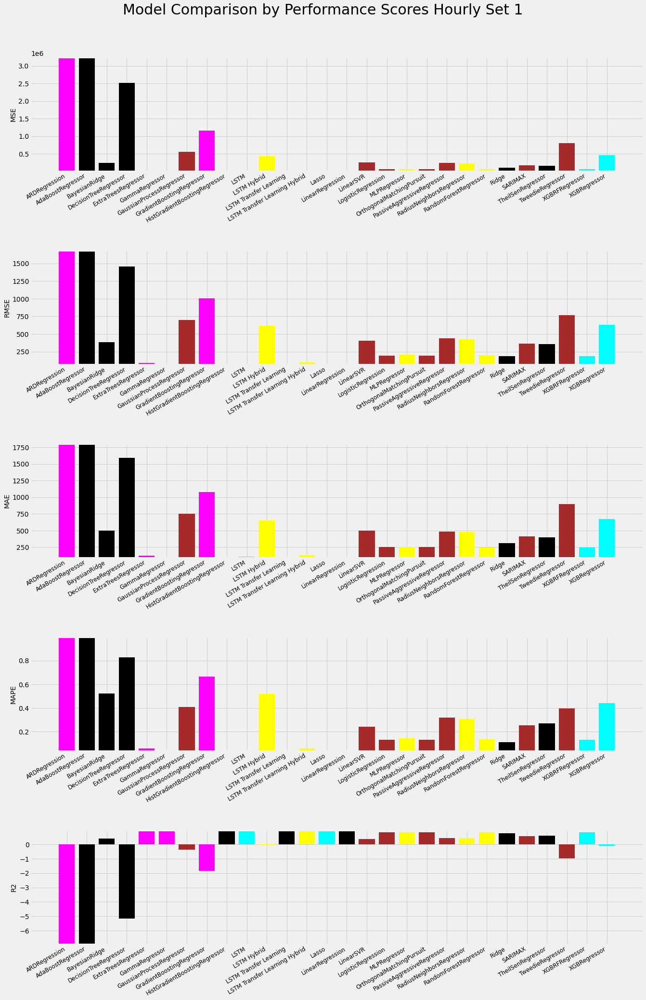

In [42]:
# Read the CSV file
df = pd.read_csv('hourly-Train-test-set_1.csv')

# Get the names of the models
model_names = df.columns[1:]

# Set the x-axis labels
x_labels = sorted(model_names)

# Get the mean scores for each model and performance metric
mse_scores = df.select_dtypes(include=[float]).iloc[0].loc[model_names].tolist()
rmse_scores = df.select_dtypes(include=[float]).iloc[1].loc[model_names].tolist()
mae_scores = df.select_dtypes(include=[float]).iloc[2].loc[model_names].tolist()
mape_scores = df.select_dtypes(include=[float]).iloc[3].loc[model_names].tolist()
r2_scores = df.select_dtypes(include=[float]).iloc[4].loc[model_names].tolist()

# Fill in missing values with NaN
max_len = max(len(mse_scores), len(rmse_scores), len(mae_scores), len(mape_scores), len(r2_scores))
mse_scores += [np.nan] * (max_len - len(mse_scores))
rmse_scores += [np.nan] * (max_len - len(rmse_scores))
mae_scores += [np.nan] * (max_len - len(mae_scores))
mape_scores += [np.nan] * (max_len - len(mape_scores))
r2_scores += [np.nan] * (max_len - len(r2_scores))

# Set the y-axis labels and scores
y_labels = ['MSE', 'RMSE', 'MAE', 'MAPE', 'R2']
y_scores = [mse_scores, rmse_scores, mae_scores, mape_scores, r2_scores]

# Define available colors
colors = ['black', 'brown', 'yellow', 'cyan', 'magenta']

# Generate random color for each bar
bar_colors = [random.choice(colors) for a in range(len(x_labels))]

# Create a bar plot for each score
fig, axs = plt.subplots(nrows=5, figsize=(20, 30))

for i, (label, score) in enumerate(zip(y_labels, y_scores)):
    axs[i].bar(x_labels, score, color=bar_colors)
    axs[i].set_xticklabels((x_labels), rotation=30, ha='right', fontsize=12)
    axs[i].set_ylabel(label, fontsize=14)
    axs[i].set_ylim(min(score), max(score))  # Set the y-axis limits

plt.subplots_adjust(hspace=0.5)
plt.suptitle('Model Comparison by Performance Scores Hourly Set 1', fontsize=30)
plt.tight_layout(pad=4)
plt.show()


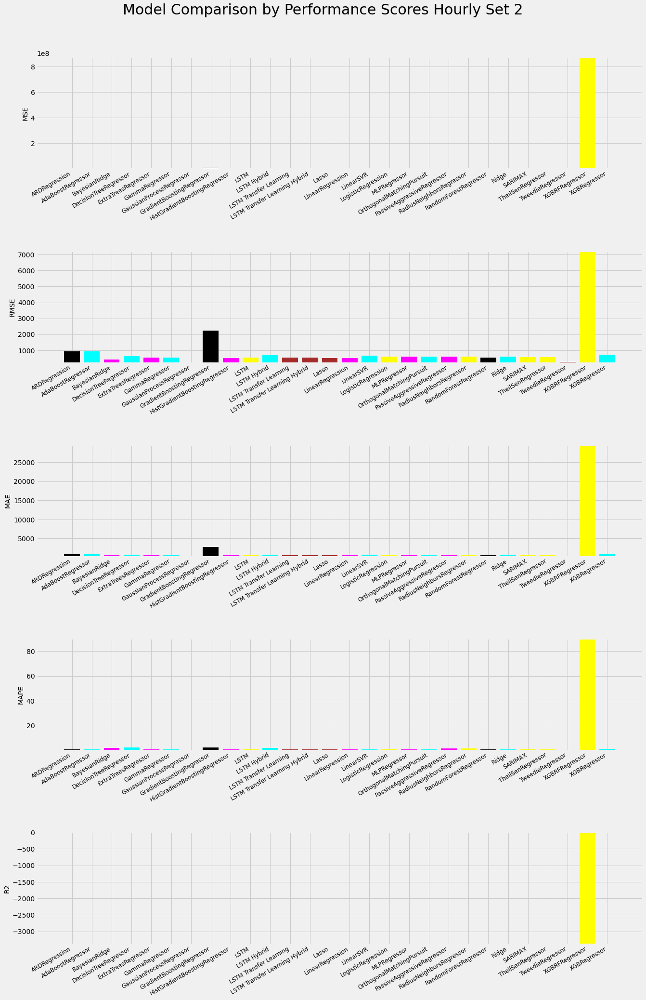

In [43]:
# Read the CSV file
df = pd.read_csv('hourly-Train-test-set_2.csv')

# Get the names of the models
model_names = df.columns[1:]

# Set the x-axis labels
x_labels = sorted(model_names)

# Get the mean scores for each model and performance metric
mse_scores = df.select_dtypes(include=[float]).iloc[0].loc[model_names].tolist()
rmse_scores = df.select_dtypes(include=[float]).iloc[1].loc[model_names].tolist()
mae_scores = df.select_dtypes(include=[float]).iloc[2].loc[model_names].tolist()
mape_scores = df.select_dtypes(include=[float]).iloc[3].loc[model_names].tolist()
r2_scores = df.select_dtypes(include=[float]).iloc[4].loc[model_names].tolist()

# Fill in missing values with NaN
max_len = max(len(mse_scores), len(rmse_scores), len(mae_scores), len(mape_scores), len(r2_scores))
mse_scores += [np.nan] * (max_len - len(mse_scores))
rmse_scores += [np.nan] * (max_len - len(rmse_scores))
mae_scores += [np.nan] * (max_len - len(mae_scores))
mape_scores += [np.nan] * (max_len - len(mape_scores))
r2_scores += [np.nan] * (max_len - len(r2_scores))

# Set the y-axis labels and scores
y_labels = ['MSE', 'RMSE', 'MAE', 'MAPE', 'R2']
y_scores = [mse_scores, rmse_scores, mae_scores, mape_scores, r2_scores]

# Define available colors
colors = ['black', 'brown', 'yellow', 'cyan', 'magenta']

# Generate random color for each bar
bar_colors = [random.choice(colors) for a in range(len(x_labels))]

# Create a bar plot for each score
fig, axs = plt.subplots(nrows=5, figsize=(20, 30))

for i, (label, score) in enumerate(zip(y_labels, y_scores)):
    axs[i].bar(x_labels, score, color=bar_colors)
    axs[i].set_xticklabels((x_labels), rotation=30, ha='right', fontsize=12)
    axs[i].set_ylabel(label, fontsize=14)
    axs[i].set_ylim(min(score), max(score))  # Set the y-axis limits

plt.subplots_adjust(hspace=0.5)
plt.suptitle('Model Comparison by Performance Scores Hourly Set 2', fontsize=30)
plt.tight_layout(pad=4)
plt.show()


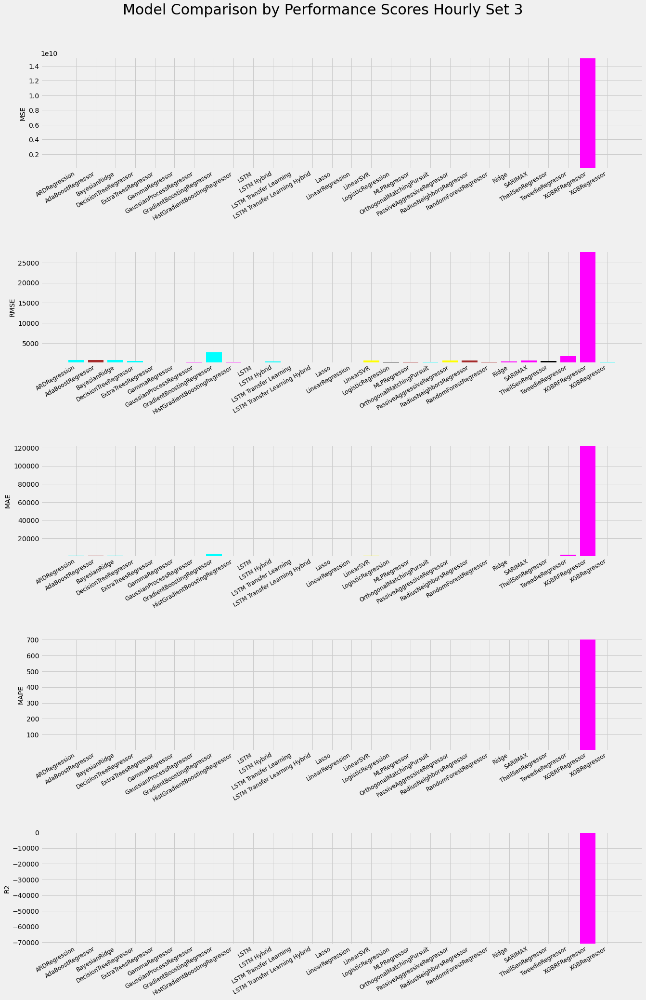

In [44]:
# Read the CSV file
df = pd.read_csv('hourly-Train-test-set_3.csv')

# Get the names of the models
model_names = df.columns[1:]

# Set the x-axis labels
x_labels = sorted(model_names)

# Get the mean scores for each model and performance metric
mse_scores = df.select_dtypes(include=[float]).iloc[0].loc[model_names].tolist()
rmse_scores = df.select_dtypes(include=[float]).iloc[1].loc[model_names].tolist()
mae_scores = df.select_dtypes(include=[float]).iloc[2].loc[model_names].tolist()
mape_scores = df.select_dtypes(include=[float]).iloc[3].loc[model_names].tolist()
r2_scores = df.select_dtypes(include=[float]).iloc[4].loc[model_names].tolist()

# Fill in missing values with NaN
max_len = max(len(mse_scores), len(rmse_scores), len(mae_scores), len(mape_scores), len(r2_scores))
mse_scores += [np.nan] * (max_len - len(mse_scores))
rmse_scores += [np.nan] * (max_len - len(rmse_scores))
mae_scores += [np.nan] * (max_len - len(mae_scores))
mape_scores += [np.nan] * (max_len - len(mape_scores))
r2_scores += [np.nan] * (max_len - len(r2_scores))

# Set the y-axis labels and scores
y_labels = ['MSE', 'RMSE', 'MAE', 'MAPE', 'R2']
y_scores = [mse_scores, rmse_scores, mae_scores, mape_scores, r2_scores]

# Define available colors
colors = ['black', 'brown', 'yellow', 'cyan', 'magenta']

# Generate random color for each bar
bar_colors = [random.choice(colors) for a in range(len(x_labels))]

# Create a bar plot for each score
fig, axs = plt.subplots(nrows=5, figsize=(20, 30))

for i, (label, score) in enumerate(zip(y_labels, y_scores)):
    axs[i].bar(x_labels, score, color=bar_colors)
    axs[i].set_xticklabels((x_labels), rotation=30, ha='right', fontsize=12)
    axs[i].set_ylabel(label, fontsize=14)
    axs[i].set_ylim(min(score), max(score))  # Set the y-axis limits

plt.subplots_adjust(hspace=0.5)
plt.suptitle('Model Comparison by Performance Scores Hourly Set 3', fontsize=30)
plt.tight_layout(pad=4)
plt.show()


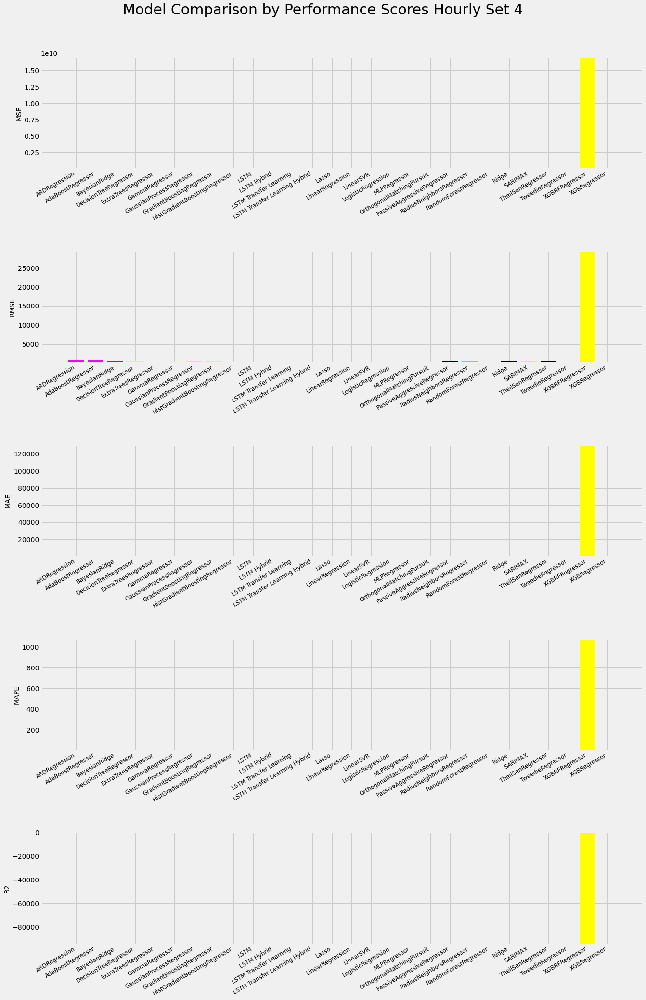

In [45]:
# Read the CSV file
df = pd.read_csv('hourly-Train-test-set_4.csv')

# Get the names of the models
model_names = df.columns[1:]

# Set the x-axis labels
x_labels = sorted(model_names)

# Get the mean scores for each model and performance metric
mse_scores = df.select_dtypes(include=[float]).iloc[0].loc[model_names].tolist()
rmse_scores = df.select_dtypes(include=[float]).iloc[1].loc[model_names].tolist()
mae_scores = df.select_dtypes(include=[float]).iloc[2].loc[model_names].tolist()
mape_scores = df.select_dtypes(include=[float]).iloc[3].loc[model_names].tolist()
r2_scores = df.select_dtypes(include=[float]).iloc[4].loc[model_names].tolist()

# Fill in missing values with NaN
max_len = max(len(mse_scores), len(rmse_scores), len(mae_scores), len(mape_scores), len(r2_scores))
mse_scores += [np.nan] * (max_len - len(mse_scores))
rmse_scores += [np.nan] * (max_len - len(rmse_scores))
mae_scores += [np.nan] * (max_len - len(mae_scores))
mape_scores += [np.nan] * (max_len - len(mape_scores))
r2_scores += [np.nan] * (max_len - len(r2_scores))

# Set the y-axis labels and scores
y_labels = ['MSE', 'RMSE', 'MAE', 'MAPE', 'R2']
y_scores = [mse_scores, rmse_scores, mae_scores, mape_scores, r2_scores]

# Define available colors
colors = ['black', 'brown', 'yellow', 'cyan', 'magenta']

# Generate random color for each bar
bar_colors = [random.choice(colors) for a in range(len(x_labels))]

# Create a bar plot for each score
fig, axs = plt.subplots(nrows=5, figsize=(20, 30))

for i, (label, score) in enumerate(zip(y_labels, y_scores)):
    axs[i].bar(x_labels, score, color=bar_colors)
    axs[i].set_xticklabels((x_labels), rotation=30, ha='right', fontsize=12)
    axs[i].set_ylabel(label, fontsize=14)
    axs[i].set_ylim(min(score), max(score))  # Set the y-axis limits

plt.subplots_adjust(hspace=0.5)
plt.suptitle('Model Comparison by Performance Scores Hourly Set 4', fontsize=30)
plt.tight_layout(pad=4)
plt.show()


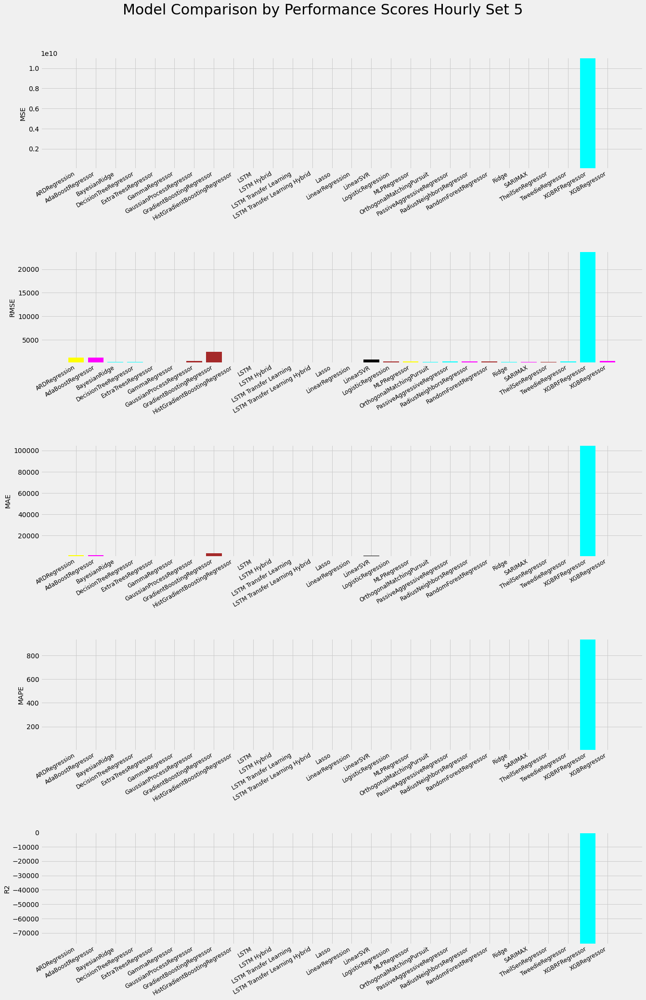

In [46]:
# Read the CSV file
df = pd.read_csv('hourly-Train-test-set_5.csv')

# Get the names of the models
model_names = df.columns[1:]

# Set the x-axis labels
x_labels = sorted(model_names)

# Get the mean scores for each model and performance metric
mse_scores = df.select_dtypes(include=[float]).iloc[0].loc[model_names].tolist()
rmse_scores = df.select_dtypes(include=[float]).iloc[1].loc[model_names].tolist()
mae_scores = df.select_dtypes(include=[float]).iloc[2].loc[model_names].tolist()
mape_scores = df.select_dtypes(include=[float]).iloc[3].loc[model_names].tolist()
r2_scores = df.select_dtypes(include=[float]).iloc[4].loc[model_names].tolist()

# Fill in missing values with NaN
max_len = max(len(mse_scores), len(rmse_scores), len(mae_scores), len(mape_scores), len(r2_scores))
mse_scores += [np.nan] * (max_len - len(mse_scores))
rmse_scores += [np.nan] * (max_len - len(rmse_scores))
mae_scores += [np.nan] * (max_len - len(mae_scores))
mape_scores += [np.nan] * (max_len - len(mape_scores))
r2_scores += [np.nan] * (max_len - len(r2_scores))

# Set the y-axis labels and scores
y_labels = ['MSE', 'RMSE', 'MAE', 'MAPE', 'R2']
y_scores = [mse_scores, rmse_scores, mae_scores, mape_scores, r2_scores]

# Define available colors
colors = ['black', 'brown', 'yellow', 'cyan', 'magenta']

# Generate random color for each bar
bar_colors = [random.choice(colors) for a in range(len(x_labels))]

# Create a bar plot for each score
fig, axs = plt.subplots(nrows=5, figsize=(20, 30))

for i, (label, score) in enumerate(zip(y_labels, y_scores)):
    axs[i].bar(x_labels, score, color=bar_colors)
    axs[i].set_xticklabels((x_labels), rotation=30, ha='right', fontsize=12)
    axs[i].set_ylabel(label, fontsize=14)
    axs[i].set_ylim(min(score), max(score))  # Set the y-axis limits

plt.subplots_adjust(hspace=0.5)
plt.suptitle('Model Comparison by Performance Scores Hourly Set 5', fontsize=30)
plt.tight_layout(pad=4)
plt.show()


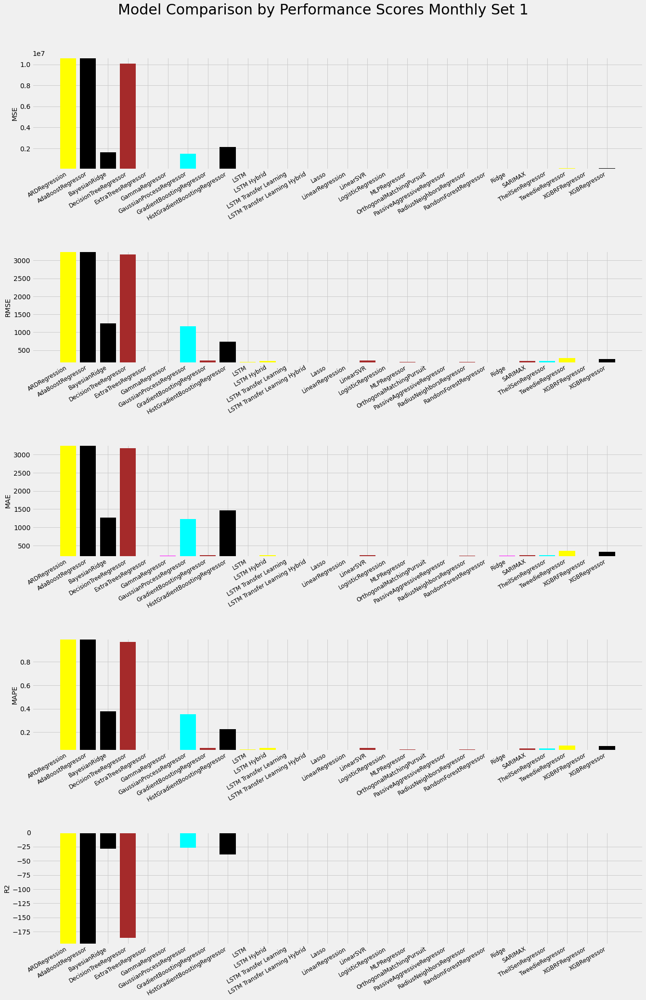

In [47]:
# Read the CSV file
df = pd.read_csv('monthly-Train-test-set_1.csv')

# Get the names of the models
model_names = df.columns[1:]

# Set the x-axis labels
x_labels = sorted(model_names)

# Get the mean scores for each model and performance metric
mse_scores = df.select_dtypes(include=[float]).iloc[0].loc[model_names].tolist()
rmse_scores = df.select_dtypes(include=[float]).iloc[1].loc[model_names].tolist()
mae_scores = df.select_dtypes(include=[float]).iloc[2].loc[model_names].tolist()
mape_scores = df.select_dtypes(include=[float]).iloc[3].loc[model_names].tolist()
r2_scores = df.select_dtypes(include=[float]).iloc[4].loc[model_names].tolist()

# Fill in missing values with NaN
max_len = max(len(mse_scores), len(rmse_scores), len(mae_scores), len(mape_scores), len(r2_scores))
mse_scores += [np.nan] * (max_len - len(mse_scores))
rmse_scores += [np.nan] * (max_len - len(rmse_scores))
mae_scores += [np.nan] * (max_len - len(mae_scores))
mape_scores += [np.nan] * (max_len - len(mape_scores))
r2_scores += [np.nan] * (max_len - len(r2_scores))

# Set the y-axis labels and scores
y_labels = ['MSE', 'RMSE', 'MAE', 'MAPE', 'R2']
y_scores = [mse_scores, rmse_scores, mae_scores, mape_scores, r2_scores]

# Define available colors
colors = ['black', 'brown', 'yellow', 'cyan', 'magenta']

# Generate random color for each bar
bar_colors = [random.choice(colors) for a in range(len(x_labels))]

# Create a bar plot for each score
fig, axs = plt.subplots(nrows=5, figsize=(20, 30))

for i, (label, score) in enumerate(zip(y_labels, y_scores)):
    axs[i].bar(x_labels, score, color=bar_colors)
    axs[i].set_xticklabels((x_labels), rotation=30, ha='right', fontsize=12)
    axs[i].set_ylabel(label, fontsize=14)
    axs[i].set_ylim(min(score), max(score))  # Set the y-axis limits

plt.subplots_adjust(hspace=0.5)
plt.suptitle('Model Comparison by Performance Scores Monthly Set 1', fontsize=30)
plt.tight_layout(pad=4)
plt.show()


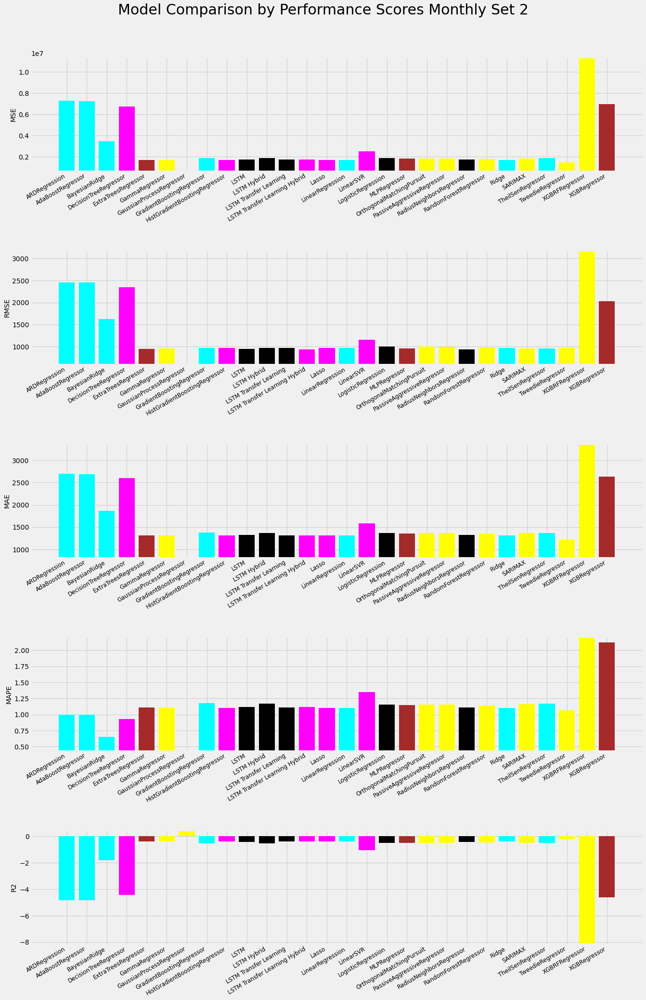

In [48]:
# Read the CSV file
df = pd.read_csv('monthly-Train-test-set_2.csv')

# Get the names of the models
model_names = df.columns[1:]

# Set the x-axis labels
x_labels = sorted(model_names)

# Get the mean scores for each model and performance metric
mse_scores = df.select_dtypes(include=[float]).iloc[0].loc[model_names].tolist()
rmse_scores = df.select_dtypes(include=[float]).iloc[1].loc[model_names].tolist()
mae_scores = df.select_dtypes(include=[float]).iloc[2].loc[model_names].tolist()
mape_scores = df.select_dtypes(include=[float]).iloc[3].loc[model_names].tolist()
r2_scores = df.select_dtypes(include=[float]).iloc[4].loc[model_names].tolist()

# Fill in missing values with NaN
max_len = max(len(mse_scores), len(rmse_scores), len(mae_scores), len(mape_scores), len(r2_scores))
mse_scores += [np.nan] * (max_len - len(mse_scores))
rmse_scores += [np.nan] * (max_len - len(rmse_scores))
mae_scores += [np.nan] * (max_len - len(mae_scores))
mape_scores += [np.nan] * (max_len - len(mape_scores))
r2_scores += [np.nan] * (max_len - len(r2_scores))

# Set the y-axis labels and scores
y_labels = ['MSE', 'RMSE', 'MAE', 'MAPE', 'R2']
y_scores = [mse_scores, rmse_scores, mae_scores, mape_scores, r2_scores]

# Define available colors
colors = ['black', 'brown', 'yellow', 'cyan', 'magenta']

# Generate random color for each bar
bar_colors = [random.choice(colors) for a in range(len(x_labels))]

# Create a bar plot for each score
fig, axs = plt.subplots(nrows=5, figsize=(20, 30))

for i, (label, score) in enumerate(zip(y_labels, y_scores)):
    axs[i].bar(x_labels, score, color=bar_colors)
    axs[i].set_xticklabels((x_labels), rotation=30, ha='right', fontsize=12)
    axs[i].set_ylabel(label, fontsize=14)
    axs[i].set_ylim(min(score), max(score))  # Set the y-axis limits

plt.subplots_adjust(hspace=0.5)
plt.suptitle('Model Comparison by Performance Scores Monthly Set 2', fontsize=30)
plt.tight_layout(pad=4)
plt.show()


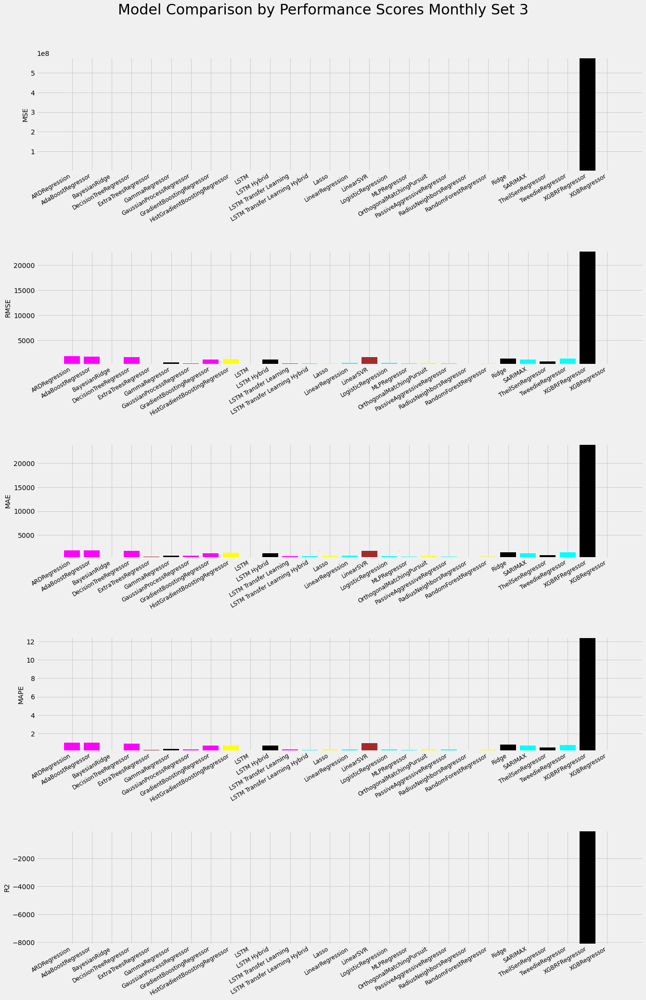

In [49]:
# Read the CSV file
df = pd.read_csv('monthly-Train-test-set_3.csv')

# Get the names of the models
model_names = df.columns[1:]

# Set the x-axis labels
x_labels = sorted(model_names)

# Get the mean scores for each model and performance metric
mse_scores = df.select_dtypes(include=[float]).iloc[0].loc[model_names].tolist()
rmse_scores = df.select_dtypes(include=[float]).iloc[1].loc[model_names].tolist()
mae_scores = df.select_dtypes(include=[float]).iloc[2].loc[model_names].tolist()
mape_scores = df.select_dtypes(include=[float]).iloc[3].loc[model_names].tolist()
r2_scores = df.select_dtypes(include=[float]).iloc[4].loc[model_names].tolist()

# Fill in missing values with NaN
max_len = max(len(mse_scores), len(rmse_scores), len(mae_scores), len(mape_scores), len(r2_scores))
mse_scores += [np.nan] * (max_len - len(mse_scores))
rmse_scores += [np.nan] * (max_len - len(rmse_scores))
mae_scores += [np.nan] * (max_len - len(mae_scores))
mape_scores += [np.nan] * (max_len - len(mape_scores))
r2_scores += [np.nan] * (max_len - len(r2_scores))

# Set the y-axis labels and scores
y_labels = ['MSE', 'RMSE', 'MAE', 'MAPE', 'R2']
y_scores = [mse_scores, rmse_scores, mae_scores, mape_scores, r2_scores]

# Define available colors
colors = ['black', 'brown', 'yellow', 'cyan', 'magenta']

# Generate random color for each bar
bar_colors = [random.choice(colors) for a in range(len(x_labels))]

# Create a bar plot for each score
fig, axs = plt.subplots(nrows=5, figsize=(20, 30))

for i, (label, score) in enumerate(zip(y_labels, y_scores)):
    axs[i].bar(x_labels, score, color=bar_colors)
    axs[i].set_xticklabels((x_labels), rotation=30, ha='right', fontsize=12)
    axs[i].set_ylabel(label, fontsize=14)
    axs[i].set_ylim(min(score), max(score))  # Set the y-axis limits

plt.subplots_adjust(hspace=0.5)
plt.suptitle('Model Comparison by Performance Scores Monthly Set 3', fontsize=30)
plt.tight_layout(pad=4)
plt.show()


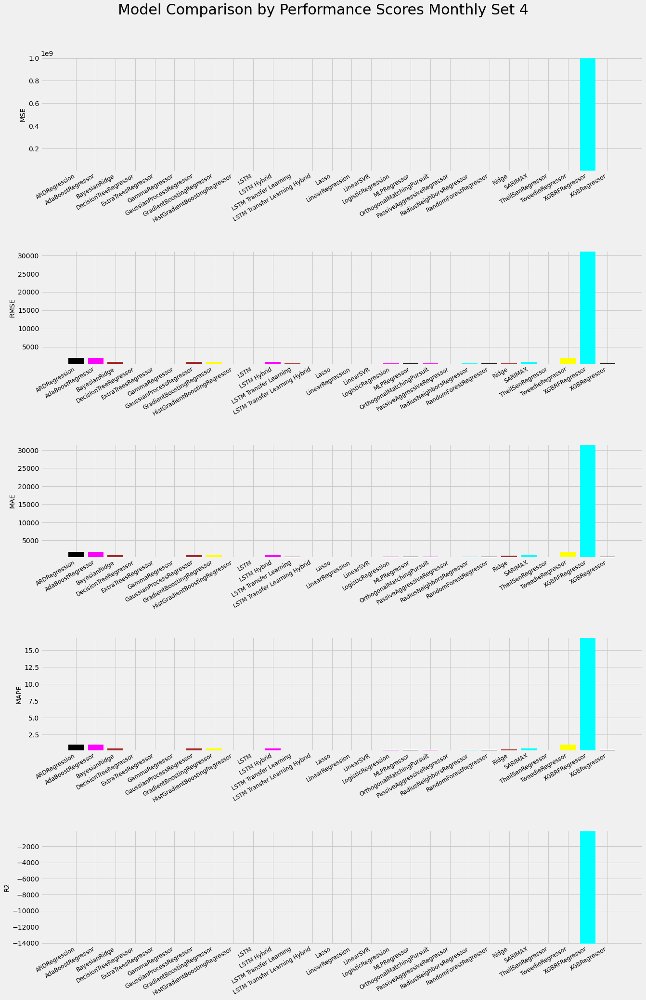

In [50]:
# Read the CSV file
df = pd.read_csv('monthly-Train-test-set_4.csv')

# Get the names of the models
model_names = df.columns[1:]

# Set the x-axis labels
x_labels = sorted(model_names)

# Get the mean scores for each model and performance metric
mse_scores = df.select_dtypes(include=[float]).iloc[0].loc[model_names].tolist()
rmse_scores = df.select_dtypes(include=[float]).iloc[1].loc[model_names].tolist()
mae_scores = df.select_dtypes(include=[float]).iloc[2].loc[model_names].tolist()
mape_scores = df.select_dtypes(include=[float]).iloc[3].loc[model_names].tolist()
r2_scores = df.select_dtypes(include=[float]).iloc[4].loc[model_names].tolist()

# Fill in missing values with NaN
max_len = max(len(mse_scores), len(rmse_scores), len(mae_scores), len(mape_scores), len(r2_scores))
mse_scores += [np.nan] * (max_len - len(mse_scores))
rmse_scores += [np.nan] * (max_len - len(rmse_scores))
mae_scores += [np.nan] * (max_len - len(mae_scores))
mape_scores += [np.nan] * (max_len - len(mape_scores))
r2_scores += [np.nan] * (max_len - len(r2_scores))

# Set the y-axis labels and scores
y_labels = ['MSE', 'RMSE', 'MAE', 'MAPE', 'R2']
y_scores = [mse_scores, rmse_scores, mae_scores, mape_scores, r2_scores]

# Define available colors
colors = ['black', 'brown', 'yellow', 'cyan', 'magenta']

# Generate random color for each bar
bar_colors = [random.choice(colors) for a in range(len(x_labels))]

# Create a bar plot for each score
fig, axs = plt.subplots(nrows=5, figsize=(20, 30))

for i, (label, score) in enumerate(zip(y_labels, y_scores)):
    axs[i].bar(x_labels, score, color=bar_colors)
    axs[i].set_xticklabels((x_labels), rotation=30, ha='right', fontsize=12)
    axs[i].set_ylabel(label, fontsize=14)
    axs[i].set_ylim(min(score), max(score))  # Set the y-axis limits

plt.subplots_adjust(hspace=0.5)
plt.suptitle('Model Comparison by Performance Scores Monthly Set 4', fontsize=30)
plt.tight_layout(pad=4)
plt.show()


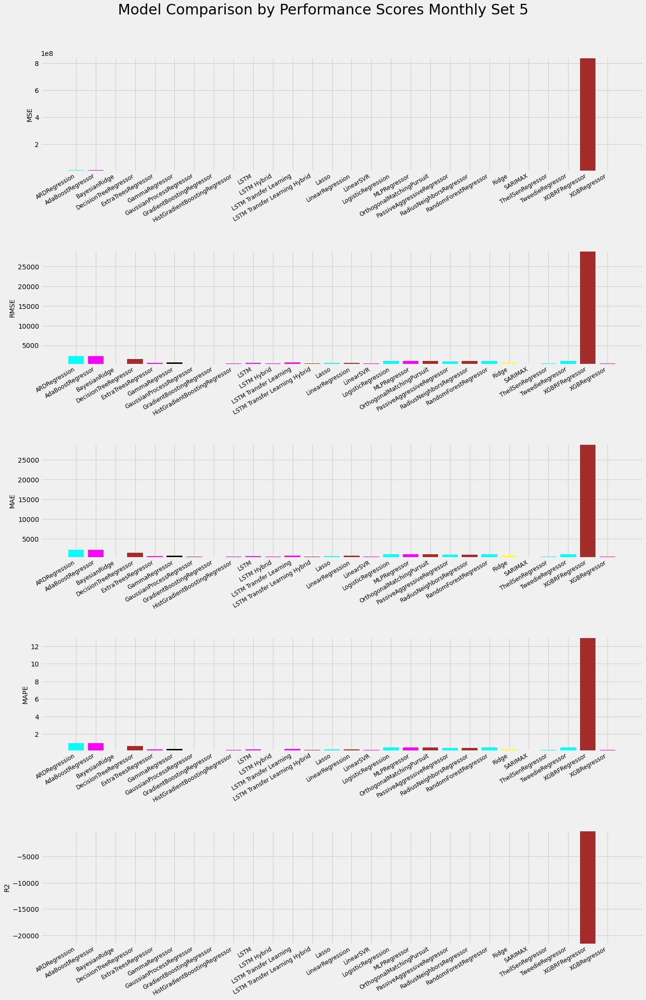

In [41]:
# Read the CSV file
df = pd.read_csv('monthly-Train-test-set_5.csv')

# Get the names of the models
model_names = df.columns[1:]

# Set the x-axis labels
x_labels = sorted(model_names)

# Get the mean scores for each model and performance metric
mse_scores = df.select_dtypes(include=[float]).iloc[0].loc[model_names].tolist()
rmse_scores = df.select_dtypes(include=[float]).iloc[1].loc[model_names].tolist()
mae_scores = df.select_dtypes(include=[float]).iloc[2].loc[model_names].tolist()
mape_scores = df.select_dtypes(include=[float]).iloc[3].loc[model_names].tolist()
r2_scores = df.select_dtypes(include=[float]).iloc[4].loc[model_names].tolist()

# Fill in missing values with NaN
max_len = max(len(mse_scores), len(rmse_scores), len(mae_scores), len(mape_scores), len(r2_scores))
mse_scores += [np.nan] * (max_len - len(mse_scores))
rmse_scores += [np.nan] * (max_len - len(rmse_scores))
mae_scores += [np.nan] * (max_len - len(mae_scores))
mape_scores += [np.nan] * (max_len - len(mape_scores))
r2_scores += [np.nan] * (max_len - len(r2_scores))

# Set the y-axis labels and scores
y_labels = ['MSE', 'RMSE', 'MAE', 'MAPE', 'R2']
y_scores = [mse_scores, rmse_scores, mae_scores, mape_scores, r2_scores]

# Define available colors
colors = ['black', 'brown', 'yellow', 'cyan', 'magenta']

# Generate random color for each bar
bar_colors = [random.choice(colors) for a in range(len(x_labels))]

# Create a bar plot for each score
fig, axs = plt.subplots(nrows=5, figsize=(20, 30))

for i, (label, score) in enumerate(zip(y_labels, y_scores)):
    axs[i].bar(x_labels, score, color=bar_colors)
    axs[i].set_xticklabels((x_labels), rotation=30, ha='right', fontsize=12)
    axs[i].set_ylabel(label, fontsize=14)
    axs[i].set_ylim(min(score), max(score))  # Set the y-axis limits

plt.subplots_adjust(hspace=0.5)
plt.suptitle('Model Comparison by Performance Scores Monthly Set 5', fontsize=30)
plt.tight_layout(pad=4)
plt.show()


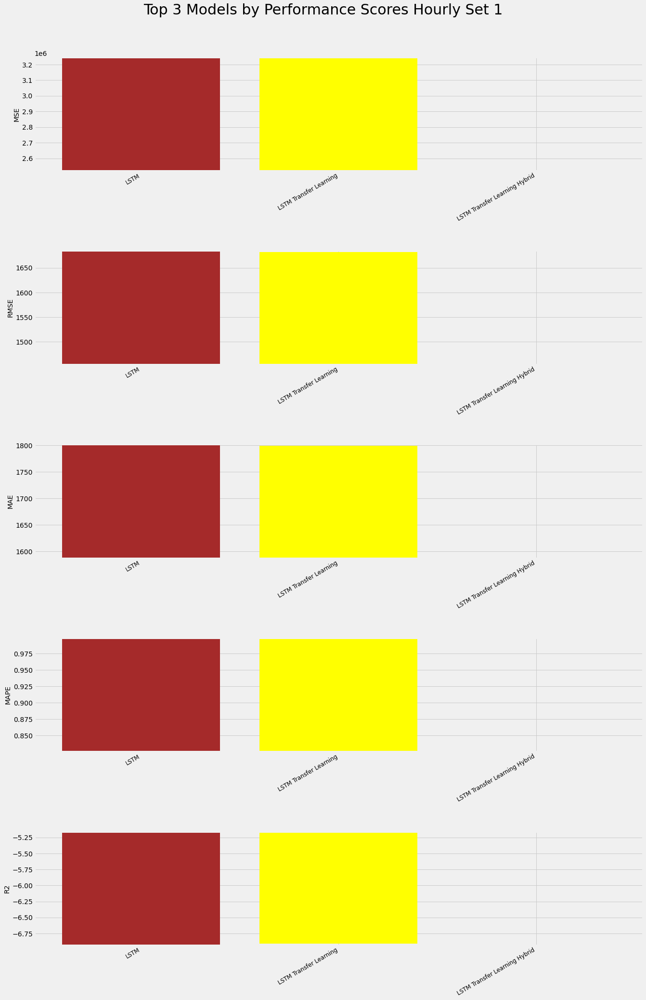

In [61]:
# Read the CSV file
df = pd.read_csv('hourly-Train-test-set_1.csv')

# Get the names of the models
model_names = df.columns[1:]

# Get the maximum scores for each model across all performance metrics
max_scores = df.select_dtypes(include=[float]).loc[:, model_names].max()

# Sort the models by their maximum score in descending order and select the top 3 models
top_models = max_scores.sort_values(ascending=False).head(3).index.tolist()

# Set the x-axis labels to the top 3 models
x_labels = top_models

# Get the scores for the top 3 models for each performance metric
mse_scores = df.loc[0, x_labels].tolist()
rmse_scores = df.loc[1, x_labels].tolist()
mae_scores = df.loc[2, x_labels].tolist()
mape_scores = df.loc[3, x_labels].tolist()
r2_scores = df.loc[4, x_labels].tolist()

# Set the y-axis labels and scores
y_labels = ['MSE', 'RMSE', 'MAE', 'MAPE', 'R2']
y_scores = [mse_scores, rmse_scores, mae_scores, mape_scores, r2_scores]

# Define available colors
colors = ['black', 'brown', 'yellow', 'cyan', 'magenta']

# Generate random color for each bar
bar_colors = [random.choice(colors) for a in range(len(x_labels))]

# Create a bar plot for each score
fig, axs = plt.subplots(nrows=5, figsize=(20, 30))

for i, (label, score) in enumerate(zip(y_labels, y_scores)):
    axs[i].bar(x_labels, score, color=bar_colors)
    axs[i].set_xticklabels((x_labels), rotation=30, ha='right', fontsize=12)
    axs[i].set_ylabel(label, fontsize=14)
    axs[i].set_ylim(min(score), max(score))  # Set the y-axis limits

plt.subplots_adjust(hspace=0.5)
plt.suptitle('Top 3 Models by Performance Scores Hourly Set 1', fontsize=30)
plt.tight_layout(pad=4)
plt.show()


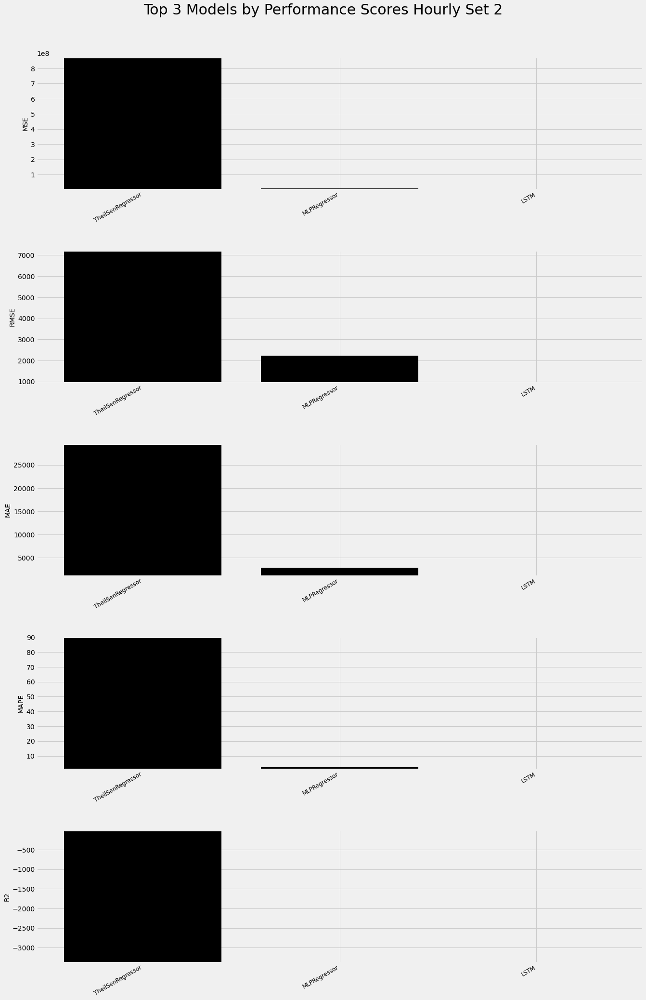

In [63]:
# Read the CSV file
df = pd.read_csv('hourly-Train-test-set_2.csv')

# Get the names of the models
model_names = df.columns[1:]

# Get the maximum scores for each model across all performance metrics
max_scores = df.select_dtypes(include=[float]).loc[:, model_names].max()

# Sort the models by their maximum score in descending order and select the top 3 models
top_models = max_scores.sort_values(ascending=False).head(3).index.tolist()

# Set the x-axis labels to the top 3 models
x_labels = top_models

# Get the scores for the top 3 models for each performance metric
mse_scores = df.loc[0, x_labels].tolist()
rmse_scores = df.loc[1, x_labels].tolist()
mae_scores = df.loc[2, x_labels].tolist()
mape_scores = df.loc[3, x_labels].tolist()
r2_scores = df.loc[4, x_labels].tolist()

# Set the y-axis labels and scores
y_labels = ['MSE', 'RMSE', 'MAE', 'MAPE', 'R2']
y_scores = [mse_scores, rmse_scores, mae_scores, mape_scores, r2_scores]

# Define available colors
colors = ['black', 'brown', 'yellow', 'cyan', 'magenta']

# Generate random color for each bar
bar_colors = [random.choice(colors) for a in range(len(x_labels))]

# Create a bar plot for each score
fig, axs = plt.subplots(nrows=5, figsize=(20, 30))

for i, (label, score) in enumerate(zip(y_labels, y_scores)):
    axs[i].bar(x_labels, score, color=bar_colors)
    axs[i].set_xticklabels((x_labels), rotation=30, ha='right', fontsize=12)
    axs[i].set_ylabel(label, fontsize=14)
    axs[i].set_ylim(min(score), max(score))  # Set the y-axis limits

plt.subplots_adjust(hspace=0.5)
plt.suptitle('Top 3 Models by Performance Scores Hourly Set 2', fontsize=30)
plt.tight_layout(pad=4)
plt.show()


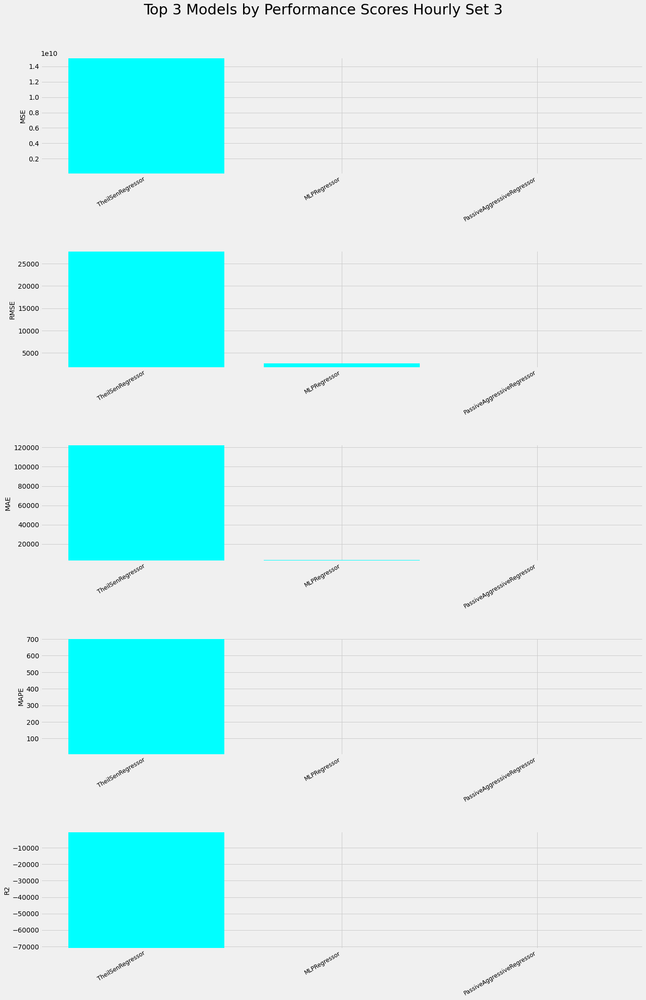

In [64]:
# Read the CSV file
df = pd.read_csv('hourly-Train-test-set_3.csv')

# Get the names of the models
model_names = df.columns[1:]

# Get the maximum scores for each model across all performance metrics
max_scores = df.select_dtypes(include=[float]).loc[:, model_names].max()

# Sort the models by their maximum score in descending order and select the top 3 models
top_models = max_scores.sort_values(ascending=False).head(3).index.tolist()

# Set the x-axis labels to the top 3 models
x_labels = top_models

# Get the scores for the top 3 models for each performance metric
mse_scores = df.loc[0, x_labels].tolist()
rmse_scores = df.loc[1, x_labels].tolist()
mae_scores = df.loc[2, x_labels].tolist()
mape_scores = df.loc[3, x_labels].tolist()
r2_scores = df.loc[4, x_labels].tolist()

# Set the y-axis labels and scores
y_labels = ['MSE', 'RMSE', 'MAE', 'MAPE', 'R2']
y_scores = [mse_scores, rmse_scores, mae_scores, mape_scores, r2_scores]

# Define available colors
colors = ['black', 'brown', 'yellow', 'cyan', 'magenta']

# Generate random color for each bar
bar_colors = [random.choice(colors) for a in range(len(x_labels))]

# Create a bar plot for each score
fig, axs = plt.subplots(nrows=5, figsize=(20, 30))

for i, (label, score) in enumerate(zip(y_labels, y_scores)):
    axs[i].bar(x_labels, score, color=bar_colors)
    axs[i].set_xticklabels((x_labels), rotation=30, ha='right', fontsize=12)
    axs[i].set_ylabel(label, fontsize=14)
    axs[i].set_ylim(min(score), max(score))  # Set the y-axis limits

plt.subplots_adjust(hspace=0.5)
plt.suptitle('Top 3 Models by Performance Scores Hourly Set 3', fontsize=30)
plt.tight_layout(pad=4)
plt.show()


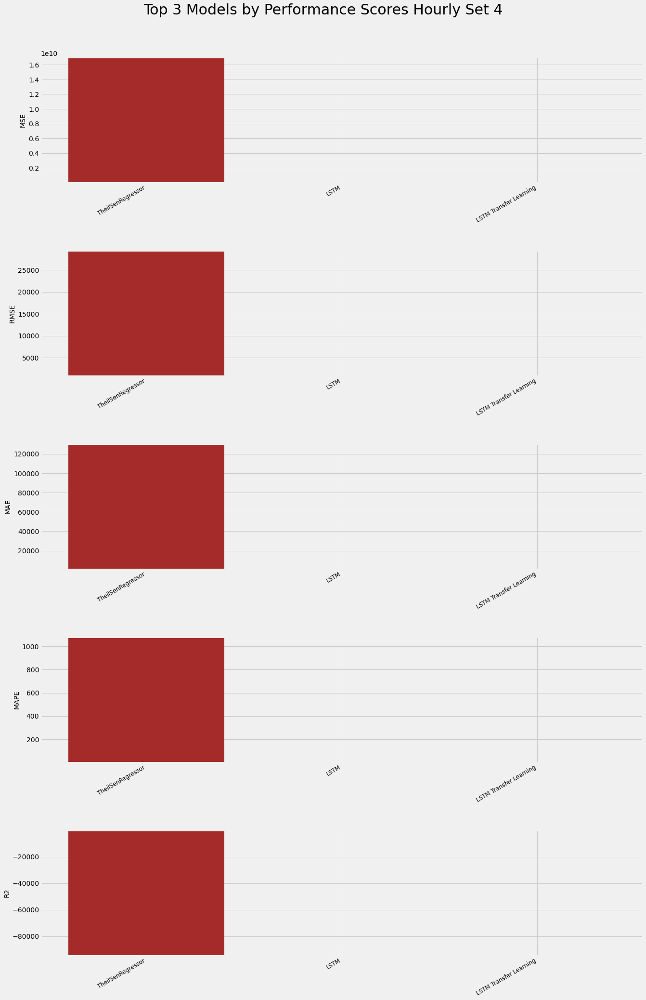

In [65]:
# Read the CSV file
df = pd.read_csv('hourly-Train-test-set_4.csv')

# Get the names of the models
model_names = df.columns[1:]

# Get the maximum scores for each model across all performance metrics
max_scores = df.select_dtypes(include=[float]).loc[:, model_names].max()

# Sort the models by their maximum score in descending order and select the top 3 models
top_models = max_scores.sort_values(ascending=False).head(3).index.tolist()

# Set the x-axis labels to the top 3 models
x_labels = top_models

# Get the scores for the top 3 models for each performance metric
mse_scores = df.loc[0, x_labels].tolist()
rmse_scores = df.loc[1, x_labels].tolist()
mae_scores = df.loc[2, x_labels].tolist()
mape_scores = df.loc[3, x_labels].tolist()
r2_scores = df.loc[4, x_labels].tolist()

# Set the y-axis labels and scores
y_labels = ['MSE', 'RMSE', 'MAE', 'MAPE', 'R2']
y_scores = [mse_scores, rmse_scores, mae_scores, mape_scores, r2_scores]

# Define available colors
colors = ['black', 'brown', 'yellow', 'cyan', 'magenta']

# Generate random color for each bar
bar_colors = [random.choice(colors) for a in range(len(x_labels))]

# Create a bar plot for each score
fig, axs = plt.subplots(nrows=5, figsize=(20, 30))

for i, (label, score) in enumerate(zip(y_labels, y_scores)):
    axs[i].bar(x_labels, score, color=bar_colors)
    axs[i].set_xticklabels((x_labels), rotation=30, ha='right', fontsize=12)
    axs[i].set_ylabel(label, fontsize=14)
    axs[i].set_ylim(min(score), max(score))  # Set the y-axis limits

plt.subplots_adjust(hspace=0.5)
plt.suptitle('Top 3 Models by Performance Scores Hourly Set 4', fontsize=30)
plt.tight_layout(pad=4)
plt.show()


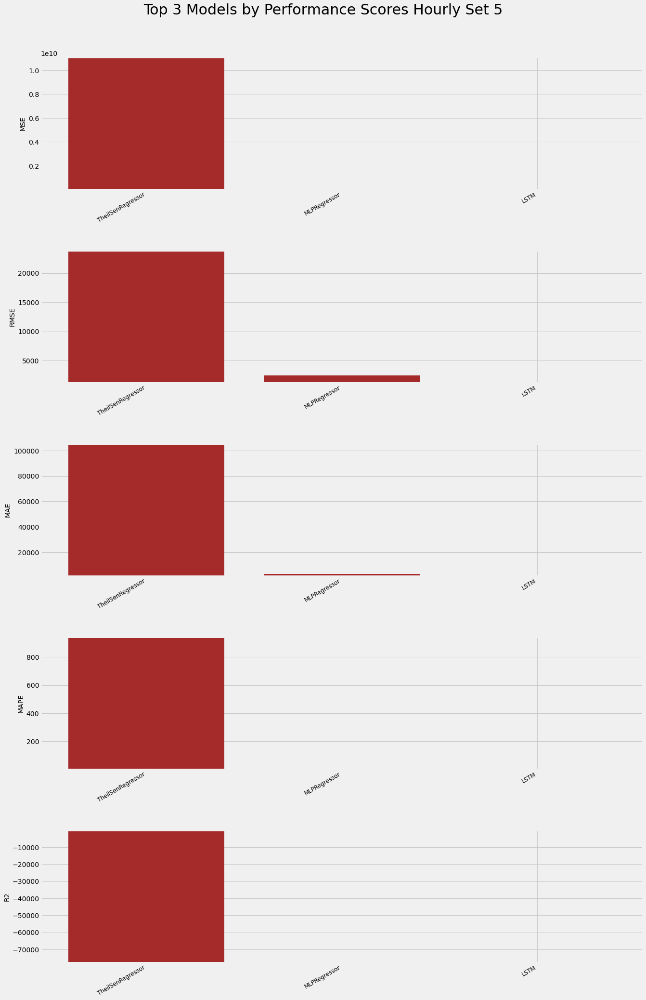

In [66]:
# Read the CSV file
df = pd.read_csv('hourly-Train-test-set_5.csv')

# Get the names of the models
model_names = df.columns[1:]

# Get the maximum scores for each model across all performance metrics
max_scores = df.select_dtypes(include=[float]).loc[:, model_names].max()

# Sort the models by their maximum score in descending order and select the top 3 models
top_models = max_scores.sort_values(ascending=False).head(3).index.tolist()

# Set the x-axis labels to the top 3 models
x_labels = top_models

# Get the scores for the top 3 models for each performance metric
mse_scores = df.loc[0, x_labels].tolist()
rmse_scores = df.loc[1, x_labels].tolist()
mae_scores = df.loc[2, x_labels].tolist()
mape_scores = df.loc[3, x_labels].tolist()
r2_scores = df.loc[4, x_labels].tolist()

# Set the y-axis labels and scores
y_labels = ['MSE', 'RMSE', 'MAE', 'MAPE', 'R2']
y_scores = [mse_scores, rmse_scores, mae_scores, mape_scores, r2_scores]

# Define available colors
colors = ['black', 'brown', 'yellow', 'cyan', 'magenta']

# Generate random color for each bar
bar_colors = [random.choice(colors) for a in range(len(x_labels))]

# Create a bar plot for each score
fig, axs = plt.subplots(nrows=5, figsize=(20, 30))

for i, (label, score) in enumerate(zip(y_labels, y_scores)):
    axs[i].bar(x_labels, score, color=bar_colors)
    axs[i].set_xticklabels((x_labels), rotation=30, ha='right', fontsize=12)
    axs[i].set_ylabel(label, fontsize=14)
    axs[i].set_ylim(min(score), max(score))  # Set the y-axis limits

plt.subplots_adjust(hspace=0.5)
plt.suptitle('Top 3 Models by Performance Scores Hourly Set 5', fontsize=30)
plt.tight_layout(pad=4)
plt.show()


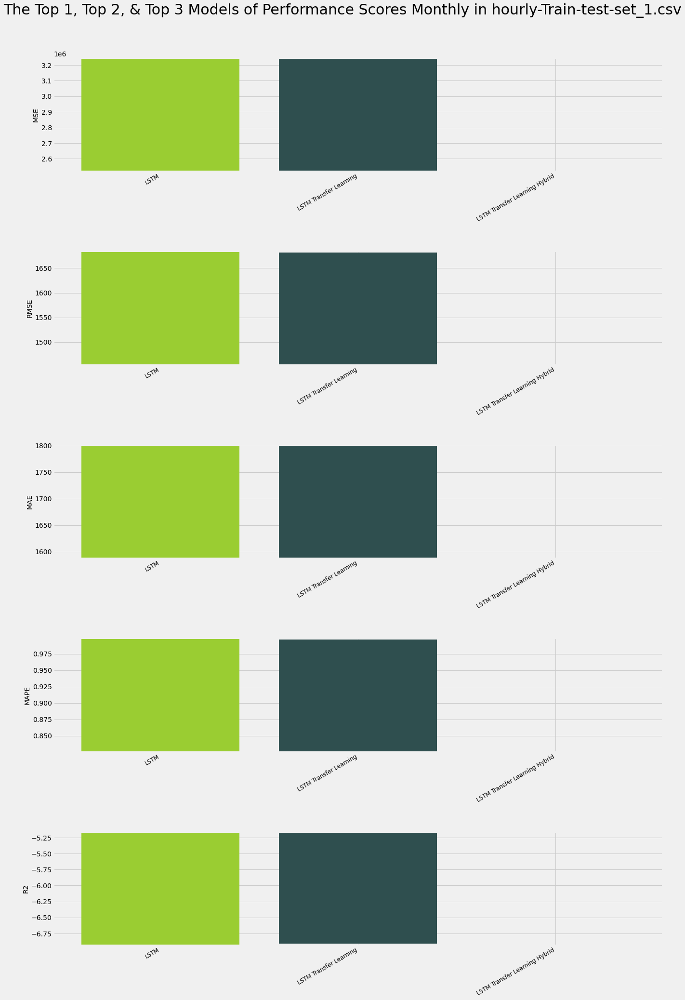

Top 3 models for each metric in hourly-Train-test-set_1.csv:
                                        MSE         RMSE          MAE  \
LSTM Transfer Learning Hybrid  2.520832e+06  1454.212181  1587.712861   
LSTM Transfer Learning         3.238564e+06  1682.141115  1799.601013   
LSTM                           3.246521e+06  1684.381378  1801.810536   

                                   MAPE        R2  
LSTM Transfer Learning Hybrid  0.825769 -5.158349  
LSTM Transfer Learning         0.997284 -6.911755  
LSTM                           0.998970 -6.931195  


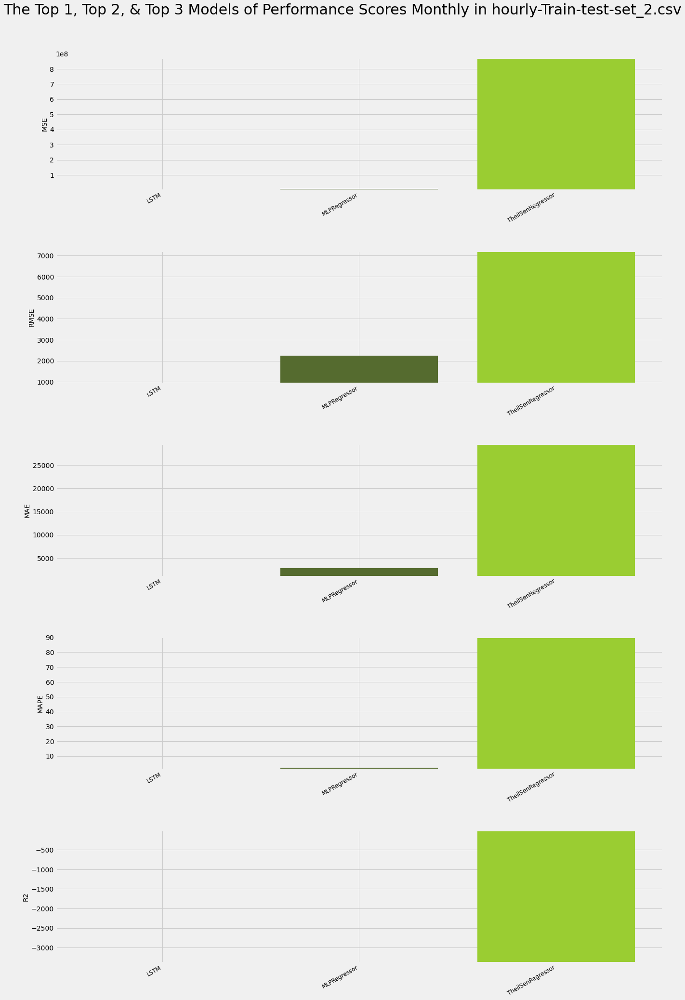

Top 3 models for each metric in hourly-Train-test-set_2.csv:
                            MSE         RMSE           MAE       MAPE  \
LSTM               1.142388e+06   940.692578   1068.825389   0.990843   
MLPRegressor       7.983318e+06  2238.105328   2825.476672   2.275425   
TheilSenRegressor  8.734045e+08  7218.975937  29553.417800  90.175053   

                            R2  
LSTM                 -3.426891  
MLPRegressor        -29.936326  
TheilSenRegressor -3383.548273  


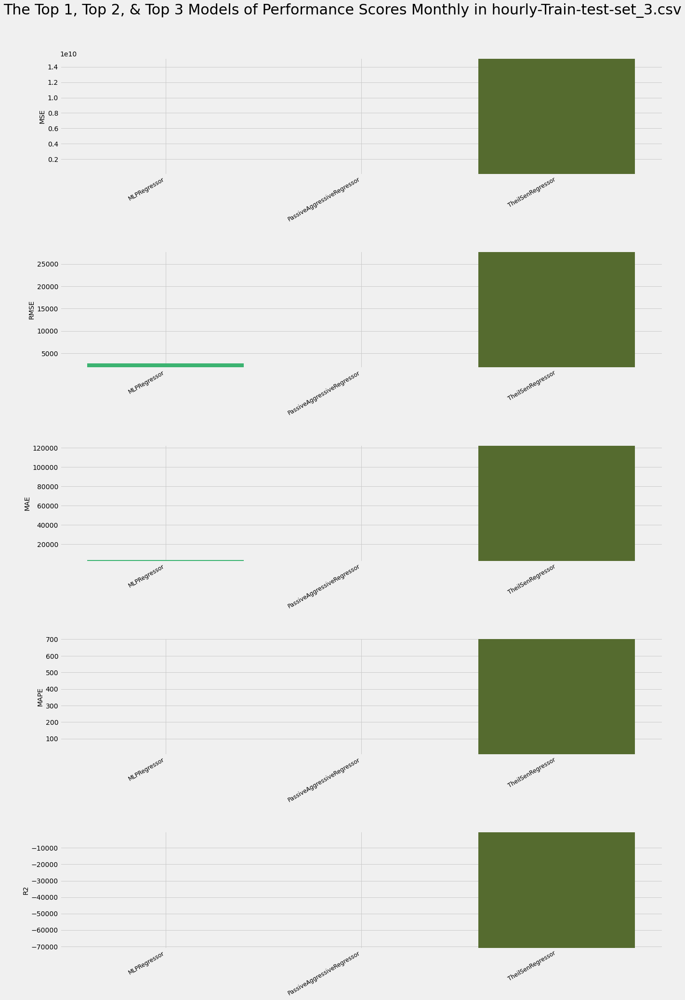

Top 3 models for each metric in hourly-Train-test-set_3.csv:
                                     MSE          RMSE            MAE  \
PassiveAggressiveRegressor  4.474291e+06   1701.492595    2115.252103   
MLPRegressor                1.194557e+07   2695.148730    3456.236448   
TheilSenRegressor           1.518771e+10  27874.280485  123238.420767   

                                  MAPE            R2  
PassiveAggressiveRegressor    2.443525    -19.947802  
MLPRegressor                  3.616260    -54.926942  
TheilSenRegressor           707.138270 -71105.030186  


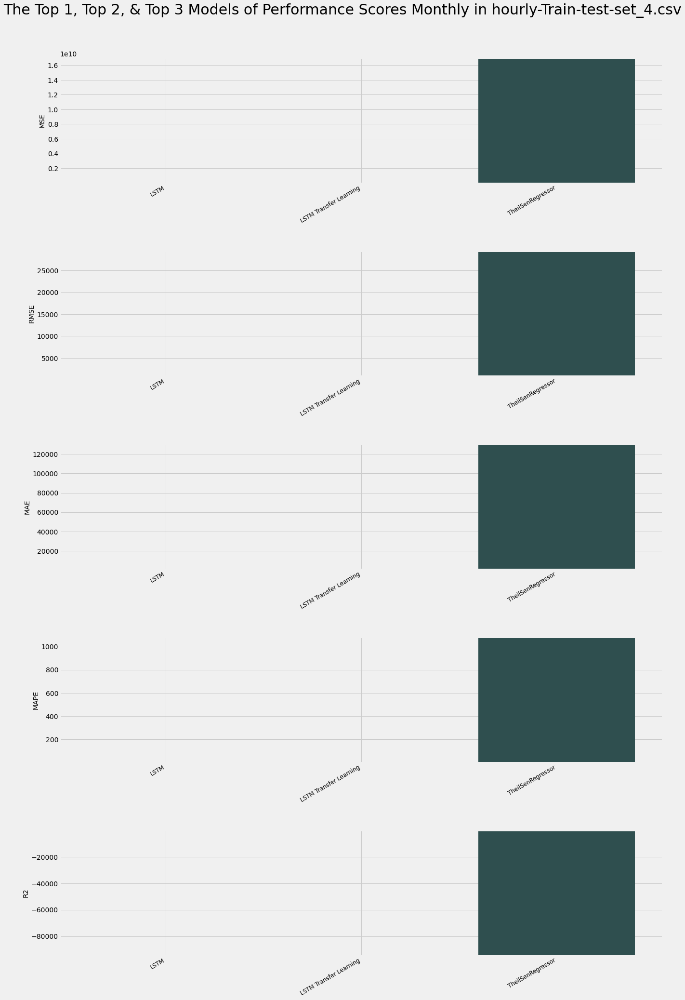

Top 3 models for each metric in hourly-Train-test-set_4.csv:
                                 MSE          RMSE            MAE  \
LSTM Transfer Learning  9.486678e+05    877.027213     973.995786   
LSTM                    9.671545e+05    887.596005     983.440137   
TheilSenRegressor       1.701509e+10  29428.830584  130441.910503   

                               MAPE            R2  
LSTM Transfer Learning     0.956179     -4.275667  
LSTM                       0.989089     -4.378474  
TheilSenRegressor       1080.764590 -94622.180256  


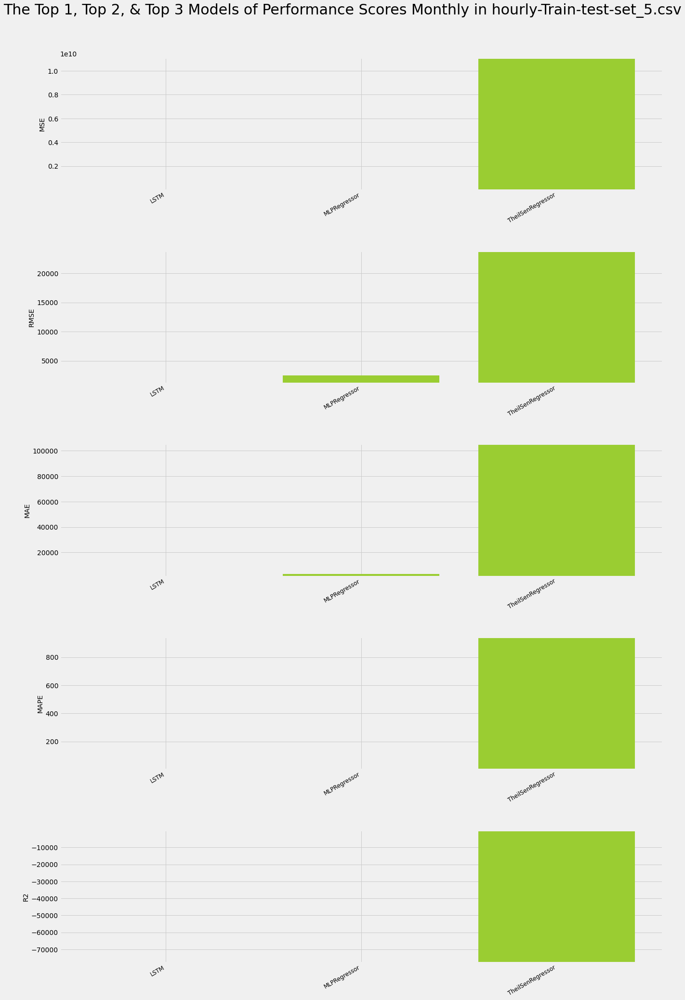

Top 3 models for each metric in hourly-Train-test-set_5.csv:
                            MSE          RMSE            MAE        MAPE  \
LSTM               1.508773e+06   1168.971526    1228.321115    0.983821   
MLPRegressor       9.052785e+06   2472.880289    3008.784684    2.780655   
TheilSenRegressor  1.109834e+10  23872.135222  105348.635871  942.509540   

                             R2  
LSTM                  -9.568558  
MLPRegressor         -62.412391  
TheilSenRegressor -77739.931858  


In [73]:
# Create a list of file names
files = ['hourly-Train-test-set_1.csv',
         'hourly-Train-test-set_2.csv',
         'hourly-Train-test-set_3.csv',
         'hourly-Train-test-set_4.csv',
         'hourly-Train-test-set_5.csv']

# Loop through each file and generate a bar plot for each score
for file in files:
    # Read the CSV file
    df = pd.read_csv(file)

    # Get the names of the models
    model_names = df.columns[1:]
    
    # Get the maximum scores for each model across all performance metrics
    max_scores = df.select_dtypes(include=[float]).loc[:, model_names].max()

    # Sort the models by their maximum score in descending order and select the top 3 models
    top_models = max_scores.sort_values(ascending=False).head(3).index.tolist()

    # Set the x-axis labels to the top 3 models
    x_labels = sorted(top_models)

    # Get the mean scores for each model and performance metric for the top 3 models
    mse_scores = df.select_dtypes(include=[float]).iloc[0].loc[x_labels].tolist()
    rmse_scores = df.select_dtypes(include=[float]).iloc[1].loc[x_labels].tolist()
    mae_scores = df.select_dtypes(include=[float]).iloc[2].loc[x_labels].tolist()
    mape_scores = df.select_dtypes(include=[float]).iloc[3].loc[x_labels].tolist()
    r2_scores = df.select_dtypes(include=[float]).iloc[4].loc[x_labels].tolist()

    # Set the y-axis labels and scores
    y_labels = ['MSE', 'RMSE', 'MAE', 'MAPE', 'R2']
    y_scores = [mse_scores, rmse_scores, mae_scores, mape_scores, r2_scores]

    # Define available colors
    colors = ['green', 'darkolivegreen', 'darkslategray', 'mediumseagreen', 'yellowgreen']

    # Generate random color for each bar
    bar_colors = [random.choice(colors) for a in range(len(x_labels))]

    # Create a bar plot for each score
    fig, axs = plt.subplots(nrows=5, figsize=(20, 30))

    for i, (label, score) in enumerate(zip(y_labels, y_scores)):
        axs[i].bar(x_labels, score, color=bar_colors)
        axs[i].set_xticklabels((x_labels), rotation=30, ha='right', fontsize=12)
        axs[i].set_ylabel(label, fontsize=14)
        axs[i].set_ylim(min(score), max(score))  # Set the y-axis limits

    plt.subplots_adjust(hspace=0.5)
    plt.suptitle(f'The Top 1, Top 2, & Top 3 Models of Performance Scores Monthly in {file}', fontsize=30)
    plt.tight_layout(pad=4)
    plt.show()

    # Create a dataframe to store the performance scores
    performance = pd.DataFrame(y_scores, columns=x_labels, index=y_labels)

    # Get the top 3 models for each metric
    performance_sorted = performance.T.sort_values(['MSE', 'RMSE', 'MAE', 'MAPE', 'R2'], ascending=True).head(3)
    print(f'Top 3 models for each metric in {file}:')
    print(performance_sorted)

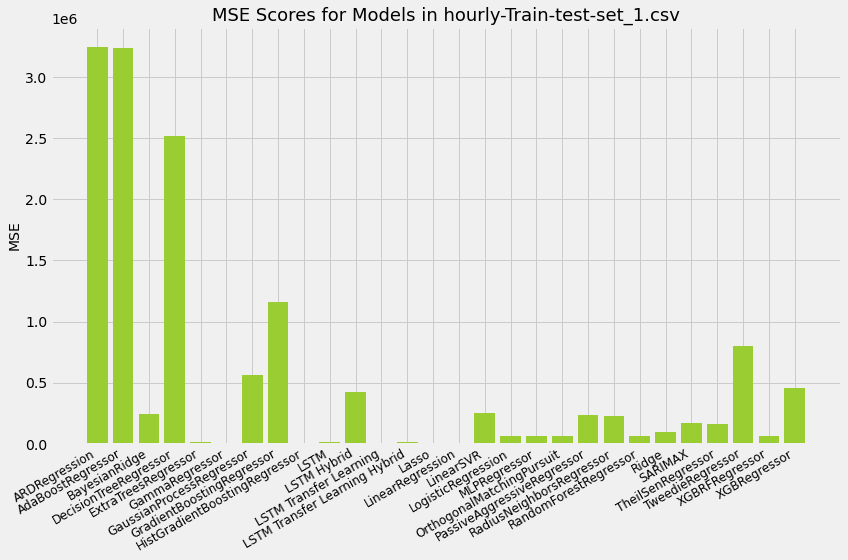

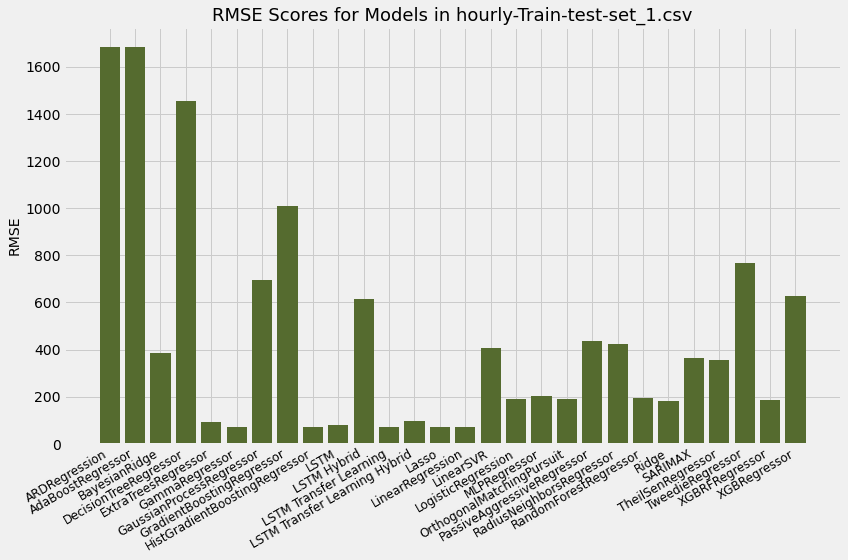

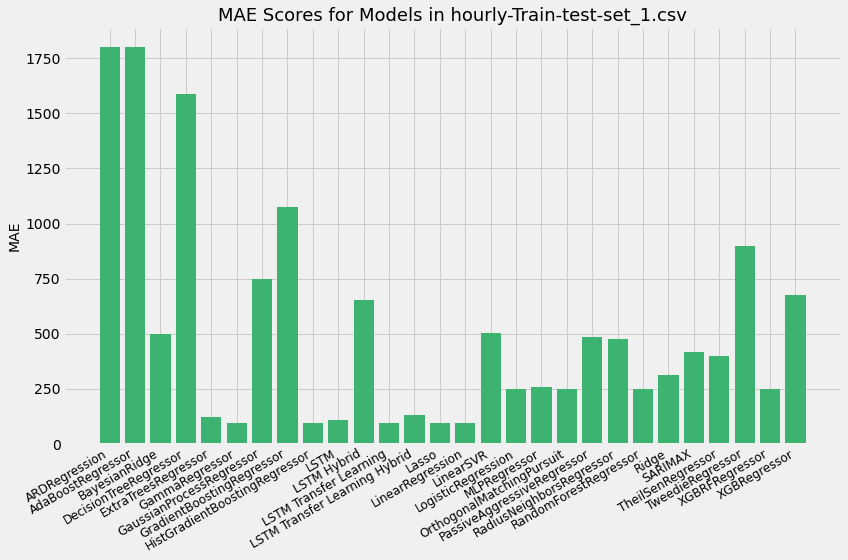

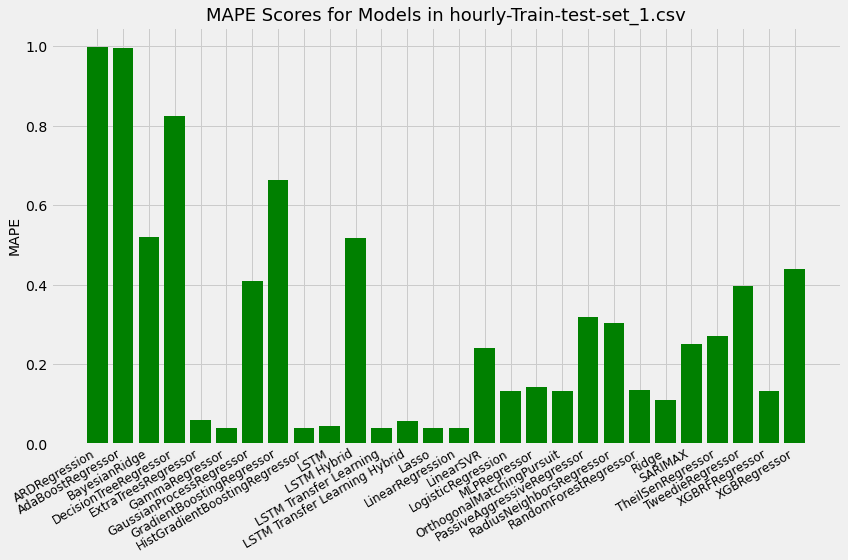

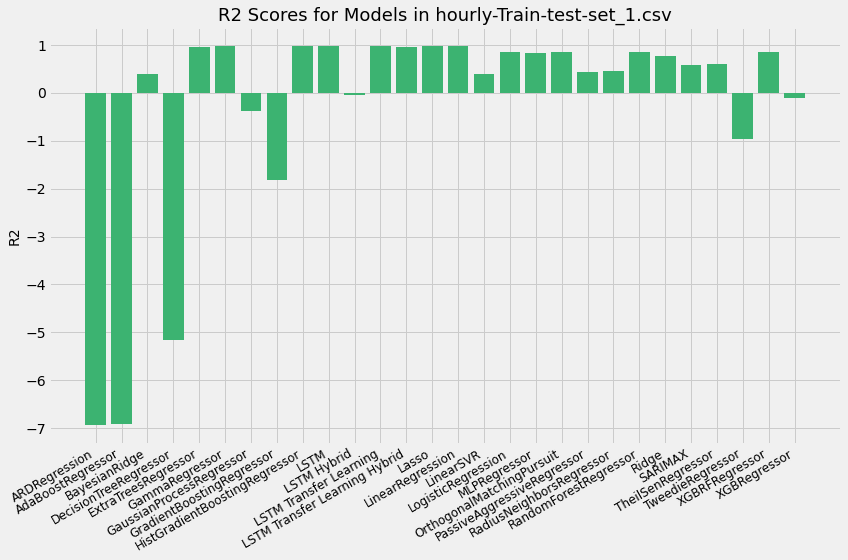

Top 3 Models based on Performance Metrics in hourly-Train-test-set_1.csv:
{'MSE': ['HistGradientBoostingRegressor', 'Lasso', 'LinearRegression'], 'RMSE': ['HistGradientBoostingRegressor', 'Lasso', 'LinearRegression'], 'MAE': ['HistGradientBoostingRegressor', 'Lasso', 'LinearRegression'], 'MAPE': ['HistGradientBoostingRegressor', 'Lasso', 'LinearRegression'], 'R2': ['ARDRegression', 'AdaBoostRegressor', 'DecisionTreeRegressor']}


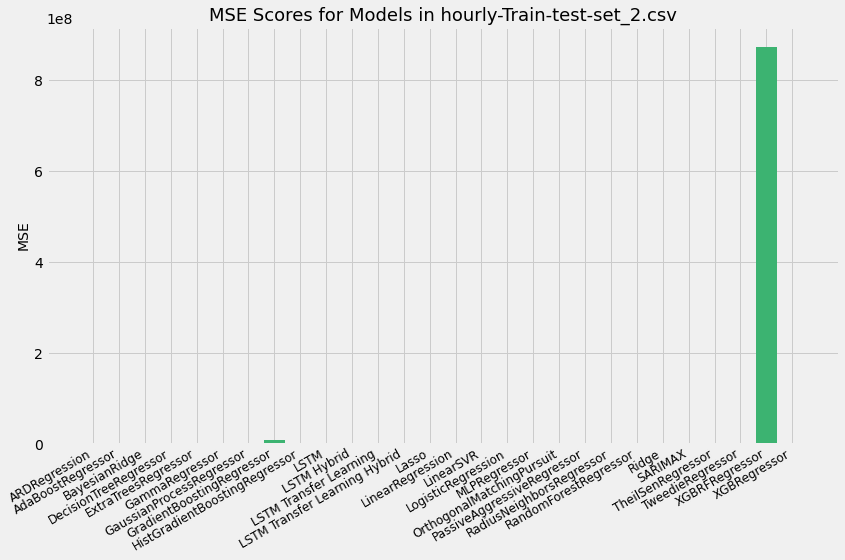

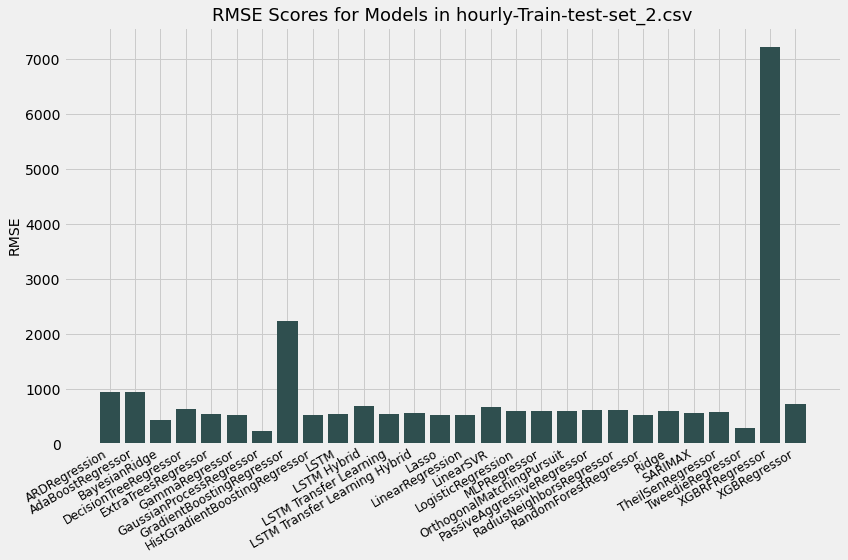

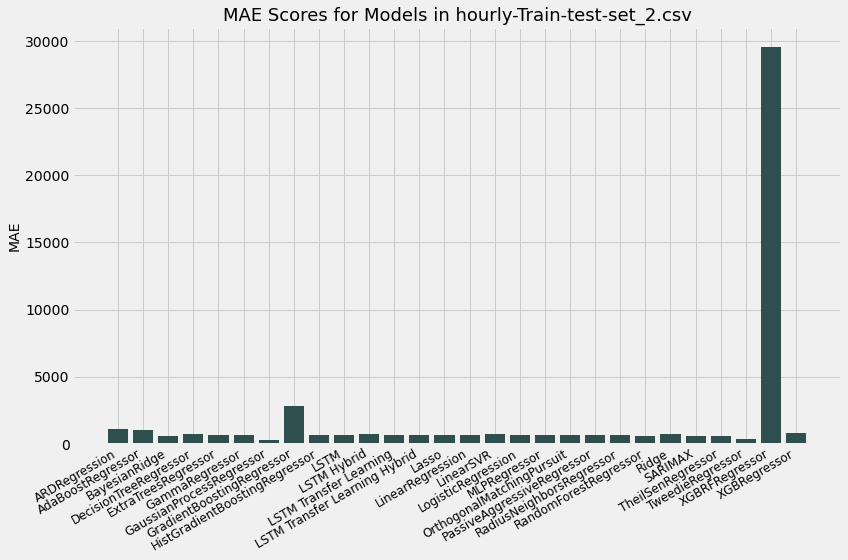

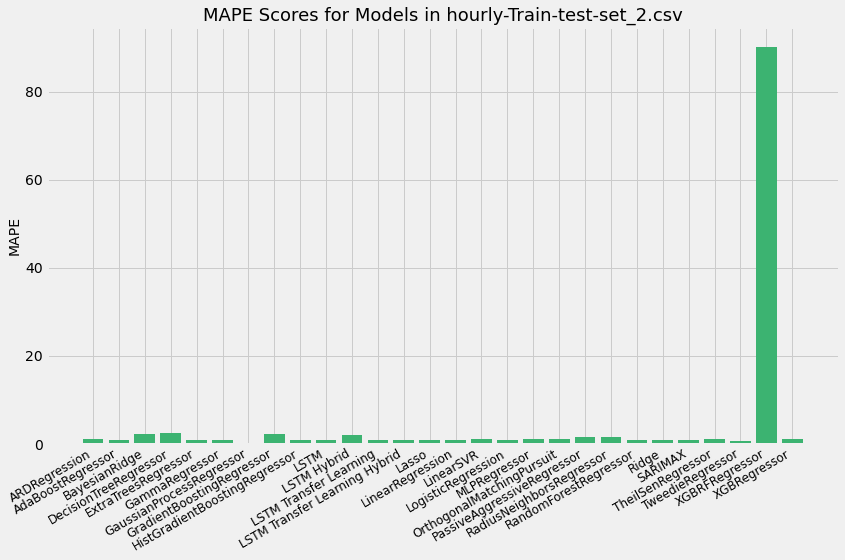

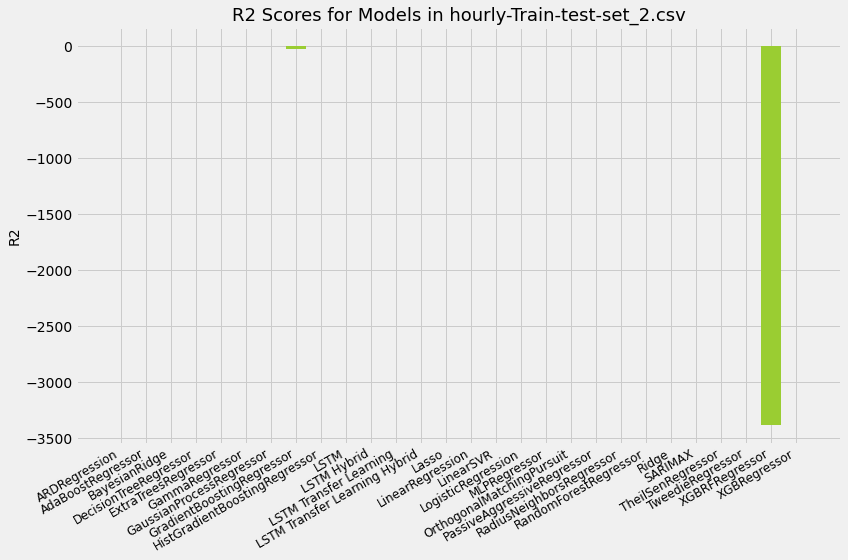

Top 3 Models based on Performance Metrics in hourly-Train-test-set_2.csv:
{'MSE': ['GaussianProcessRegressor', 'TweedieRegressor', 'BayesianRidge'], 'RMSE': ['GaussianProcessRegressor', 'TweedieRegressor', 'BayesianRidge'], 'MAE': ['GaussianProcessRegressor', 'TweedieRegressor', 'BayesianRidge'], 'MAPE': ['GaussianProcessRegressor', 'TweedieRegressor', 'HistGradientBoostingRegressor'], 'R2': ['XGBRFRegressor', 'GradientBoostingRegressor', 'ARDRegression']}


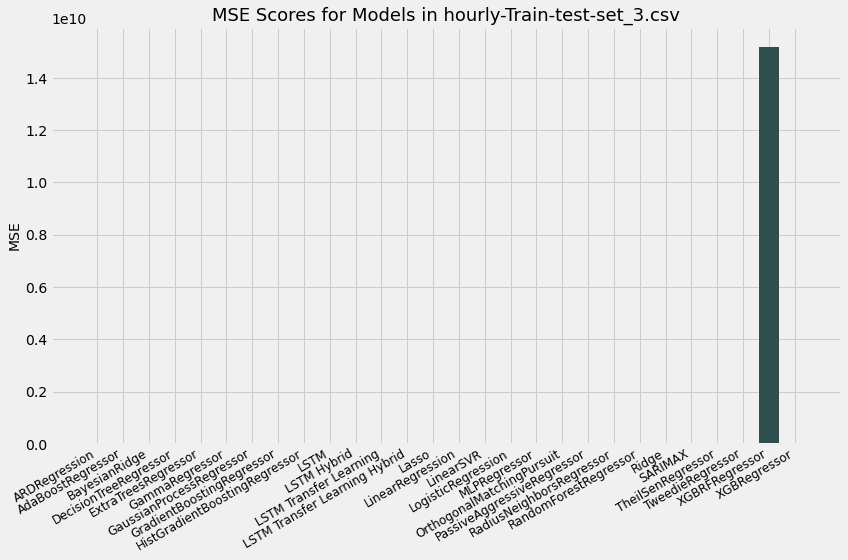

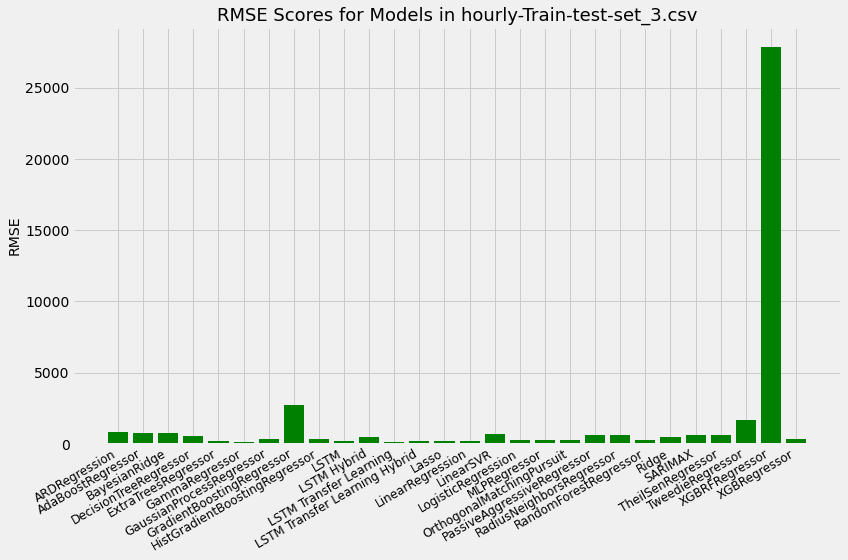

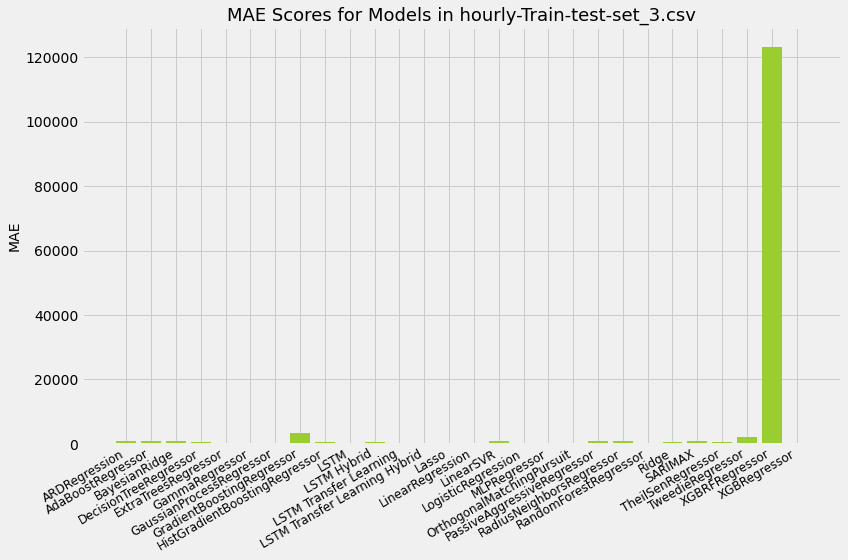

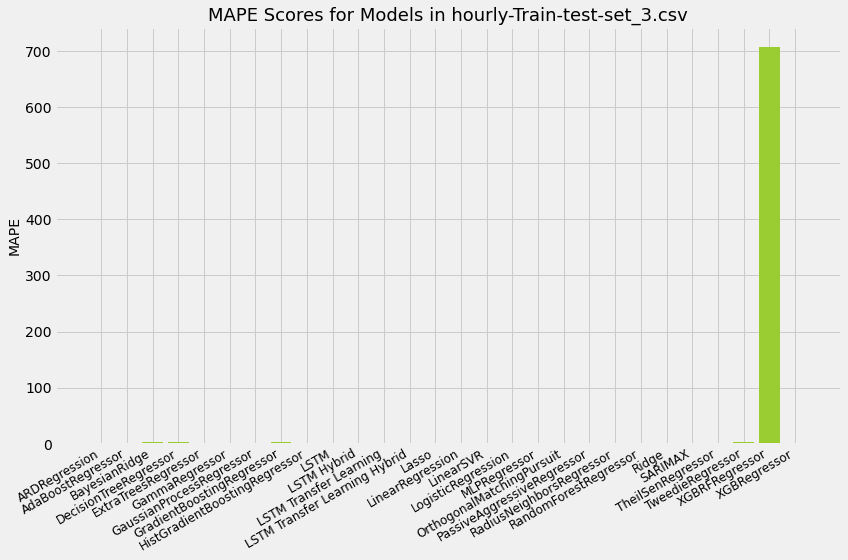

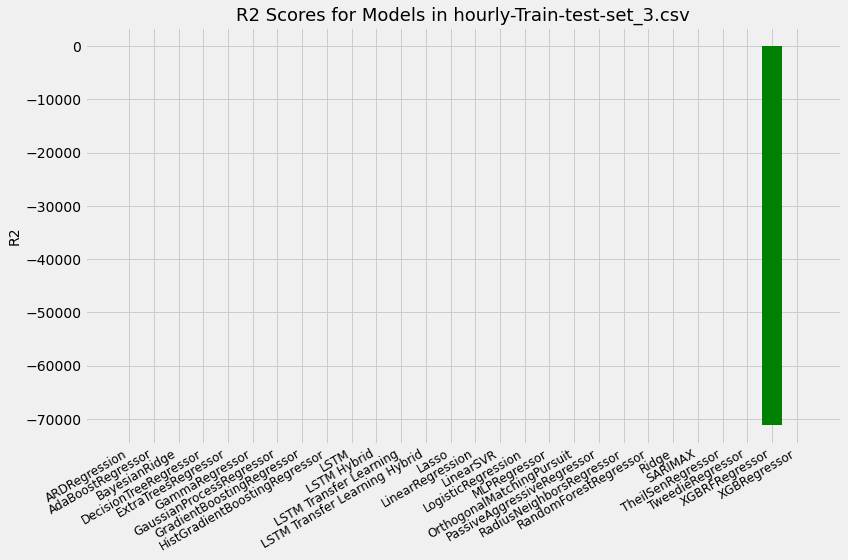

Top 3 Models based on Performance Metrics in hourly-Train-test-set_3.csv:
{'MSE': ['GammaRegressor', 'LSTM Transfer Learning', 'LSTM'], 'RMSE': ['GammaRegressor', 'LSTM Transfer Learning', 'LinearRegression'], 'MAE': ['GammaRegressor', 'LSTM Transfer Learning', 'LSTM'], 'MAPE': ['LSTM Transfer Learning', 'GammaRegressor', 'LinearRegression'], 'R2': ['XGBRFRegressor', 'GradientBoostingRegressor', 'TweedieRegressor']}


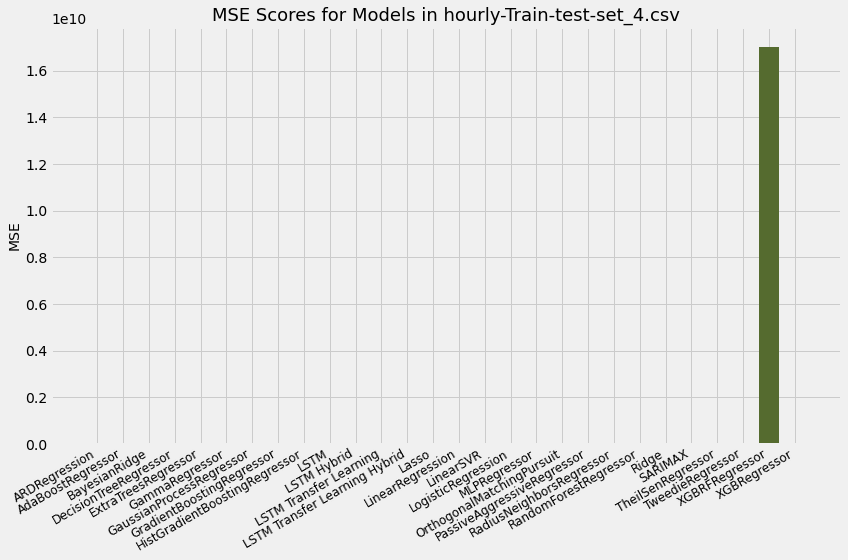

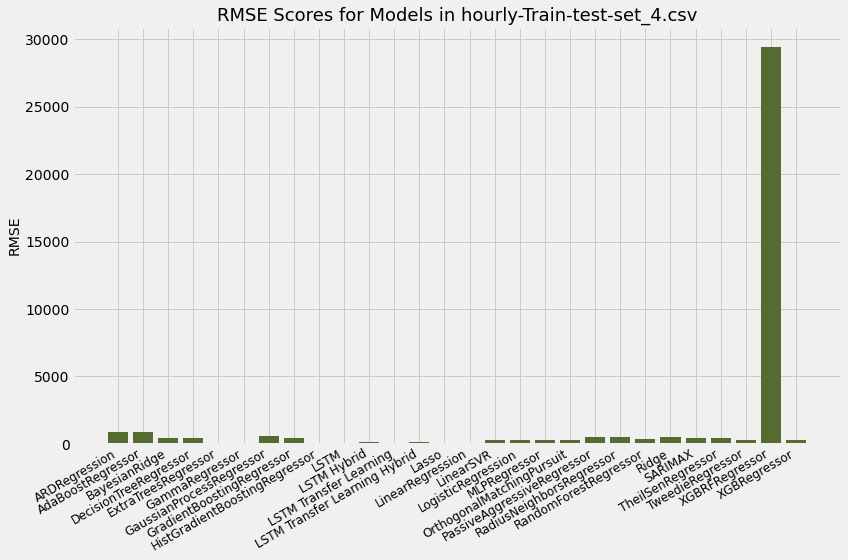

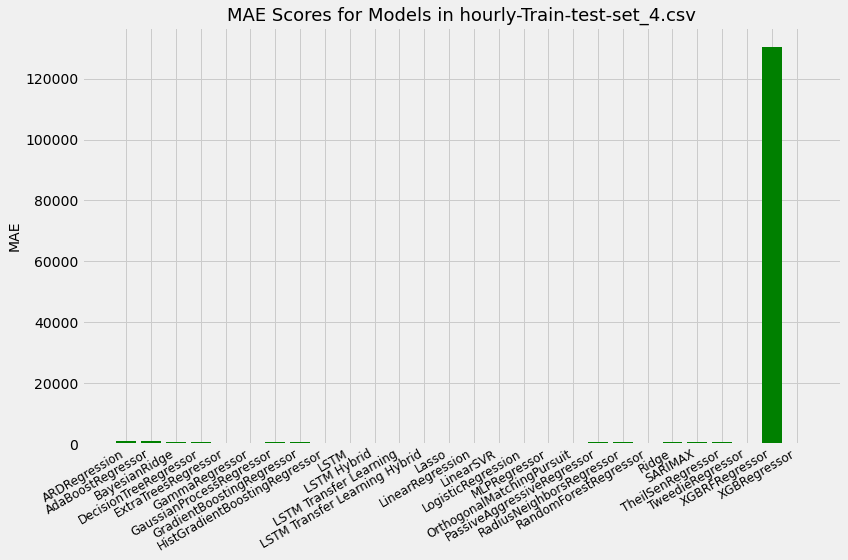

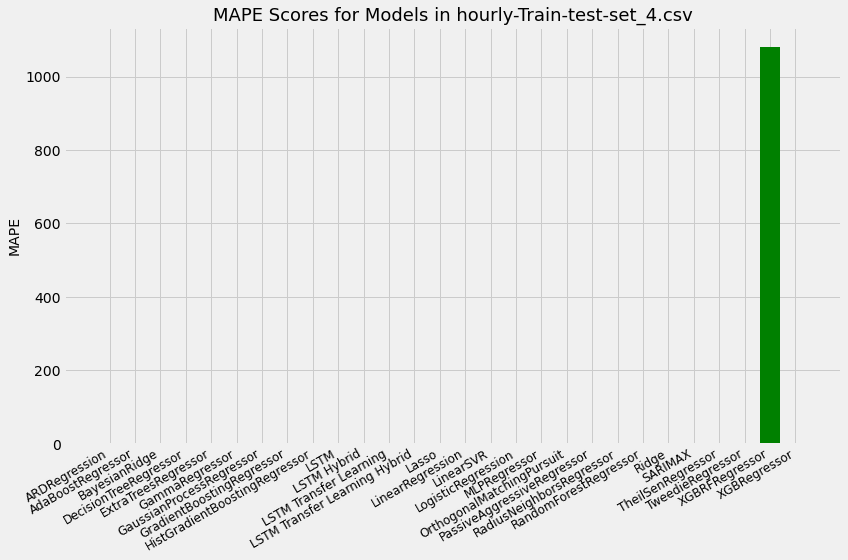

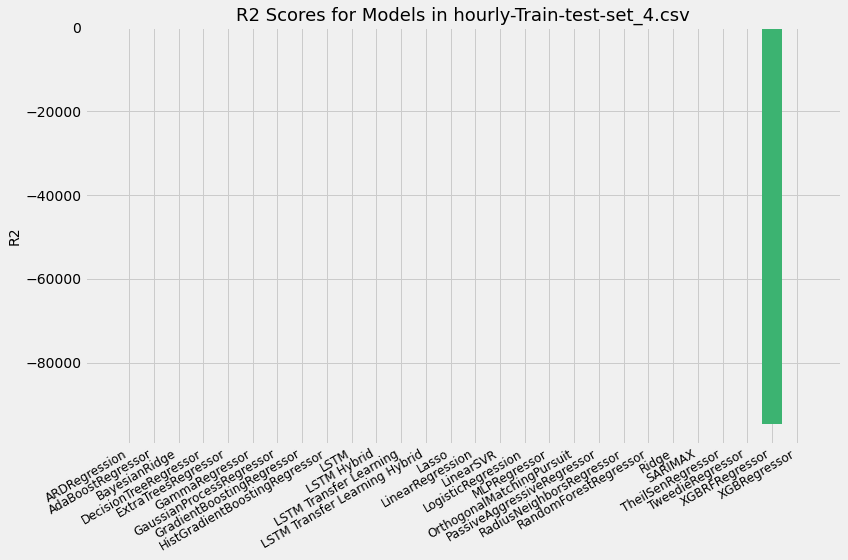

Top 3 Models based on Performance Metrics in hourly-Train-test-set_4.csv:
{'MSE': ['LSTM Transfer Learning', 'ExtraTreesRegressor', 'HistGradientBoostingRegressor'], 'RMSE': ['LSTM Transfer Learning', 'ExtraTreesRegressor', 'HistGradientBoostingRegressor'], 'MAE': ['LSTM Transfer Learning', 'ExtraTreesRegressor', 'HistGradientBoostingRegressor'], 'MAPE': ['HistGradientBoostingRegressor', 'LinearRegression', 'Lasso'], 'R2': ['XGBRFRegressor', 'ARDRegression', 'AdaBoostRegressor']}


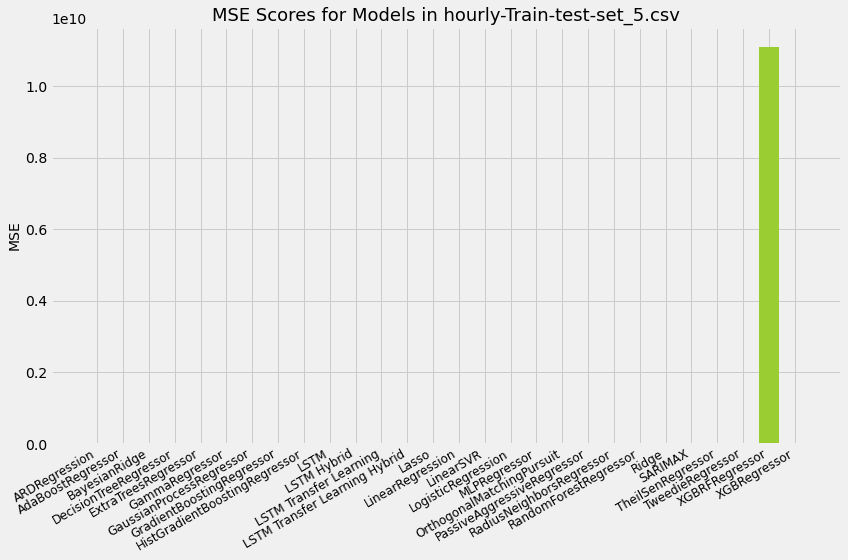

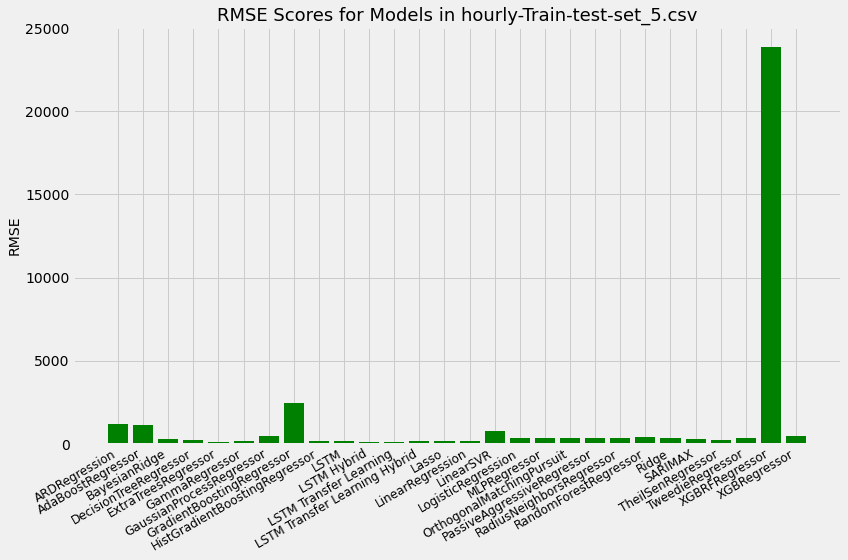

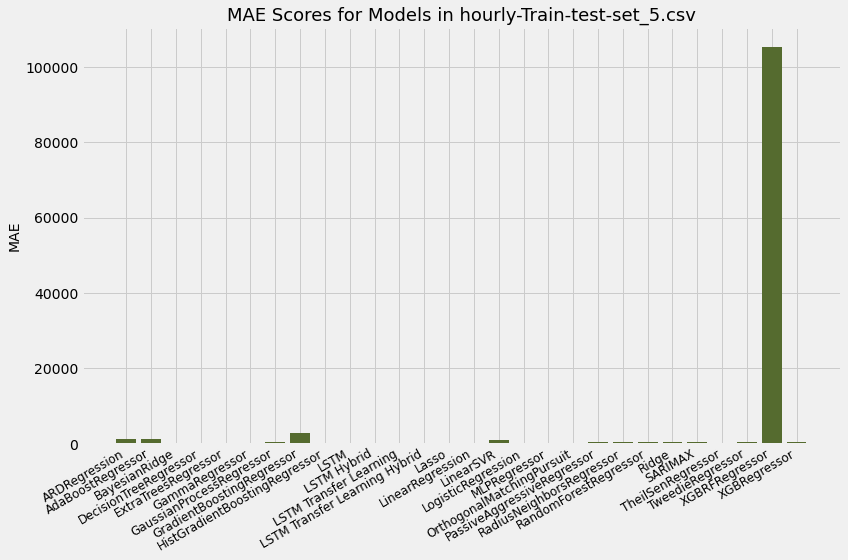

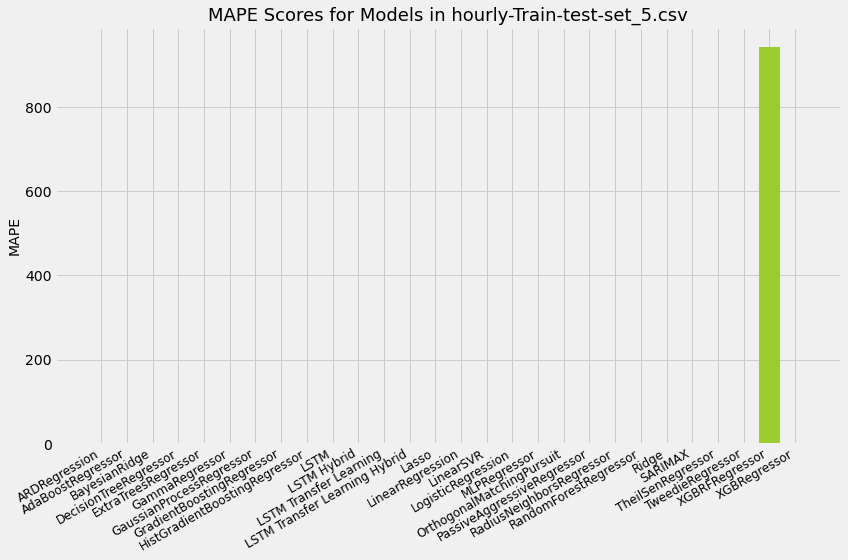

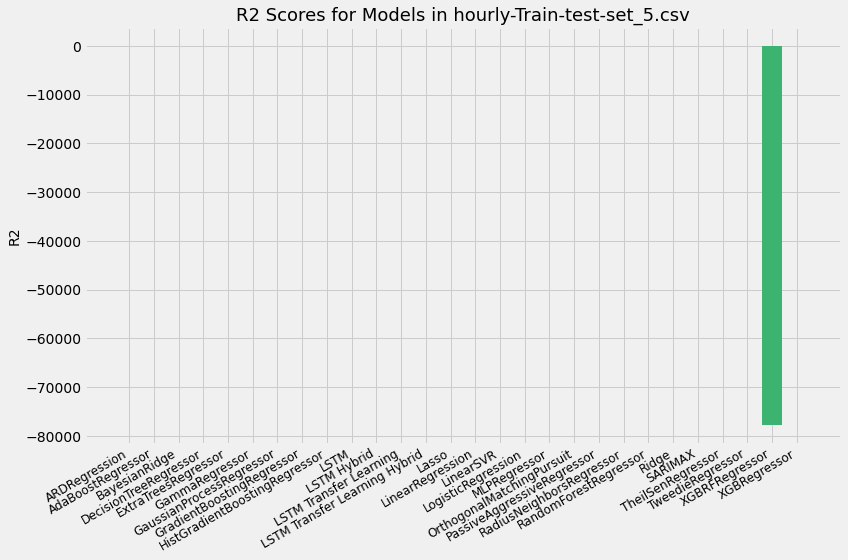

Top 3 Models based on Performance Metrics in hourly-Train-test-set_5.csv:
{'MSE': ['LSTM Transfer Learning', 'LSTM Hybrid', 'ExtraTreesRegressor'], 'RMSE': ['LSTM Transfer Learning', 'ExtraTreesRegressor', 'LSTM Hybrid'], 'MAE': ['LSTM Transfer Learning', 'LSTM Hybrid', 'ExtraTreesRegressor'], 'MAPE': ['HistGradientBoostingRegressor', 'Lasso', 'LinearRegression'], 'R2': ['XGBRFRegressor', 'GradientBoostingRegressor', 'ARDRegression']}
Top 3 Models based on MSE: ['LinearRegression', 'Lasso', 'HistGradientBoostingRegressor']
Top 3 Models based on RMSE: ['LinearRegression', 'Lasso', 'HistGradientBoostingRegressor']
Top 3 Models based on MAE: ['LinearRegression', 'Lasso', 'HistGradientBoostingRegressor']
Top 3 Models based on MAPE: ['LinearRegression', 'Lasso', 'HistGradientBoostingRegressor']
Top 3 Models based on R2: ['XGBRFRegressor', 'XGBRFRegressor', 'XGBRFRegressor']


In [74]:
# Create a list of file names
files = ['hourly-Train-test-set_1.csv',
         'hourly-Train-test-set_2.csv',
         'hourly-Train-test-set_3.csv',
         'hourly-Train-test-set_4.csv',
         'hourly-Train-test-set_5.csv']

# Define performance metrics
metrics = ['MSE', 'RMSE', 'MAE', 'MAPE', 'R2']

# Create an empty dataframe to store all performance scores
all_scores = pd.DataFrame(columns=['Model'] + metrics)

# Loop through each file and generate a bar plot for each score
for file in files:
    # Read the CSV file
    df = pd.read_csv(file)

    # Get the names of the models
    model_names = df.columns[1:]

    # Set the x-axis labels
    x_labels = sorted(model_names)

    # Get the performance scores for each model and metric
    scores = {}
    for metric in metrics:
        metric_scores = df.select_dtypes(include=[float]).iloc[metrics.index(metric)].loc[model_names].tolist()
        scores[metric] = metric_scores
        all_scores = all_scores.append(pd.DataFrame({'Model': x_labels, metric: metric_scores}), ignore_index=True)

        # Create a bar plot for the metric
        fig, ax = plt.subplots(figsize=(12, 8))
        ax.bar(x_labels, metric_scores, color=random.choice(['green', 'darkolivegreen', 'darkslategray', 'mediumseagreen', 'yellowgreen']))
        ax.set_xticklabels(x_labels, rotation=30, ha='right', fontsize=12)
        ax.set_ylabel(metric, fontsize=14)
        ax.set_title(f'{metric} Scores for Models in {file}', fontsize=18)
        plt.tight_layout()
        plt.show()

    # Find the top 3 models based on each metric
    top3 = {}
    for metric in metrics:
        metric_scores = scores[metric]
        metric_top3 = [x for _, x in sorted(zip(metric_scores, x_labels))][:3]
        top3[metric] = metric_top3
    print(f'Top 3 Models based on Performance Metrics in {file}:')
    print(top3)

# Sort the all_scores dataframe by each metric and print the top 3 models for each metric
for metric in metrics:
    sorted_scores = all_scores.sort_values(metric)
    top3_models = sorted_scores['Model'].head(3).tolist()
    print(f'Top 3 Models based on {metric}: {top3_models}')

In [76]:
# Create a list to store the performance dataframes
performance_dataframes = []

# Create a list of file names
files = ['hourly-Train-test-set_1.csv',
         'hourly-Train-test-set_2.csv',
         'hourly-Train-test-set_3.csv',
         'hourly-Train-test-set_4.csv',
         'hourly-Train-test-set_5.csv']

# Load each CSV file into a DataFrame and store them in a list
dfs = [pd.read_csv(file) for file in files]

# Concatenate the DataFrames in the list vertically (i.e. stack them on top of each other)
combined_df = pd.concat(dfs, axis=0)

# Write the combined DataFrame to a new CSV file
combined_df.to_csv('combined_hourly_train_test_sets.csv', index=False)

                                     MSE         RMSE          MAE      MAPE  \
TheilSenRegressor           6.138780e+04   187.168323   247.765623  0.131850   
PassiveAggressiveRegressor  8.040518e+05   769.239602   896.689328  0.396494   
MLPRegressor                1.157211e+06  1009.006623  1075.737389  0.663626   

                                  R2  
TheilSenRegressor           0.850031  
PassiveAggressiveRegressor -0.964285  
MLPRegressor               -1.827046  


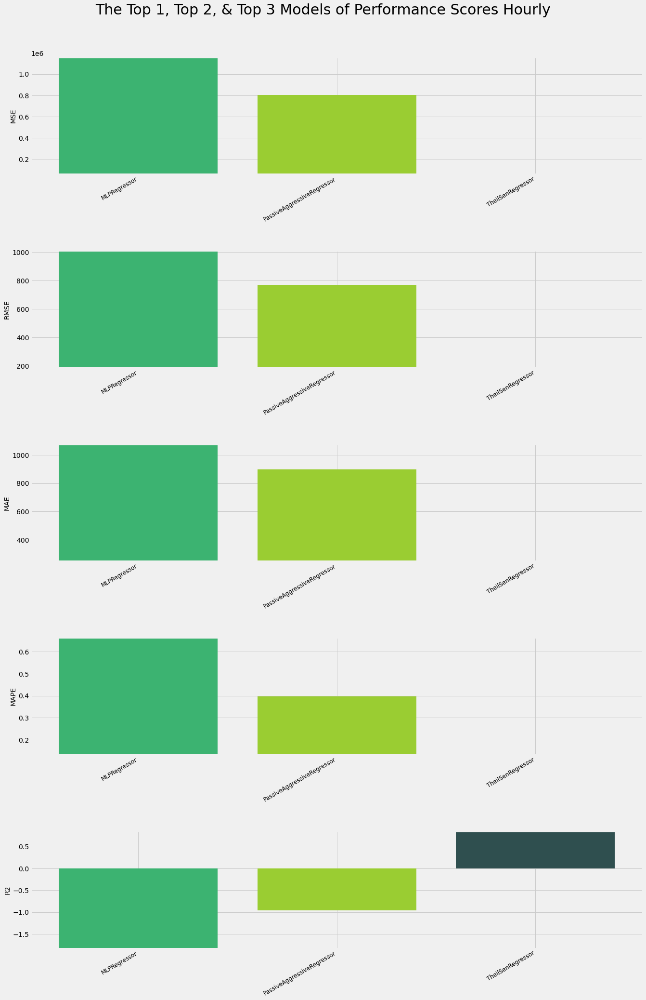

In [86]:
# Read the combined CSV file
df = pd.read_csv('combined_hourly_train_test_sets.csv')

# Get the names of the models
model_names = df.columns[1:]

# Get the maximum scores for each model across all performance metrics
max_scores = df.select_dtypes(include=[float]).loc[:, model_names].max()

# Sort the models by their maximum score in descending order and select the top 3 models
top_models = max_scores.sort_values(ascending=False).head(3).index.tolist()

# Set the x-axis labels to the top 3 models
x_labels = sorted(top_models)

# Get the mean scores for each model and performance metric for the top 3 models
mse_scores = df.select_dtypes(include=[float]).iloc[0].loc[x_labels].tolist()
rmse_scores = df.select_dtypes(include=[float]).iloc[1].loc[x_labels].tolist()
mae_scores = df.select_dtypes(include=[float]).iloc[2].loc[x_labels].tolist()
mape_scores = df.select_dtypes(include=[float]).iloc[3].loc[x_labels].tolist()
r2_scores = df.select_dtypes(include=[float]).iloc[4].loc[x_labels].tolist()

# Set the y-axis labels and scores
y_labels = ['MSE', 'RMSE', 'MAE', 'MAPE', 'R2']
y_scores = [mse_scores, rmse_scores, mae_scores, mape_scores, r2_scores]

# Define available colors
colors = ['green', 'darkolivegreen', 'darkslategray', 'mediumseagreen', 'yellowgreen']

# Generate random color for each bar
bar_colors = [random.choice(colors) for a in range(len(x_labels))]

# Create a bar plot for each score
fig, axs = plt.subplots(nrows=5, figsize=(20, 30))

for i, (label, score) in enumerate(zip(y_labels, y_scores)):
    axs[i].bar(x_labels, score, color=bar_colors)
    axs[i].set_xticklabels((x_labels), rotation=30, ha='right', fontsize=12)
    axs[i].set_ylabel(label, fontsize=14)
    axs[i].set_ylim(min(score), max(score))  # Set the y-axis limits

plt.subplots_adjust(hspace=0.5)
plt.suptitle('The Top 1, Top 2, & Top 3 Models of Performance Scores Hourly', fontsize=30)
plt.tight_layout(pad=4)

# Create a dataframe to store the performance scores
performance = pd.DataFrame(y_scores, columns=x_labels, index=y_labels)

# Get the top 3 models for each metric
performance_sorted = performance.T.sort_values(['MSE', 'RMSE', 'MAE', 'MAPE', 'R2'])
print(performance_sorted)


In [84]:
# Create a list to store the performance dataframes
performance_dataframes = []

# Create a list of file names
files = ['monthly-Train-test-set_1.csv',
         'monthly-Train-test-set_2.csv',
         'monthly-Train-test-set_3.csv',
         'monthly-Train-test-set_4.csv',
         'monthly-Train-test-set_5.csv']

# Load each CSV file into a DataFrame and store them in a list
dfs = [pd.read_csv(file) for file in files]

# Concatenate the DataFrames in the list vertically (i.e. stack them on top of each other)
combined_df = pd.concat(dfs, axis=0)

# Write the combined DataFrame to a new CSV file
combined_df.to_csv('combined_monthly_train_test_sets.csv', index=False)

                                 MSE         RMSE          MAE      MAPE  \
TheilSenRegressor       3.827893e+04   153.378345   195.650023  0.046521   
LSTM Transfer Learning  1.065409e+07  3255.780684  3264.060695  0.998330   
LSTM                    1.067938e+07  3259.662524  3267.932699  0.999526   

                                R2  
TheilSenRegressor         0.290926  
LSTM Transfer Learning -196.355164  
LSTM                   -196.823668  


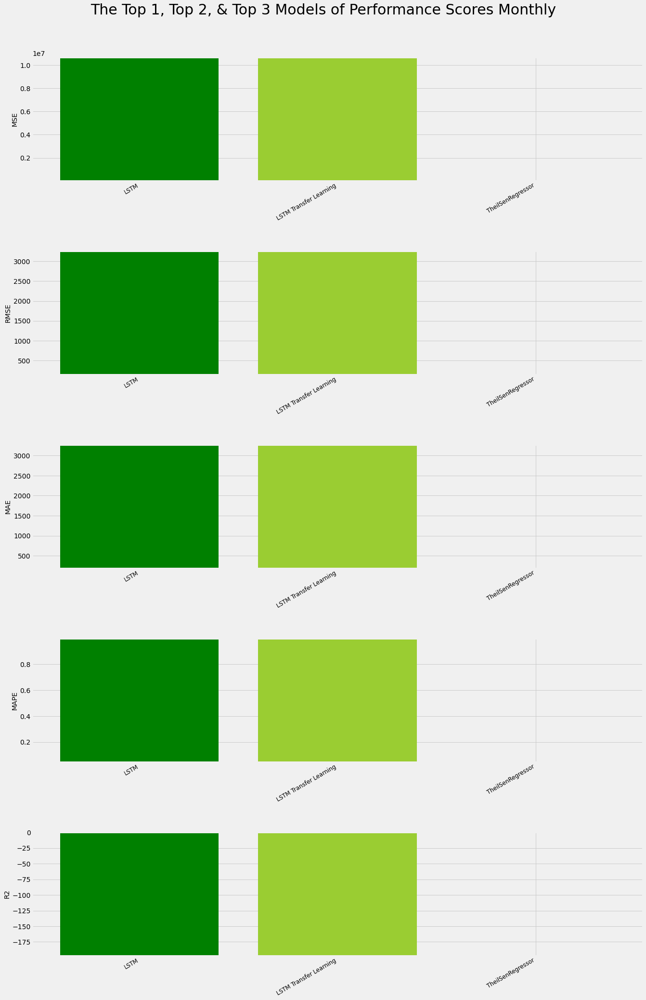

In [87]:
# Read the combined CSV file
df = pd.read_csv('combined_monthly_train_test_sets.csv')

# Get the names of the models
model_names = df.columns[1:]

# Get the maximum scores for each model across all performance metrics
max_scores = df.select_dtypes(include=[float]).loc[:, model_names].max()

# Sort the models by their maximum score in descending order and select the top 3 models
top_models = max_scores.sort_values(ascending=False).head(3).index.tolist()

# Set the x-axis labels to the top 3 models
x_labels = sorted(top_models)

# Get the mean scores for each model and performance metric for the top 3 models
mse_scores = df.select_dtypes(include=[float]).iloc[0].loc[x_labels].tolist()
rmse_scores = df.select_dtypes(include=[float]).iloc[1].loc[x_labels].tolist()
mae_scores = df.select_dtypes(include=[float]).iloc[2].loc[x_labels].tolist()
mape_scores = df.select_dtypes(include=[float]).iloc[3].loc[x_labels].tolist()
r2_scores = df.select_dtypes(include=[float]).iloc[4].loc[x_labels].tolist()

# Set the y-axis labels and scores
y_labels = ['MSE', 'RMSE', 'MAE', 'MAPE', 'R2']
y_scores = [mse_scores, rmse_scores, mae_scores, mape_scores, r2_scores]

# Define available colors
colors = ['green', 'darkolivegreen', 'darkslategray', 'mediumseagreen', 'yellowgreen']

# Generate random color for each bar
bar_colors = [random.choice(colors) for a in range(len(x_labels))]

# Create a bar plot for each score
fig, axs = plt.subplots(nrows=5, figsize=(20, 30))

for i, (label, score) in enumerate(zip(y_labels, y_scores)):
    axs[i].bar(x_labels, score, color=bar_colors)
    axs[i].set_xticklabels((x_labels), rotation=30, ha='right', fontsize=12)
    axs[i].set_ylabel(label, fontsize=14)
    axs[i].set_ylim(min(score), max(score))  # Set the y-axis limits

plt.subplots_adjust(hspace=0.5)
plt.suptitle('The Top 1, Top 2, & Top 3 Models of Performance Scores Monthly', fontsize=30)
plt.tight_layout(pad=4)

# Create a dataframe to store the performance scores
performance = pd.DataFrame(y_scores, columns=x_labels, index=y_labels)

# Get the top 3 models for each metric
performance_sorted = performance.T.sort_values(['MSE', 'RMSE', 'MAE', 'MAPE', 'R2'])
print(performance_sorted)
